### Packages

In [1]:
# Python packages
import numpy as np
import pandas as pd
import datetime
import pandas_datareader.data as web
import re
from arch import arch_model
from typing import Union

In [2]:
# R packages
import rpy2.robjects as ro
from rpy2.robjects import pandas2ri, numpy2ri, r, globalenv, default_converter
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from rpy2.robjects.vectors import StrVector

base = importr('base')
methods = importr('methods')
rugarch = importr('rugarch')
rmgarch = importr('rmgarch')

Error importing in API mode: ImportError('On Windows, cffi mode "ANY" is only "ABI".')
Trying to import in ABI mode.


Matplotlib settings

In [3]:
# For the most beautiful plots!
from pathlib import Path
import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rcParams["text.usetex"] = False

mpl.rcParams.update({
    # Fonts + sizes
    "font.family": "serif",
    "font.serif": ["STIXGeneral", "DejaVu Serif"],
    "mathtext.fontset": "stix",
    "font.size": 10,
    "axes.titlesize": 10,
    "axes.labelsize": 10,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,

    # Ticks
    "xtick.direction": "out",
    "ytick.direction": "out",
    "xtick.major.size": 3,
    "ytick.major.size": 3,
    "xtick.major.width": 0.8,
    "ytick.major.width": 0.8,
    "xtick.minor.visible": False,
    "ytick.minor.visible": False,

    # Lines / axes / legend
    "axes.linewidth": 0.7,
    "lines.linewidth": 0.6,
    "legend.frameon": True,
    "axes.xmargin":(0.02),

    # Grid style (but not on/off)
    "axes.grid": False,
    "grid.alpha": 0.18,
    "grid.linewidth": 0.6,
    "grid.linestyle": "-",
})

# Output folder (created once)
FIG_DIR = Path("./Outputs/Figures")
FIG_DIR.mkdir(parents=True, exist_ok=True)

# Canonical sizes for your LaTeX document
FIG_FULL = (6.5, 3.2)   # ~ \textwidth
FIG_HALF = (3.2, 2.4)   # ~ 0.49\textwidth (two side-by-side)

%config InlineBackend.figure_format = 'retina'
mpl.rcParams["figure.dpi"] = 160      # bigger/sharper in notebook
mpl.rcParams["savefig.dpi"] = 300     # only affects PNG exports, PDF unaffected

### Data collection & initial visualization

Collect G-SIBs, O-SIIs and MSCI World/Europe Banks data from Data request file.

In [4]:
# Load the Excel file with multiple sheets from the Data folder
excel_file = pd.ExcelFile('./Data GSIBs OSIIs.xlsx', engine='openpyxl')

# Display the sheet names to understand the structure of the file
print("Sheet names:", excel_file.sheet_names)

# Load all sheets into separate DataFrames
GSIBs = excel_file.parse('G-SIBs')
OSIIs = excel_file.parse('O-SIIs')
GSIBs_prices = excel_file.parse('G-SIBs Price')
GSIBs_equity = excel_file.parse('G-SIBs Marktwaarde')
GSIBs_liabilities = excel_file.parse('G-SIBs Liabilities')
GSIBs_assets = excel_file.parse('G-SIBs Assets')
OSIIs_prices = excel_file.parse('O-SIIs Price')
OSIIs_equity = excel_file.parse('O-SIIs Marktwaarde')
OSIIs_liabilities = excel_file.parse('O-SIIs Liabilities')
OSIIs_assets = excel_file.parse('O-SIIs Assets')
MSCI_indices = excel_file.parse('MSCI Indices')

# Set 'DATE' as the index for prices, equity, and MSCI Indices dataframes
GSIBs_prices.set_index('DATE', inplace=True)
GSIBs_equity.set_index('DATE', inplace=True)
OSIIs_prices.set_index('DATE', inplace=True)
OSIIs_equity.set_index('DATE', inplace=True)
MSCI_indices.set_index('DATE', inplace=True)

# For the sheets with the first column 'PERIOD', convert 'PERIOD' to datetime
def period_to_quarter_end(s: str) -> Union[pd.Timestamp, pd.NaT]:
    """
    Parse strings like 'Q1 2008' → quarter-end timestamp.
    Assumes calendar quarters (Q-DEC). If your data uses fiscal quarters,
    adjust freq (e.g., 'Q-MAR' or 'Q-JUN').
    """
    if not isinstance(s, str):
        return pd.NaT
    m = re.match(r'^Q([1-4])\s+(\d{4})$', s.strip())
    if not m:
        return pd.NaT
    q = int(m.group(1))
    y = int(m.group(2))
    # Calendar year with quarter ending in Dec (Mar/Jun/Sep/Dec quarters):
    p = pd.Period(f'{y}Q{q}', freq='Q-DEC')
    return p.to_timestamp(how='end')  # quarter end (e.g., 2008-03-31)

# Apply the conversion to the 'PERIOD' column and set it as the index for liabilities and assets dataframes
GSIBs_liabilities['PERIOD'] = GSIBs_liabilities['PERIOD'].apply(period_to_quarter_end)
GSIBs_liabilities.set_index('PERIOD', inplace=True)
GSIBs_assets['PERIOD'] = GSIBs_assets['PERIOD'].apply(period_to_quarter_end)
GSIBs_assets.set_index('PERIOD', inplace=True)
OSIIs_liabilities['PERIOD'] = OSIIs_liabilities['PERIOD'].apply(period_to_quarter_end)
OSIIs_liabilities.set_index('PERIOD', inplace=True)
OSIIs_assets['PERIOD'] = OSIIs_assets['PERIOD'].apply(period_to_quarter_end)
OSIIs_assets.set_index('PERIOD', inplace=True)

# Convert liabilities and assets from thousands to millions to match equity values
for df_name in ["GSIBs_liabilities", "GSIBs_assets", "OSIIs_liabilities", "OSIIs_assets"]:
    df = globals()[df_name]

    # ensure numeric where possible; non-numeric becomes NaN
    df = df.apply(pd.to_numeric, errors="coerce") / 1000

    globals()[df_name] = df

# Convert prices for UK banks from GBp to GBP by dividing by 100, banks in columns 14, 15, and 16
GSIBs_prices.iloc[:, 13:16] = GSIBs_prices.iloc[:, 13:16] / 100

# Reverse the dataframes to have the most recent dates first
GSIBs = GSIBs.iloc[::-1]
OSIIs = OSIIs.iloc[::-1]
GSIBs_prices = GSIBs_prices.iloc[::-1]
GSIBs_equity = GSIBs_equity.iloc[::-1]
GSIBs_liabilities = GSIBs_liabilities.iloc[::-1]
GSIBs_assets = GSIBs_assets.iloc[::-1]
OSIIs_prices = OSIIs_prices.iloc[::-1]
OSIIs_equity = OSIIs_equity.iloc[::-1]
OSIIs_liabilities = OSIIs_liabilities.iloc[::-1]
OSIIs_assets = OSIIs_assets.iloc[::-1]
MSCI_indices = MSCI_indices.iloc[::-1]

# Display the first few rows and columns of the GSIBs_prices dataframe
print("GSIBs_prices DataFrame (first 5 rows and columns):")
print(GSIBs_prices.iloc[:5, :5])

Sheet names: ['G-SIBs', 'G-SIBs Price', 'G-SIBs Marktwaarde', 'G-SIBs Liabilities', 'G-SIBs Assets', 'O-SIIs', 'O-SIIs Price', 'O-SIIs Marktwaarde', 'O-SIIs Liabilities', 'O-SIIs Assets', 'MSCI Indices']
GSIBs_prices DataFrame (first 5 rows and columns):
            ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP  \
DATE                                                            
2025-11-07                204.01            113.58      30.35   
2025-11-06                205.25            113.54      30.78   
2025-11-05                205.64            113.85      31.18   
2025-11-04                205.40            113.56      30.54   
2025-11-03                207.22            115.18      30.63   

            AGRICULTURAL BK.OF CHIN  BANK OF CHINA  
DATE                                                
2025-11-07                     6.09           4.58  
2025-11-06                     6.08           4.57  
2025-11-05                     6.11           4.53  
2025-11-04              

Visualize some of the data, specifically 10 relevant G-SIBs 

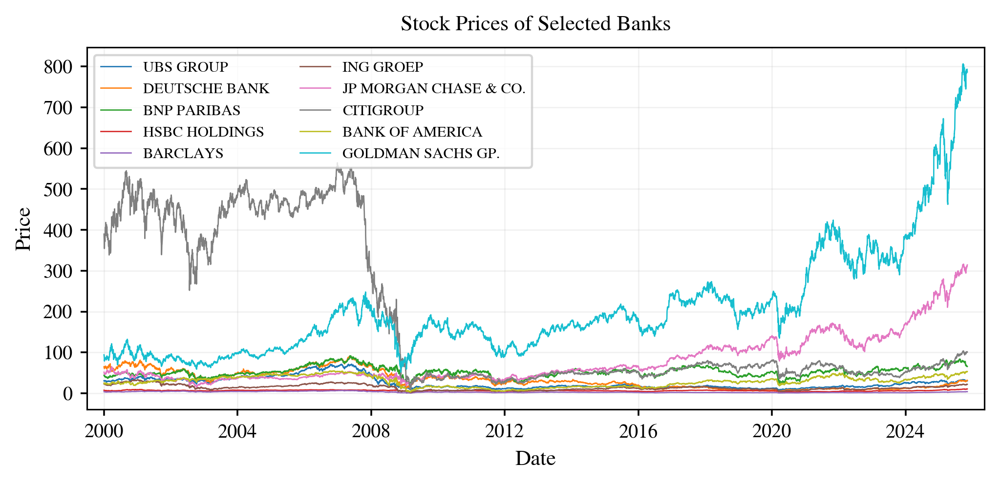

In [5]:
# Plot stock prices of selected banks
fig, ax = plt.subplots(figsize=FIG_FULL)

columns_to_plot = [2, 8, 10, 13, 14, 19, 20, 21, 22, 23]  # 0-based indexing

for col in columns_to_plot:
    ax.plot(
        GSIBs_prices.index,
        GSIBs_prices.iloc[:, col],
        label=GSIBs_prices.columns[col]
    )

ax.set_title("Stock Prices of Selected Banks", pad=8)
ax.set_xlabel("Date")
ax.set_ylabel("Price")

ax.legend(
    loc="upper left", fontsize=7,
    ncol=2,                 # helps with many banks
    frameon=True
)

# Explicit, intentional grid
ax.grid(True, axis="both", which="major")

ax.margins(x=0.02)

fig.tight_layout()
# fig.savefig(FIG_DIR / "fig_stock_prices_selected_banks.pdf")
# plt.show()


### Data processing

Omit missing values and/or certain timeframes 

In [6]:
price_cols = set(GSIBs_prices.columns)

print("Missing in equity:", sorted(price_cols - set(GSIBs_equity.columns))[:50])
print("Missing in liabilities:", sorted(price_cols - set(GSIBs_liabilities.columns))[:50])

print("Extra in equity:", sorted(set(GSIBs_equity.columns) - price_cols)[:50])
print("Extra in liabilities:", sorted(set(GSIBs_liabilities.columns) - price_cols)[:50])



Missing in equity: []
Missing in liabilities: []
Extra in equity: []
Extra in liabilities: []


In [7]:
# Exclude GSIBs where the first observation is after 2008-01-01 or contains #N/A after 2008-01-01
initial_date = pd.Timestamp('2008-01-01')

# Replace '#N/A' with NaN for proper handling
GSIBs_prices.replace('#N/A', np.nan, inplace=True)

# Identify columns with #N/A (now NaN) after the initial_date
columns_with_na_after_date = GSIBs_prices.loc[GSIBs_prices.index > initial_date].isna().any()

# Exclude columns with #N/A after the initial_date
GSIBs_prices_omitted = GSIBs_prices.loc[:, ~columns_with_na_after_date]

# Omit the rows with any missing values across the GSIBs_prices_omitted dataframe
GSIBs_prices = GSIBs_prices_omitted.dropna(axis=0, how='any')

# Show the row numbers that were dropped
dropped_rows = GSIBs_prices_omitted.index.difference(GSIBs_prices.index)
print("Dropped row indices due to missing values:")
print(dropped_rows)

# Make sure the same columns are dropped from the related equity and liabilities dataframes
GSIBs_equity = GSIBs_equity[GSIBs_prices.columns]
GSIBs_liabilities = GSIBs_liabilities[GSIBs_prices.columns]

Dropped row indices due to missing values:
DatetimeIndex(['1999-12-31', '2000-01-03', '2000-01-04', '2000-01-05',
               '2000-01-06', '2000-01-07', '2000-01-10', '2000-01-11',
               '2000-01-12', '2000-01-13',
               ...
               '2006-10-13', '2006-10-16', '2006-10-17', '2006-10-18',
               '2006-10-19', '2006-10-20', '2006-10-23', '2006-10-24',
               '2006-10-25', '2006-10-26'],
              dtype='datetime64[ns]', name='DATE', length=1780, freq=None)


Add the MSCI World Banks Index to the start of the G-SIBs dataframe

In [8]:
# Extract the MSCI World index from the MSCI_indices dataframe
MSCI_World = MSCI_indices.iloc[:, 1] # Assuming the second column is MSCI World

# Drop the same rows from MSCI_World to align with GSIBs_prices
MSCI_World = MSCI_World.drop(index=dropped_rows)

# Verify alignment
assert GSIBs_prices.index.equals(MSCI_World.index), "Indices are not aligned!"
print("Indices are aligned after dropping rows.")

# Add MSCI_World to the first column of the GSIBs_prices dataframe if it doesn't already exist
if 'MSCI World' not in GSIBs_prices.columns:
    GSIBs_prices.insert(0, 'MSCI World', MSCI_World)

# Display the first few rows and columns of the cleaned GSIBs_prices dataframe
print("Cleaned GSIBs_prices DataFrame (first 10 rows and 4 columns):")
print(GSIBs_prices.iloc[:10, :4])

Indices are aligned after dropping rows.
Cleaned GSIBs_prices DataFrame (first 10 rows and 4 columns):
            MSCI World  ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP
DATE                                                                     
2025-11-07     179.739                204.01            113.58      30.35
2025-11-06     180.344                205.25            113.54      30.78
2025-11-05     179.481                205.64            113.85      31.18
2025-11-04     179.375                205.40            113.56      30.54
2025-11-03     179.593                207.22            115.18      30.63
2025-10-31     179.142                205.47            115.16      30.73
2025-10-30     178.327                204.12            114.64      30.68
2025-10-29     177.527                204.55            114.03      30.60
2025-10-28     177.722                207.80            115.29      30.92
2025-10-27     176.890                207.45            114.26      30.74


Compute returns

In [9]:
# Function to calculate percentage log returns for all columns in a DataFrame
def calculate_log_returns(df):
    return 100 * np.log(df / df.shift(1)).dropna()

# Calculate log returns for GSIBs and OSIIs including the MSCI indices
gsibs_returns = calculate_log_returns(GSIBs_prices)
osiis_returns = calculate_log_returns(OSIIs_prices)

# Demean each return series
gsibs_returns = gsibs_returns - gsibs_returns.mean()
osiis_returns = osiis_returns - osiis_returns.mean()

Visualize some log returns

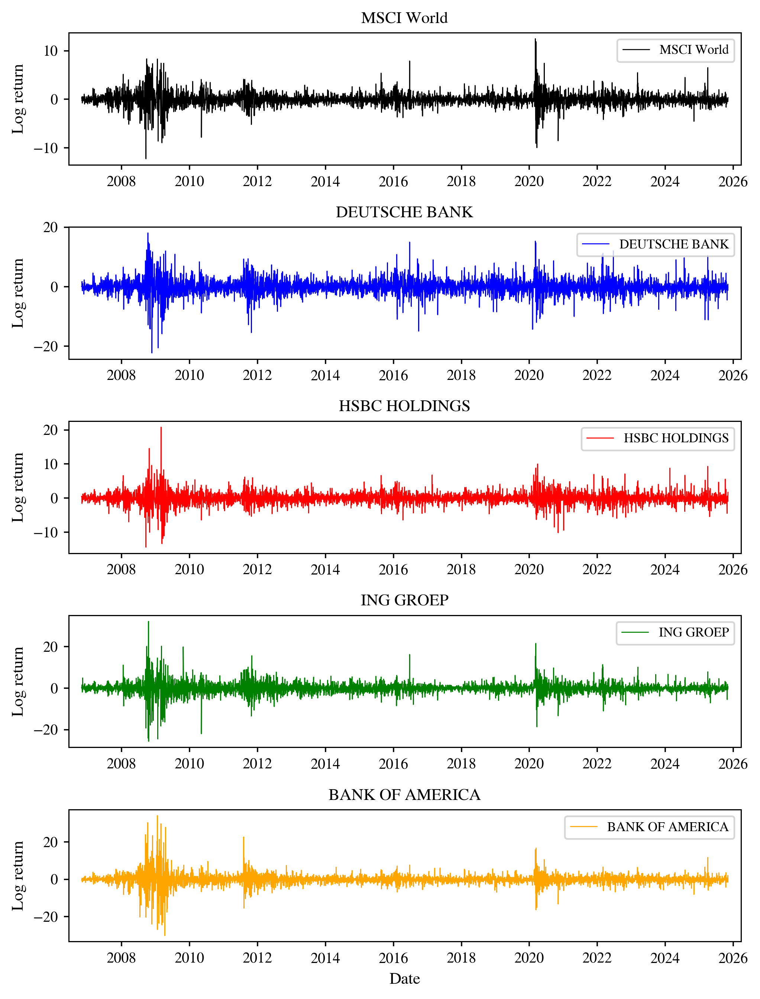

In [10]:
# Select the specified columns from gsibs_returns
columns_to_plot = [0, 8, 13, 19, 22]
selected_returns = gsibs_returns.iloc[:, columns_to_plot]

# 5 stacked panels (share x-axis)
fig, axes = plt.subplots(
    nrows=selected_returns.shape[1],
    ncols=1,
    figsize=(6.5, 8.5),          # stacked panels need height
    sharex=False
)

for ax, col, color in zip(axes, selected_returns.columns, ['black', 'blue', 'red', 'green', 'orange']):
    ax.plot(selected_returns.index, selected_returns[col], color=color, label=col)
    ax.set_title(col, pad=6)
    ax.set_ylabel("Log return")

    # Grid: choose one
    ax.grid(False)  # cleaner for stacked plots
    # ax.grid(True, axis="y", which="major")  # if you want soft y-grid

    ax.legend(loc="upper right", frameon=True, fontsize=8)

# Only bottom axis gets the x-label
axes[-1].set_xlabel("Date")

fig.tight_layout()
plt.show()


Create a table for the descriptive statistics of these log returns that can go into the Data chapter

In [11]:
# Compute descriptive statistics for pooled GSIBs returns and MSCI World returns

from scipy.stats import skew, kurtosis

# Separate MSCI World and GSIBs
msci_world = gsibs_returns.iloc[:, 0]
gsibs_only = gsibs_returns.iloc[:, 1:]

# Pool GSIB returns into one vector
gsibs_pooled = gsibs_only.stack()

# Function to compute descriptive stats
def descriptive_stats(series):
    return pd.Series({
        "Mean": series.mean(),
        "Std Dev": series.std(),
        "Min": series.min(),
        "Median": series.median(),
        "Max": series.max(),
        "Skew": skew(series),
        "Excess Kurtosis": kurtosis(series, fisher=True),
    })

# Build comparison table
descriptive_table = pd.DataFrame({
    "Pooled GSIBs": descriptive_stats(gsibs_pooled),
    "MSCI World": descriptive_stats(msci_world)
})

descriptive_table_T = descriptive_table.T
descriptive_table_T

,Mean,Std Dev,Min,Median,Max,Skew,Excess Kurtosis
Pooled GSIBs,3.392245e-18,2.331670,-62.566081,0.004170,89.263125,0.278165,41.639543
MSCI World,-5.724413e-18,1.323578,-12.248507,-0.042412,12.466438,0.350021,12.150534


In [12]:
# Compute descriptive statistics for GSIBs returns and MSCI World returns
def descriptive_statistics(returns_df):
    stats = pd.DataFrame(index=returns_df.columns)
    stats['Mean'] = returns_df.mean()
    stats['Std Dev'] = returns_df.std()
    stats['Min'] = returns_df.min()
    stats['Max'] = returns_df.max()
    stats['Skew'] = returns_df.skew()
    stats['Excess kurtosis'] = returns_df.kurtosis()
    stats['Median'] = returns_df.median()
    return stats

gsibs_stats = descriptive_statistics(gsibs_returns)
msci_stats = descriptive_statistics(gsibs_returns[['MSCI World']])
print("GSIBs Descriptive Statistics:")
print(gsibs_stats)
print("\nMSCI World Descriptive Statistics:")
print(msci_stats)

GSIBs Descriptive Statistics:
                                  Mean   Std Dev        Min        Max  \
MSCI World               -5.724413e-18  1.323578 -12.248507  12.466438   
ROYAL BANK OF CANADA      0.000000e+00  1.329189 -13.857485  14.473152   
TORONTO DOMINION         -7.155516e-18  1.337075 -16.425971  13.653619   
UBS GROUP                 1.144883e-17  2.296129 -27.523228  18.874171   
BANK OF CHINA            -2.504431e-17  1.714247 -20.037691  16.134017   
CHINA CON.BANK            3.792423e-17  1.863870 -20.886567  13.221754   
INDL&COML.BOC.            5.724413e-18  1.809979 -15.189414  11.778375   
BANK OF COMMS.            2.575986e-17  1.937047 -17.739949  14.737310   
DEUTSCHE BANK             5.724413e-18  2.559946 -22.320995  18.053278   
BANCO SANTANDER           0.000000e+00  2.223043 -20.874259  22.175613   
BNP PARIBAS               2.432875e-17  2.378912 -18.981819  19.111517   
CREDIT AGRICOLE           2.003544e-17  2.473437 -23.374946  18.455585   
SOCIETE 

### GPR index

In [13]:
# GPR LOAD DAILY and MA30 + SWITCH
# =========================

GPR_FILE = "./GPR_index_data.xlsx"  

# uncomment ONE: "DAILY" / "MA30"
USE_GPR_SERIES = "MA30"
# USE_GPR_SERIES = "DAILY"  

def load_gpr(GPR_FILE: str, series_choice: str = "DAILY") -> pd.DataFrame:
    """
    Returns a DataFrame with a daily DateTimeIndex and one column: 'GPR'.
    series_choice: 'DAILY' (official), 'MA30' (official)
    """
    gpr = pd.read_excel(GPR_FILE, engine="openpyxl")

    # Parse DATE robustly (your new file should already be parseable without custom format)
    gpr["DATE"] = pd.to_datetime(gpr["DATE"], errors="coerce")
    gpr = gpr.dropna(subset=["DATE"]).sort_values("DATE").set_index("DATE")

    # Map column names in the combined file
    col_map = {
        "DAILY": "GPR DAILY",
        "MA30": "GPR MA30",
    }

    if series_choice not in col_map:
        raise ValueError(f"Unknown series_choice={series_choice}. Choose from {list(col_map.keys())}")

    gpr = gpr[[col_map[series_choice]]].rename(columns={col_map[series_choice]: "GPR"})

    # Safety: treat zeros as missing for DAILY (sometimes missing coded as 0 in indices)
    # (MA30 and synth likely won't be 0; keep rule simple and harmless)
    gpr.loc[gpr["GPR"] == 0, "GPR"] = pd.NA

    # Ensure daily frequency (no harm if already daily)
    # Use asfreq to avoid creating synthetic values; fill strategy decided later.
    gpr = gpr.asfreq("D")

    # For DAILY/MA30, we generally do NOT want interpolation.
    # For synth series, it's already interpolated; still safe to keep as-is.
    # If there are gaps in the official daily, forward-fill is defensible for alignment to trading days
    # (it effectively creates a step function over non-reported days).
    gpr["GPR"] = gpr["GPR"].ffill()

    return gpr


gpr_data = load_gpr(GPR_FILE, USE_GPR_SERIES)

# =========================
# OPTIONAL: Align to trading days later
# =========================
# Example usage:
# Suppose you already have a trading-day index from equity prices:
# trading_days = equity_prices.index  # DatetimeIndex with business/trading days
# gpr_trading = gpr_data.reindex(trading_days, method="ffill")


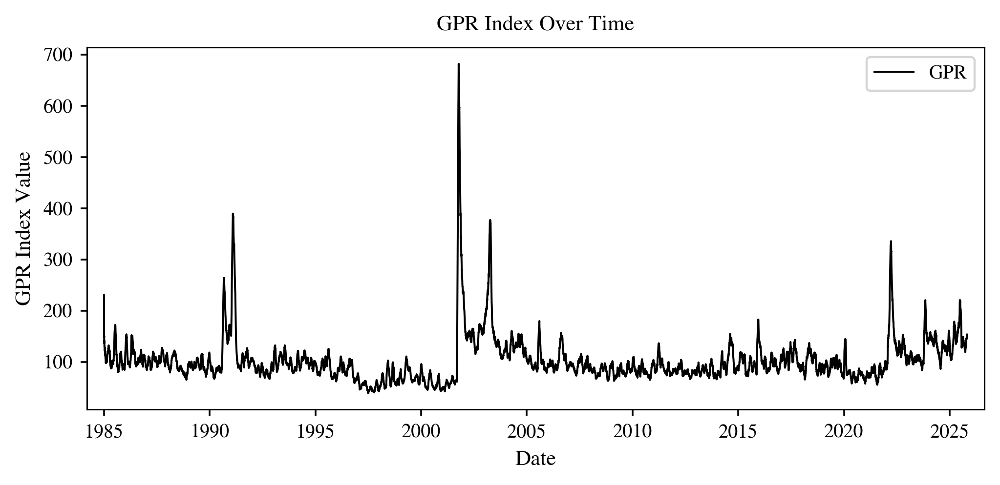

In [14]:
# Plot the GPR index over time
fig, ax = plt.subplots(figsize=FIG_FULL)

ax.plot(gpr_data.index, gpr_data.iloc[:, 0], color="black", label="GPR", linewidth=0.9)

ax.set_title("GPR Index Over Time", pad=8)
ax.set_xlabel("Date")
ax.set_ylabel("GPR Index Value")
ax.legend(loc="best")

ax.margins(x=0.02)

fig.tight_layout()
fig.savefig(FIG_DIR / "GPR_over_time.pdf", bbox_inches='tight')
# plt.show()


In [15]:
# Helper to plot a zoomed GPR panel with event markers (exact dates, readable labels)
def plot_gpr_zoom(gpr_data, start, end, title, events):
    fig, ax = plt.subplots(figsize=FIG_FULL)

    gpr_win = gpr_data.loc[start:end].copy()
    series = gpr_win.iloc[:, 0].dropna()

    ax.plot(
        series.index,
        series.values,
        color="black",
        label="GPR (MA30)",
        linewidth=0.9
    )

    ax.set_title(title, pad=6)
    ax.set_xlabel("Date")
    ax.set_ylabel("GPR (MA30)")

    xmin, xmax = series.index.min(), series.index.max()

    for i, (label, date_str) in enumerate(events):
        dt = pd.Timestamp(date_str)
        if not (xmin <= dt <= xmax):
            continue

        # Find the highest GPR peak within 30 days around the event date
        window_start = dt - pd.Timedelta(days=30)
        window_end = dt + pd.Timedelta(days=30)
        window_data = series.loc[(series.index >= window_start) & (series.index <= window_end)]
        if window_data.empty:
            continue
        peak_date = window_data.idxmax()
        peak_value = window_data.max()

        ax.axvline(
            peak_date,
            color="black",
            linestyle=":",
            linewidth=0.7
        )

        # Stagger labels vertically to reduce overlap
        y_pos = 0.98 if i % 2 == 0 else 0.90

        ax.text(
            peak_date,
            y_pos,
            label,
            transform=ax.get_xaxis_transform(),
            rotation=90,
            va="top",
            ha="right",
            fontsize=8,
            bbox=dict(
                facecolor="white",
                edgecolor="none",
                alpha=0.6,
                pad=0.6
            )
        )

    ax.legend(loc="best", frameon=True)
    ax.grid(False)
    ax.margins(x=0.02)

    fig.tight_layout()
    plt.show()

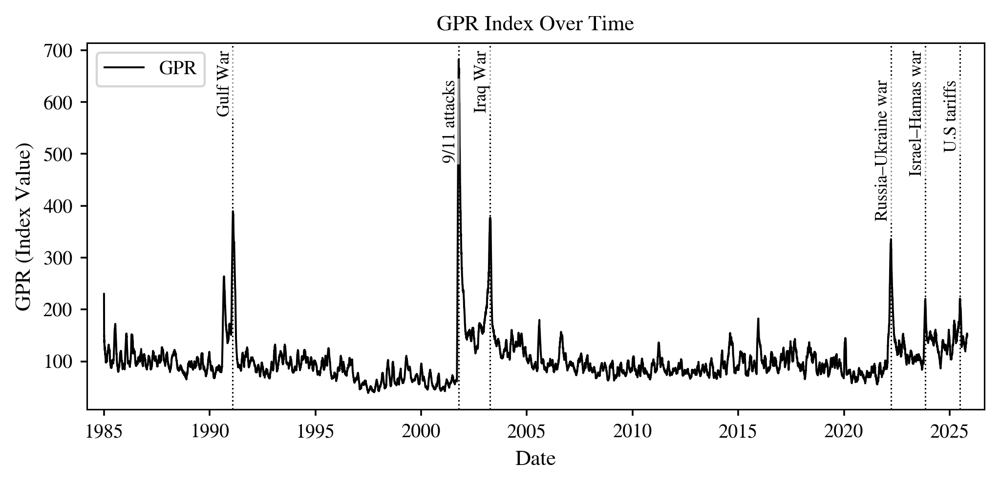

In [16]:
# 1985 - 2025
fig, ax = plt.subplots(figsize=FIG_FULL)

ax.plot(
    gpr_data.index,
    gpr_data.iloc[:, 0],
    color="black",
    label="GPR",
    linewidth=0.9
)

ax.set_title("GPR Index Over Time", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("GPR (Index Value)")

# Major geopolitical events (full-sample, only salient GPR-relevant shocks)
events = [
    ("Gulf War", "1991-01-02"),
    ("9/11 attacks", "2001-09-11"),
    ("Iraq War", "2003-03-20"),
    ("Russia–Ukraine war", "2022-02-24"),
    ("Israel–Hamas war", "2023-10-07"),
    ("U.S tariffs", "2025-07-10"),
]

series = gpr_data.iloc[:, 0].dropna()

xmin, xmax = gpr_data.index.min(), gpr_data.index.max()

for i, (label, date_str) in enumerate(events):
    dt = pd.Timestamp(date_str)
    if not (xmin <= dt <= xmax):
        continue

    # Find the highest GPR peak within 30 days around the event date
    window_start = dt - pd.Timedelta(days=30)
    window_end = dt + pd.Timedelta(days=30)
    window_data = series.loc[(series.index >= window_start) & (series.index <= window_end)]
    if window_data.empty:
        continue
    peak_date = window_data.idxmax()
    peak_value = window_data.max()

    ax.axvline(
        peak_date,
        color="black",
        linestyle=":",
        linewidth=0.7
    )

    # Stagger labels vertically to reduce overlap
    y_pos = 0.98 if i % 2 == 0 else 0.90

    ax.text(
        peak_date,
        y_pos,
        label,
        transform=ax.get_xaxis_transform(),
        rotation=90,
        va="top",
        ha="right",
        fontsize=8,
        bbox=dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.6,
            pad=0.6
        )
    )

ax.legend(loc="best", frameon=True)
ax.grid(False)
ax.margins(x=0.02)

fig.tight_layout()
# plt.show()

# Save the figure
# fig.savefig(FIG_DIR / "GPR_full_with_events.pdf", bbox_inches='tight')


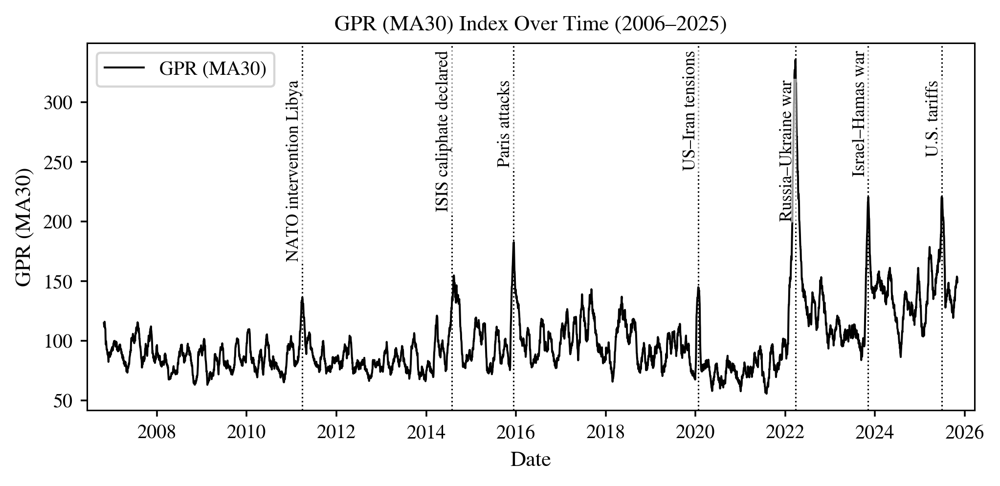

In [17]:
# 2006-2025
events_2006_2025 = [
    ("Israel–Hezbollah war", "2006-07-12"),
    ("NATO intervention Libya", "2011-03-30"),  
    ("ISIS caliphate declared", "2014-06-29"),
    ("Paris attacks", "2015-11-13"),
    ("US–Iran tensions", "2020-01-03"),
    ("Russia–Ukraine war", "2022-02-24"),
    ("Israel–Hamas war", "2023-10-07"),
    ("U.S. tariffs", "2025-07-10"),
]

plot_gpr_zoom(
    gpr_data=gpr_data,
    start="2006-10-27",
    end="2025-11-06",
    title="GPR (MA30) Index Over Time (2006–2025)",
    events=events_2006_2025
)

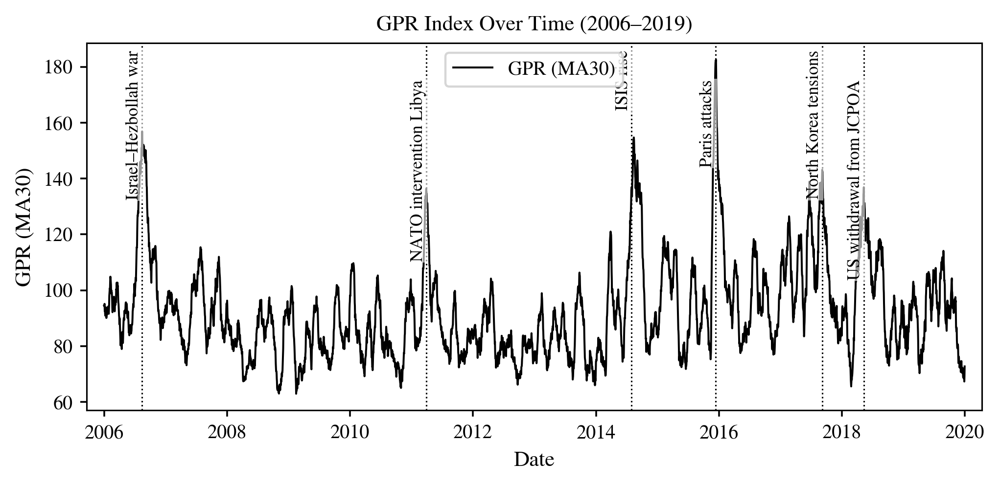

In [18]:
# 2006–2019
# =========================
events_2006_2019 = [
    ("Israel–Hezbollah war", "2006-07-30"),
    ("NATO intervention Libya", "2011-03-30"),
    ("ISIS rise", "2014-06-30"),
    ("Paris attacks", "2015-11-13"),
    ("North Korea tensions", "2017-08-08"),
    ("US withdrawal from JCPOA", "2018-05-01"),
]

plot_gpr_zoom(
    gpr_data=gpr_data,
    start="2006-01-01",
    end="2019-12-31",
    title="GPR Index Over Time (2006–2019)",
    events=events_2006_2019
)

# Save the figure
fig.savefig(FIG_DIR / "GPR_2006_2019_with_events.pdf")

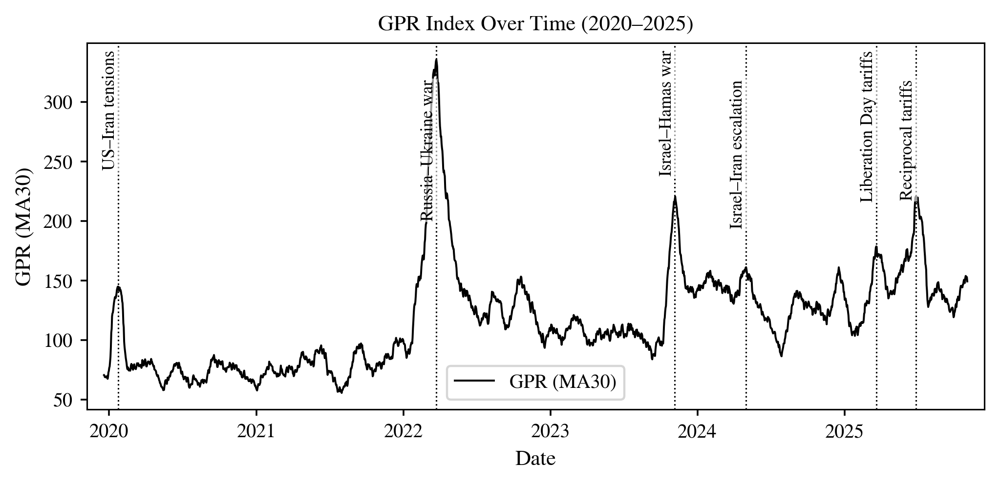

In [19]:
# 2020–2025
# =========================
events_2020_2025 = [
    ("US–Iran tensions", "2020-01-03"),
    ("Russia–Ukraine war", "2022-02-24"),
    ("Israel–Hamas war", "2023-10-07"),
    ("Israel–Iran escalation", "2024-04-13"),
    ("Liberation Day tariffs", "2025-04-02"),
    ("Reciprocal tariffs", "2025-07-10"),
]


plot_gpr_zoom(
    gpr_data=gpr_data,
    start="2019-12-20",
    end="2025-12-31",
    title="GPR Index Over Time (2020–2025)",
    events=events_2020_2025
)

# Save the figure
fig.savefig(FIG_DIR / "GPR_2020_2025_with_events.pdf")

### Univariate GARCH(1,1) model fitting

In [20]:
# Print few rows of gsibs_returns
print("GSIBs Returns DataFrame (first 5 rows and 4 columns):")
print(gsibs_returns.iloc[:5, :4])

GSIBs Returns DataFrame (first 5 rows and 4 columns):
            MSCI World  ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP
DATE                                                                     
2025-11-06    0.340280              0.634489         -0.009848   1.389994
2025-11-05   -0.475432              0.218347          0.298036   1.274306
2025-11-04   -0.054830             -0.088262         -0.229670  -2.090824
2025-11-03    0.125706              0.910689          1.441855   0.277395
2025-10-31   -0.247193             -0.819584          0.008010   0.309078


Using the Python arch package

In [21]:
# Create an empty DataFrame to store conditional variances
cond_var_df_gsibs = pd.DataFrame(index=gsibs_returns.index, columns=gsibs_returns.columns)

# Fit GARCH(1,1) model for each asset in gsibs_returns and store conditional variances
for asset in gsibs_returns.columns:
    model = arch_model(gsibs_returns[asset], vol='GARCH', p=1, q=1, mean='Constant', dist='normal')
    res = model.fit(disp='off')
    cond_var_df_gsibs[asset] = res.conditional_volatility ** 2

# Display the first 10 rows and 4 columns of the conditional variance DataFrame
print("Conditional Variances for GSIBs - Python arch package (first 10 rows and 4 columns):")
print(cond_var_df_gsibs.iloc[:10, :4])

Conditional Variances for GSIBs - Python arch package (first 10 rows and 4 columns):
            MSCI World  ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP
DATE                                                                     
2025-11-06    0.383697              0.524262          0.762747   1.455213
2025-11-05    0.376231              0.536798          0.652791   1.584831
2025-11-04    0.374052              0.498647          0.588066   1.668507
2025-11-03    0.345458              0.459018          0.524058   1.977949
2025-10-31    0.326228              0.538608          0.886979   1.858413
2025-10-30    0.311277              0.573241          0.749861   1.755192
2025-10-29    0.316949              0.568567          0.672841   1.654270
2025-10-28    0.320930              0.526897          0.626437   1.568910
2025-10-27    0.305170              0.826286          0.805176   1.597247
2025-10-24    0.313458              0.737464          0.822251   1.543232


Using R rugarch package

In [22]:
# Fit GARCH(1,1) model using rugarch for gsibs_returns and store results
rugarch_models_gsibs = {}
cond_var_r_df_gsibs = pd.DataFrame(index=gsibs_returns.index, columns=gsibs_returns.columns)

for asset in gsibs_returns.columns:
    with localconverter(ro.default_converter + pandas2ri.converter):
        returns_r = ro.conversion.py2rpy(gsibs_returns[asset].dropna())
    spec = rugarch.ugarchspec(
        variance_model=ro.ListVector({'model': 'sGARCH', 'garchOrder': ro.IntVector([1, 1]), 'variance.targeting': False}),
        mean_model=ro.ListVector({'armaOrder': ro.IntVector([0, 0]), 'include.mean': False}),
        distribution_model='norm'
    )
    fit = rugarch.ugarchfit(spec, returns_r, solver='hybrid')
    rugarch_models_gsibs[asset] = fit
    cond_var_r_df_gsibs.loc[gsibs_returns[asset].dropna().index, asset] = np.array(rugarch.sigma(fit)).flatten()[::-1] ** 2

# Display the first 10 rows and 4 columns of the conditional variance DataFrame
print("Conditional Variances for GSIBs - R rugarch package (first 10 rows and 4 columns):")
print(cond_var_r_df_gsibs.iloc[:10, :4])

Conditional Variances for GSIBs - R rugarch package (first 10 rows and 4 columns):
           MSCI World ROYAL BANK OF CANADA TORONTO DOMINION UBS GROUP
DATE                                                                 
2025-11-06   0.467553             0.599622          0.80375  1.957525
2025-11-05   0.474497              0.64963         0.859008  1.925835
2025-11-04   0.511826             0.711852         0.923744  1.625068
2025-11-03   0.553239             0.681533         0.801942  1.701843
2025-10-31   0.595097             0.666294         0.865483  1.786253
2025-10-30   0.624631             0.682716         0.918529  1.887133
2025-10-29   0.659477             0.743658          0.97013  1.996062
2025-10-28   0.724068             0.502009         0.931259  2.024734
2025-10-27   0.771928             0.541274         0.936261  2.123192
2025-10-24   0.737262             0.581452         0.957193  2.138258


Compare the conditional variances from Python and R

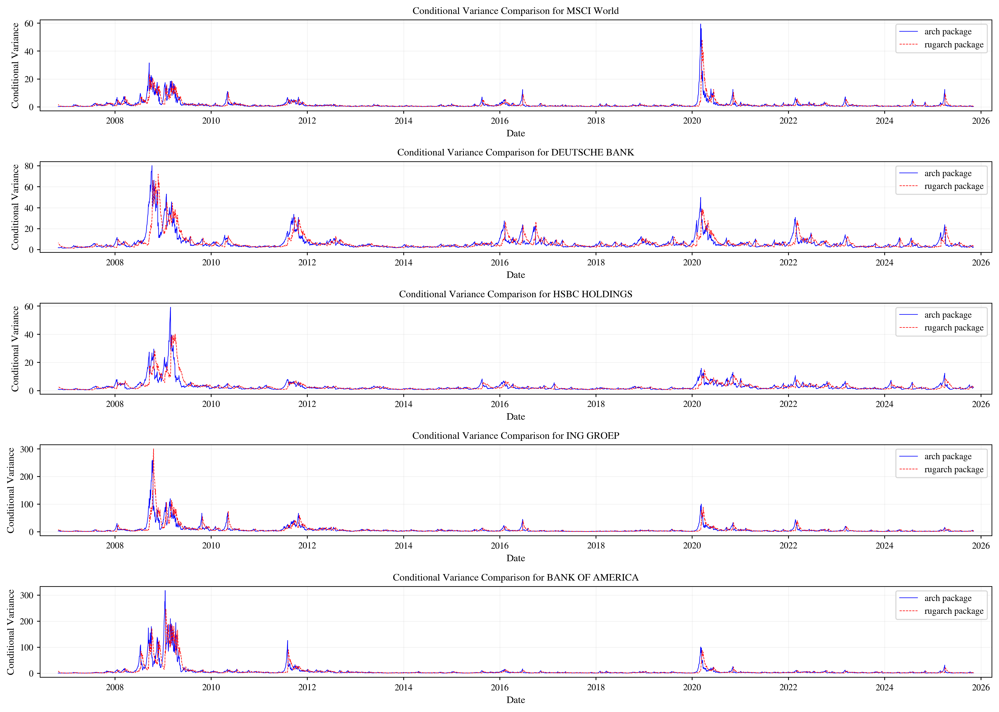

Correlation of conditional variances for MSCI World: 0.6242
Correlation of conditional variances for DEUTSCHE BANK: 0.6704
Correlation of conditional variances for HSBC HOLDINGS: 0.6500
Correlation of conditional variances for ING GROEP: 0.6454
Correlation of conditional variances for BANK OF AMERICA: 0.7261


In [23]:
# Define the columns to plot
columns_to_plot = [0, 8, 13, 19, 22]  # Adjusted for gsibs_returns

# Compare the conditional variances from arch and rugarch for the selected columns
plt.figure(figsize=(14, 10))
for i, col in enumerate(columns_to_plot, 1):
    asset = gsibs_returns.columns[col]
    plt.subplot(len(columns_to_plot), 1, i)
    plt.plot(cond_var_df_gsibs[asset], label='arch package', color='blue')
    plt.plot(cond_var_r_df_gsibs[asset], label='rugarch package', color='red', linestyle='--')
    plt.title(f'Conditional Variance Comparison for {asset}')
    plt.xlabel('Date')
    plt.ylabel('Conditional Variance')
    plt.legend()
    plt.grid()
plt.tight_layout()
plt.show()

# Compare how much the conditional variances correlate for the selected columns
for col in columns_to_plot:
    asset = gsibs_returns.columns[col]
    corr = cond_var_df_gsibs[asset].corr(cond_var_r_df_gsibs[asset])
    print(f'Correlation of conditional variances for {asset}: {corr:.4f}')


Compute the diagonal matrix of conditional standard deviations $D_t$ (just for checking purposes, $H_t$ will be extracted directly later)

In [24]:
# Calculate D matrices for the entire cond_var_r_df_gsibs dataframe
# Ensure all columns in cond_var_r_df_gsibs are numeric
cond_var_r_df_gsibs = cond_var_r_df_gsibs.apply(pd.to_numeric, errors='coerce')

# Calculate D matrices
gsibs_D_matrices = {date: np.diag(np.sqrt(cond_var_r_df_gsibs.loc[date])) for date in cond_var_r_df_gsibs.index}

# Flatten D matrices into a DataFrame for CSV export
gsibs_D_df = pd.DataFrame({
    'Date': cond_var_r_df_gsibs.index,
    **{f'D_{i+1}{i+1}': [gsibs_D_matrices[date][i, i] for date in cond_var_r_df_gsibs.index] for i in range(cond_var_r_df_gsibs.shape[1])}
}).set_index('Date')

# Save the D matrices to a CSV file
print("D Matrices DataFrame (first 5 rows):\n", gsibs_D_df.head())


D Matrices DataFrame (first 5 rows):
                 D_11      D_22      D_33      D_44      D_55      D_66  \
Date                                                                     
2025-11-06  0.683778  0.774352  0.896521  1.399116  1.209113  1.463319   
2025-11-05  0.688837  0.805996  0.926827  1.387744  1.217223  1.453711   
2025-11-04  0.715420  0.843713  0.961116  1.274781  1.258849  1.489404   
2025-11-03  0.743801  0.825550  0.895512  1.304547  1.305400  1.489796   
2025-10-31  0.771425  0.816268  0.930313  1.336508  1.080052  1.308855   

                D_77      D_88      D_99    D_1010  ...    D_1919    D_2020  \
Date                                                ...                       
2025-11-06  1.296190  1.197593  1.797272  1.696025  ...  1.798133  1.775591   
2025-11-05  1.301548  1.213702  1.832418  1.765527  ...  1.585749  1.873328   
2025-11-04  1.328830  1.231526  1.853240  1.839340  ...  1.538869  1.969798   
2025-11-03  1.328463  1.223629  1.902509  1.9362

### DCC estimation

To compute the time-varying conditional correlation and covariance matrix we use the DCC approach introduced by Engle (2002)

In [25]:
# Convert gsibs_returns dataframe to R
with localconverter(ro.default_converter + pandas2ri.converter):
    gsibs_returns_r = ro.conversion.py2rpy(gsibs_returns.dropna())

# Define univariate GARCH specs for each asset in gsibs_returns using rugarch
gsibs_uspec = rugarch.multispec([
    rugarch.ugarchspec(
        variance_model=ro.ListVector({'model': 'sGARCH', 'garchOrder': ro.IntVector([1, 1])}),
        mean_model=ro.ListVector({'armaOrder': ro.IntVector([0, 0]), 'include.mean': False}),
        distribution_model='norm'
    ) for _ in range(gsibs_returns.shape[1])
])

# Define DCC spec for gsibs_returns
gsibs_dcc_spec = rmgarch.dccspec(uspec=gsibs_uspec, dccOrder=ro.IntVector([1, 1]), distribution='mvnorm')

# Fit the DCC model for gsibs_returns
gsibs_dcc_fit = rmgarch.dccfit(gsibs_dcc_spec, data=gsibs_returns_r)

# Extract H_t matrices for gsibs_returns
gsibs_Ht_array = rmgarch.rcov(gsibs_dcc_fit)

# Extract R_t matrices for gsibs_returns
gsibs_Rt_array = rmgarch.rcor(gsibs_dcc_fit)

# Convert the full 3D array from R to NumPy for gsibs_returns
with localconverter(default_converter + numpy2ri.converter):
    gsibs_Rt_array_np = ro.conversion.rpy2py(gsibs_Rt_array)
    gsibs_Ht_array_np = ro.conversion.rpy2py(gsibs_Ht_array)

# Create a DataFrame to store the R and H matrices for gsibs_returns
gsibs_R_matrices = {date: gsibs_Rt_array_np[:, :, i] for i, date in enumerate(gsibs_returns.index)}
gsibs_H_matrices = {date: gsibs_Ht_array_np[:, :, i] for i, date in enumerate(gsibs_returns.index)}

# Flatten the R matrices into a DataFrame for CSV export
gsibs_R_df = pd.DataFrame({
    'Date': gsibs_returns.index,
    **{f'R_{row+1}{col+1}': [gsibs_R_matrices[date][row, col] for date in gsibs_returns.index] for row in range(gsibs_Rt_array_np.shape[0]) for col in range(gsibs_Rt_array_np.shape[1])}
}).set_index('Date')

# Flatten the H matrices into a DataFrame for CSV export
gsibs_H_df = pd.DataFrame({
    'Date': gsibs_returns.index,
    **{f'H_{row+1}{col+1}': [gsibs_H_matrices[date][row, col] for date in gsibs_returns.index] for row in range(gsibs_Ht_array_np.shape[0]) for col in range(gsibs_Ht_array_np.shape[1])}
}).set_index('Date')

# Save the R matrices for gsibs_returns to a CSV file
print("R Matrices DataFrame for gsibs_returns:\n", gsibs_R_df.head().to_string())

# Save the H matrices for gsibs_returns to a CSV file
print("H Matrices DataFrame for gsibs_returns:\n", gsibs_H_df.head().to_string())

R Matrices DataFrame for gsibs_returns:
             R_11      R_12      R_13      R_14      R_15      R_16      R_17      R_18      R_19     R_110     R_111     R_112     R_113     R_114     R_115     R_116     R_117     R_118     R_119     R_120     R_121     R_122     R_123     R_124     R_125     R_126     R_127     R_128      R_21  R_22      R_23      R_24      R_25      R_26      R_27      R_28      R_29     R_210     R_211     R_212     R_213     R_214     R_215     R_216     R_217     R_218     R_219     R_220     R_221     R_222     R_223     R_224     R_225     R_226     R_227     R_228      R_31      R_32  R_33      R_34      R_35      R_36      R_37      R_38      R_39     R_310     R_311     R_312     R_313     R_314     R_315     R_316     R_317     R_318     R_319     R_320     R_321     R_322     R_323     R_324     R_325     R_326     R_327     R_328      R_41      R_42      R_43  R_44      R_45      R_46      R_47      R_48      R_49     R_410     R_411     R_412     

Robustness: Below we compute the time-varying conditional covariance matrix $H_t$ decomposed as $H_t = D_t R_t D_t$ where we use the $D_t$ matrices directly.

In [26]:
# # Compute matrices H_t = D_t * R_t * D_t for G-SIBs and save to CSV
# gsibs_H_matrices = {}
# for date in gsibs_returns.index:
#     D_t = gsibs_D_matrices[date]
#     R_t = gsibs_R_matrices[date]
#     H_t = D_t @ R_t @ D_t
#     gsibs_H_matrices[date] = H_t

# # Flatten H matrices into a DataFrame for CSV export
# gsibs_H_df = pd.DataFrame({
#     'Date': gsibs_returns.index,
#     **{f'H_{row+1}{col+1}': [gsibs_H_matrices[date][row, col] for date in gsibs_returns.index] for row in range(gsibs_Rt_array_np.shape[0]) for col in range(gsibs_Rt_array_np.shape[1])}
# }).set_index('Date')

# # Save the H matrices for G-SIBs to a CSV file
# print("H Matrices DataFrame for G-SIBs:\n", gsibs_H_df.head().to_string())

### Time-varying Betas

The conditional beta of asset i with respect to the market at time t is defined as: $\beta_{i,t} = \frac{Cov_t(r_{i,t}, r_{m,t})}{Var_t(r_{m,t})} = \frac{h_{im,t}}{h_{m,t}}$ where $h_{im,t}$ is the (i, m)-th element of the conditional covariance matrix $H_t$.

In [27]:
import numpy as np
import pandas as pd
from rpy2.robjects.conversion import localconverter
from rpy2.robjects import default_converter
from rpy2.robjects import numpy2ri, pandas2ri
import rpy2.robjects as ro

# --- Keep your codebase descending, but run DCC recursion in ascending time ---
gsibs_returns_desc = gsibs_returns.copy()
gsibs_returns_asc  = gsibs_returns_desc.sort_index(ascending=True)

# Fit DCC on ascending data
with localconverter(ro.default_converter + pandas2ri.converter):
    ret_r_asc = ro.conversion.py2rpy(gsibs_returns_asc)

gsibs_dcc_fit_asc = rmgarch.dccfit(gsibs_dcc_spec, data=ret_r_asc)

# Get in-sample conditional covariances H_t (N, N, T)
H_in_asc = rmgarch.rcov(gsibs_dcc_fit_asc)
with localconverter(default_converter + numpy2ri.converter):
    H_in_np = ro.conversion.rpy2py(H_in_asc)

H_in_np = np.asarray(np.squeeze(H_in_np))
if H_in_np.ndim != 3:
    raise ValueError(f"Unexpected rcov shape: {H_in_np.shape}")

N, _, T = H_in_np.shape
if N != len(gsibs_returns_asc.columns):
    raise ValueError("N mismatch with columns")
if T != len(gsibs_returns_asc.index):
    raise ValueError("T mismatch with index length")

# Compute conditional betas: beta_{i,t} = h_{im,t} / h_{mm,t}  (ASC time)
market_idx = 0
bank_cols  = gsibs_returns_asc.columns[1:]

beta_ts = np.full((T, N-1), np.nan, dtype=float)

for t in range(T):
    Ht = H_in_np[:, :, t]
    h_mm = Ht[market_idx, market_idx]
    if not np.isfinite(h_mm) or h_mm == 0:
        continue
    for i in range(1, N):
        beta_ts[t, i-1] = Ht[i, market_idx] / h_mm

GSIBs_beta_asc = pd.DataFrame(beta_ts, index=gsibs_returns_asc.index, columns=bank_cols)

# Flip back to DESC so everything downstream is unchanged
GSIBs_beta = GSIBs_beta_asc.sort_index(ascending=False).astype(float)

# Safety: ensure exact same index/columns as before
if not GSIBs_beta.index.equals(gsibs_returns.index):
    raise ValueError("GSIBs_beta index does not match gsibs_returns index")
if not GSIBs_beta.columns.equals(gsibs_returns.columns[1:]):
    raise ValueError("GSIBs_beta columns do not match gsibs_returns bank columns")

GSIBs_beta.to_csv('./Outputs/Dataframes/GSIBs_beta.csv')

Plot the dynamic betas

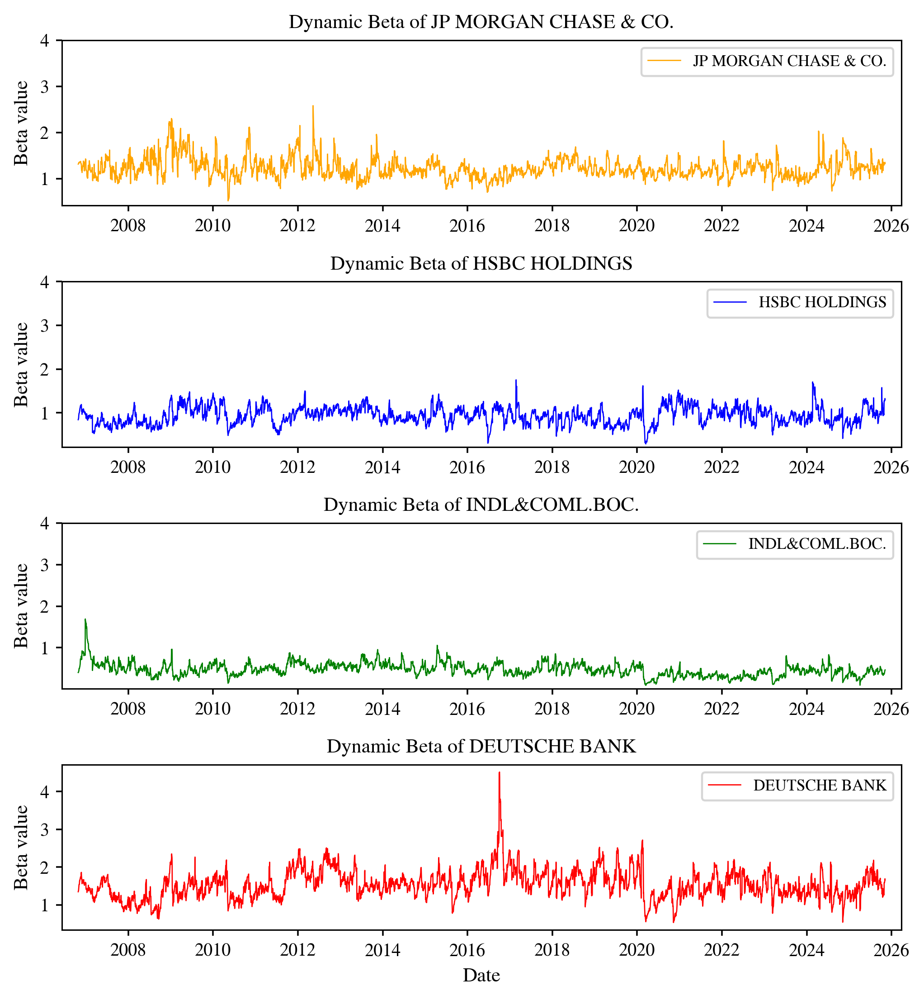

In [28]:
# Select the columns to plot selected bank betas
columns_to_plot = [19, 12, 5, 7]  # 0-based indexing
selected_banks = GSIBs_beta.columns[columns_to_plot]

colors = ["orange", "blue", "green", "red"]

fig, axes = plt.subplots(
    nrows=len(selected_banks),
    ncols=1,
    figsize=(6.5, 7.0),     # 4 stacked panels
    sharex=False
)

for ax, bank, color in zip(axes, selected_banks, colors):
    ax.plot(
        GSIBs_beta.index,
        GSIBs_beta[bank],
        color=color,
        label=bank
    )

    ax.set_title(f"Dynamic Beta of {bank}", pad=6)
    ax.set_ylabel("Beta value")

    ax.legend(loc="upper right", frameon=True, fontsize=8)
    ax.grid(False)          # clean for stacked panels
    ax.margins(x=0.02)

# Show x tick labels on all panels
for ax in axes:
    ax.tick_params(axis="x", labelbottom=True)
    ax.set_yticks([1, 2, 3, 4])

axes[-1].set_xlabel("Date")

fig.tight_layout()
fig.savefig(FIG_DIR / "Dynamic_betas.pdf")
plt.show()

Plot the GPR index into the conditional betas

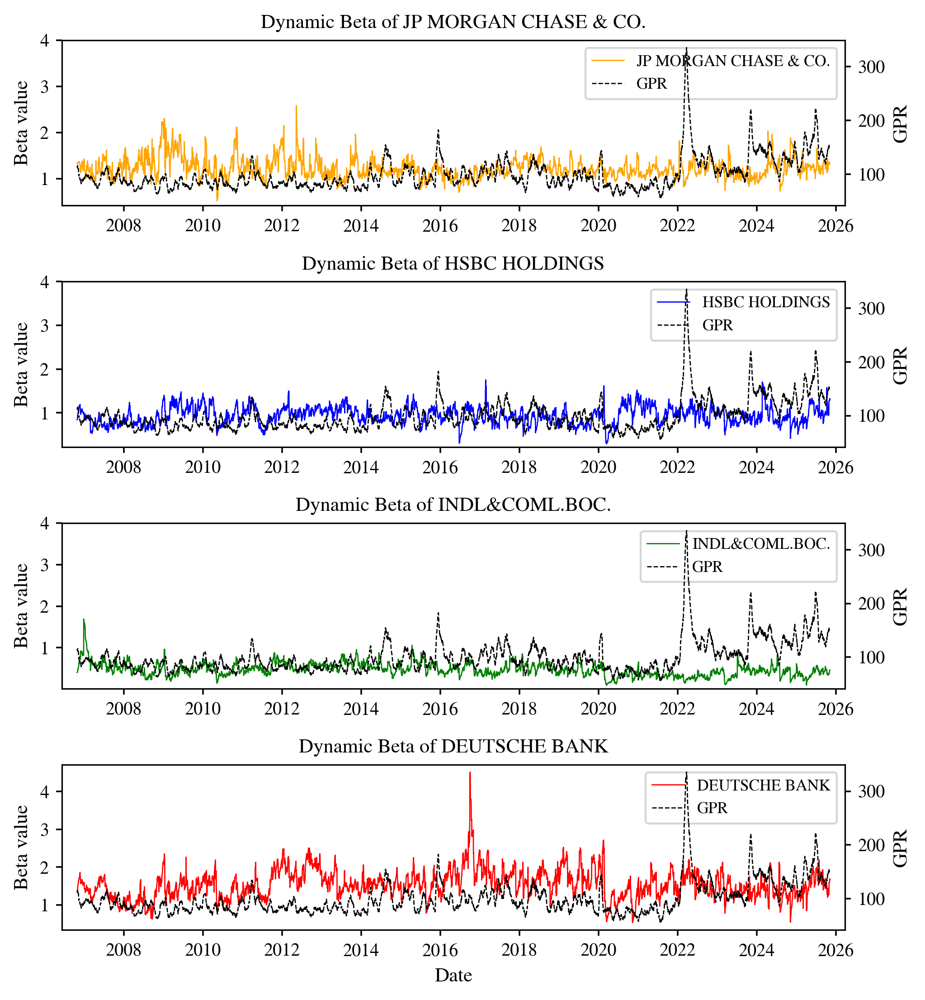

In [29]:
# Ensure no dates fall outside of the range of gsibs_returns
gpr_data = gpr_data[
    (gpr_data.index >= gsibs_returns.index.min())
    & (gpr_data.index <= gsibs_returns.index.max())
]

# Select the columns to plot selected bank betas
selected_banks = GSIBs_beta.columns[columns_to_plot]

colors = ["orange", "blue", "green", "red"]

# 4 stacked panels
fig, axes = plt.subplots(
    nrows=len(selected_banks),
    ncols=1,
    figsize=(6.5, 7.0),
    sharex=False
)

for ax, bank, color in zip(axes, selected_banks, colors):

    # Left axis: beta
    beta_line, = ax.plot(
        GSIBs_beta.index,
        GSIBs_beta[bank],
        color=color,
        label=bank
    )

    ax.set_title(f"Dynamic Beta of {bank}", pad=6)
    ax.set_ylabel("Beta value")
    ax.set_yticks([1, 2, 3, 4])
    ax.margins(x=0.02)
    ax.grid(False)

    # Right axis: GPR
    ax_gpr = ax.twinx()
    gpr_line, = ax_gpr.plot(
        gpr_data.index,
        gpr_data["GPR"],
        color="black",
        linestyle="--",
        label="GPR"
    )

    ax_gpr.set_ylabel("GPR")
    ax_gpr.tick_params(axis="y")

    # Combined legend (order: beta first, GPR second)
    ax.legend(
        handles=[beta_line, gpr_line],
        loc="upper right",
        frameon=True,
        fontsize=8
    )

# X-axis formatting
for ax in axes:
    ax.tick_params(axis="x", labelbottom=True)

axes[-1].set_xlabel("Date")

fig.tight_layout()
fig.savefig(FIG_DIR / "Dynamic_betas_with_gpr.pdf")
plt.show()


Correlation between GPR and betas

In [30]:
# Calculate correlation between GPR index and conditional betas for selected banks
for bank in selected_banks:
    merged_data = pd.merge(GSIBs_beta[[bank]], gpr_data, left_index=True, right_index=True, how='inner')
    corr = merged_data[bank].corr(merged_data['GPR'])
    print(f'Correlation between GPR index and beta of {bank}: {corr:.4f}')

Correlation between GPR index and beta of JP MORGAN CHASE & CO.: -0.0484
Correlation between GPR index and beta of HSBC HOLDINGS: 0.0066
Correlation between GPR index and beta of INDL&COML.BOC.: -0.1901
Correlation between GPR index and beta of DEUTSCHE BANK: 0.0733


# SRISK

First we want to match the dates of the market value of equity $E_t$ and the book value of the liabilities $D_t$ with the betas.

In [31]:
# Make sure the GSIBs_equity dataframe has the same indices as GSIBs_beta
GSIBs_equity = GSIBs_equity.reindex(GSIBs_beta.index)

# Validate alignment
assert GSIBs_equity.index.equals(GSIBs_beta.index), "Indices are not aligned after reindexing!"
print("Indices are aligned after reindexing GSIBs_equity.")

Indices are aligned after reindexing GSIBs_equity.


In [32]:
# Adjust the date format for GSIBs_liabilities and GSIBs_assets to match date format of GSIBs_equity
def date_only_index(df, index_name="DATE"):
    df = df.copy()
    df.index = pd.to_datetime(df.index).normalize()  # strips hh:mm:ss and nanoseconds
    df.index.name = index_name
    return df

GSIBs_liabilities = date_only_index(GSIBs_liabilities, "PERIOD")
GSIBs_assets      = date_only_index(GSIBs_assets, "PERIOD")
OSIIs_liabilities = date_only_index(OSIIs_liabilities, "PERIOD")
OSIIs_assets      = date_only_index(OSIIs_assets, "PERIOD")

# Since quarters are repeats, take one value per year 
def to_yearly_start(df):
    yearly = df.resample("Y").last()
    yearly.index = yearly.index.to_period("Y").to_timestamp("Y").normalize()
    yearly.index = yearly.index - pd.offsets.YearBegin(1)
    return yearly

GSIBs_liabilities = to_yearly_start(GSIBs_liabilities)
GSIBs_assets  = to_yearly_start(GSIBs_assets)
OSIIs_liabilities = to_yearly_start(OSIIs_liabilities)
OSIIs_assets  = to_yearly_start(OSIIs_assets)

# Reverse the dataframes to have the most recent dates first
GSIBs_liabilities = GSIBs_liabilities.iloc[::-1]
GSIBs_assets = GSIBs_assets.iloc[::-1]
OSIIs_liabilities = OSIIs_liabilities.iloc[::-1]
OSIIs_assets = OSIIs_assets.iloc[::-1]

C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\597051300.py:15: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly = df.resample("Y").last()
C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\597051300.py:15: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly = df.resample("Y").last()
C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\597051300.py:15: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly = df.resample("Y").last()
C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\597051300.py:15: FutureWarning: 'Y' is deprecated and will be removed in a future version, please use 'YE' instead.
  yearly = df.resample("Y").last()


In [33]:
# Check the first few rows of the adjusted liabilities dataframe
with pd.option_context('display.float_format', '{:,.0f}'.format):
    print("Adjusted GSIBs_liabilities DataFrame (first 5 rows):")
    print(GSIBs_liabilities.head())
    print("Adjusted GSIBs_assets DataFrame (first 5 rows):")
    print(GSIBs_assets.head())

Adjusted GSIBs_liabilities DataFrame (first 5 rows):
            ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP  BANK OF CHINA  \
PERIOD                                                                         
2025-01-01                   NaN               NaN        NaN            NaN   
2024-01-01             2,040,062         1,941,654  1,331,766     32,335,607   
2023-01-01             1,884,786         1,840,957  1,363,977     29,880,150   
2022-01-01             1,807,572         1,803,952    959,925     26,526,049   
2021-01-01             1,605,550         1,626,589    955,141     24,520,638   

            CHINA CON.BANK  INDL&COML.BOC.  BANK OF COMMS.  DEUTSCHE BANK  \
PERIOD                                                                      
2025-01-01             NaN             NaN             NaN            NaN   
2024-01-01      37,206,699      44,934,163      13,832,212      1,311,456   
2023-01-01      35,171,516      41,035,539      13,050,481      1,238,309   
2

Now we want to reindex to the trading-day index from yearly, and interpolate by time by forward-filling

In [34]:
# Align GSIBs_liabilities and GSIBs_assets to GSIBs_beta index with forward-fill
target_idx = pd.to_datetime(GSIBs_beta.index).normalize()
target_idx_asc = target_idx.sort_values()

common_cols = [c for c in GSIBs_beta.columns
               if c in GSIBs_liabilities.columns and c in GSIBs_assets.columns]

def reindex_to_beta_and_ffill(df, target_idx_asc, cols):
    df2 = df.loc[:, cols].copy()

    # clean index + sort
    df2.index = pd.to_datetime(df2.index).normalize()
    df2 = df2.sort_index()

    # IMPORTANT: keep anchor dates even if not trading days
    union_idx = target_idx_asc.union(df2.index).sort_values()

    # forward-fill on the union, then take only beta dates
    out = df2.reindex(union_idx).ffill()
    out = out.reindex(target_idx_asc)

    # return aligned to the original beta index order (usually already sorted)
    return out.reindex(pd.to_datetime(GSIBs_beta.index).normalize())

GSIBs_liabilities = reindex_to_beta_and_ffill(GSIBs_liabilities, target_idx_asc, common_cols)
GSIBs_assets      = reindex_to_beta_and_ffill(GSIBs_assets,      target_idx_asc, common_cols)

print("GSIBs_liabilities aligned:", GSIBs_liabilities.shape,
      "index matches beta:", GSIBs_liabilities.index.equals(pd.to_datetime(GSIBs_beta.index).normalize()))
print("GSIBs_assets aligned:", GSIBs_assets.shape,
      "index matches beta:", GSIBs_assets.index.equals(pd.to_datetime(GSIBs_beta.index).normalize()))

GSIBs_liabilities aligned: (4965, 27) index matches beta: True
GSIBs_assets aligned: (4965, 27) index matches beta: True


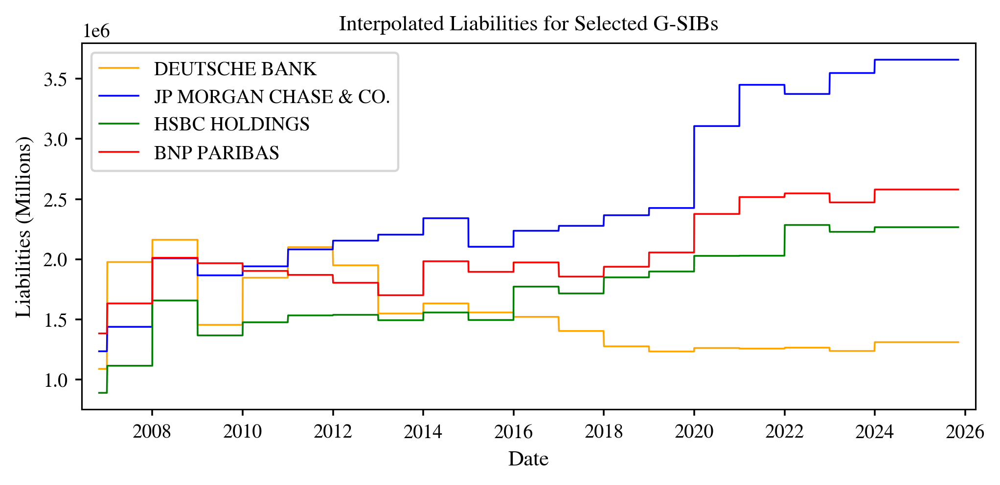

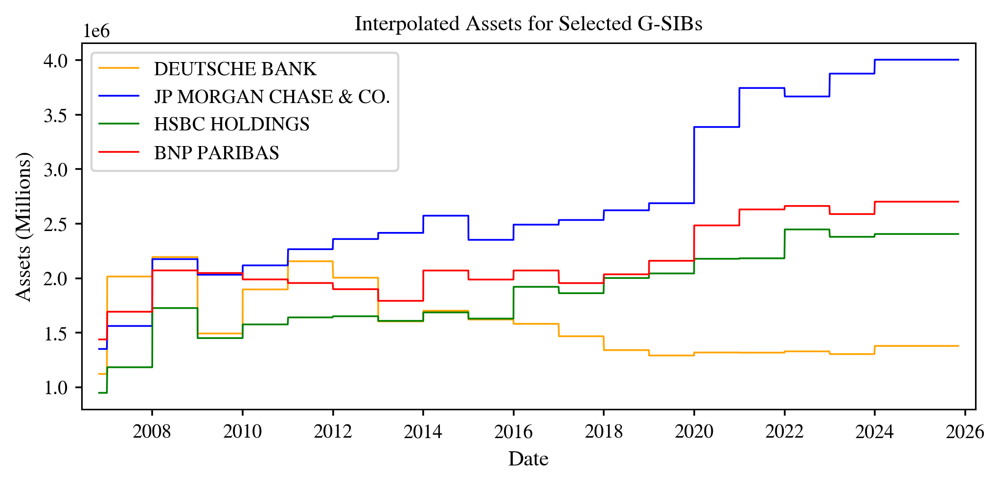

In [35]:
# Plot the interpolated data for visual inspection
# Select a few banks to plot their interpolated liabilities

# Banks to plot
banks_to_plot = [
    "DEUTSCHE BANK",
    "JP MORGAN CHASE & CO.",
    "HSBC HOLDINGS",
    "BNP PARIBAS",
]

colors = ["orange", "blue", "green", "red"]

fig, ax = plt.subplots(figsize=FIG_FULL)

for bank, color in zip(banks_to_plot, colors):
    if bank in GSIBs_liabilities.columns:
        ax.plot(
            GSIBs_liabilities.index,
            GSIBs_liabilities[bank],
            label=bank,
            color=color,
            linewidth=0.8
        )

ax.set_title("Interpolated Liabilities for Selected G-SIBs", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Liabilities (Millions)")

ax.legend(loc="upper left", frameon=True, fontsize=9)
ax.grid(False)
ax.margins(x=0.02)

fig.tight_layout()
plt.show()

# Similarly, plot the interpolated data for assets
fig, ax = plt.subplots(figsize=FIG_FULL)

for bank, color in zip(banks_to_plot, colors):
    if bank in GSIBs_assets.columns:
        ax.plot(
            GSIBs_assets.index,
            GSIBs_assets[bank],
            label=bank,
            color=color,
            linewidth=0.8
        )

ax.set_title("Interpolated Assets for Selected G-SIBs", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Assets (Millions)")

ax.legend(loc="upper left", frameon=True, fontsize=9)
ax.grid(False)
ax.margins(x=0.02)

fig.tight_layout()
plt.show()

In [36]:
# Print the first few rows of the adjusted dataframes
with pd.option_context('display.float_format', '{:,.0f}'.format):
    print("Adjusted GSIBs_liabilities DataFrame (first 5 rows):")
    print(GSIBs_liabilities.head())
    print("Adjusted GSIBs_assets DataFrame (first 5 rows):")
    print(GSIBs_assets.head())

Adjusted GSIBs_liabilities DataFrame (first 5 rows):
            ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP  BANK OF CHINA  \
DATE                                                                           
2025-11-06             2,040,062         1,941,654  1,331,766     32,335,607   
2025-11-05             2,040,062         1,941,654  1,331,766     32,335,607   
2025-11-04             2,040,062         1,941,654  1,331,766     32,335,607   
2025-11-03             2,040,062         1,941,654  1,331,766     32,335,607   
2025-10-31             2,040,062         1,941,654  1,331,766     32,335,607   

            CHINA CON.BANK  INDL&COML.BOC.  BANK OF COMMS.  DEUTSCHE BANK  \
DATE                                                                        
2025-11-06      37,206,699      44,934,163      13,832,212      1,311,456   
2025-11-05      37,206,699      44,934,163      13,832,212      1,311,456   
2025-11-04      37,206,699      44,934,163      13,832,212      1,311,456   
2

### LRMES

We can either exponentially approximate LRMES following Acharya:

In [37]:
# Approximate LRMES for G-SIBs using the conditional betas and a market decline of 40%
market_decline = -0.4

GSIBs_LRMES_beta = 1 - np.exp(GSIBs_beta * market_decline)

# Print the first 10 rows and 4 columns of the G-SIBs LRMES DataFrame
print("LRMES for G-SIBs (first 10 rows and 4 columns):")
print(GSIBs_LRMES_beta.iloc[:5, :4])
# Print the last 10 rows and 4 columns of the G-SIBs LRMES DataFrame
print("LRMES for G-SIBs (last 10 rows and 4 columns):")
print(GSIBs_LRMES_beta.iloc[-5:, :4])

# Save the G-SIBs LRMES DataFrame to a CSV file
GSIBs_LRMES_beta.to_csv('./Outputs/Dataframes/GSIBs_LRMES_beta.csv')

LRMES for G-SIBs (first 10 rows and 4 columns):
            ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP  BANK OF CHINA
DATE                                                                        
2025-11-06              0.212609          0.238414   0.399293       0.161124
2025-11-05              0.219251          0.244360   0.396971       0.159668
2025-11-04              0.220574          0.243798   0.362205       0.158811
2025-11-03              0.209091          0.222041   0.357463       0.158328
2025-10-31              0.200144          0.222211   0.354083       0.128104
LRMES for G-SIBs (last 10 rows and 4 columns):
            ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP  BANK OF CHINA
DATE                                                                        
2006-11-02              0.257778          0.249735   0.453627       0.144072
2006-11-01              0.224475          0.225156   0.452088       0.144500
2006-10-31              0.214216          0.221091   0.448

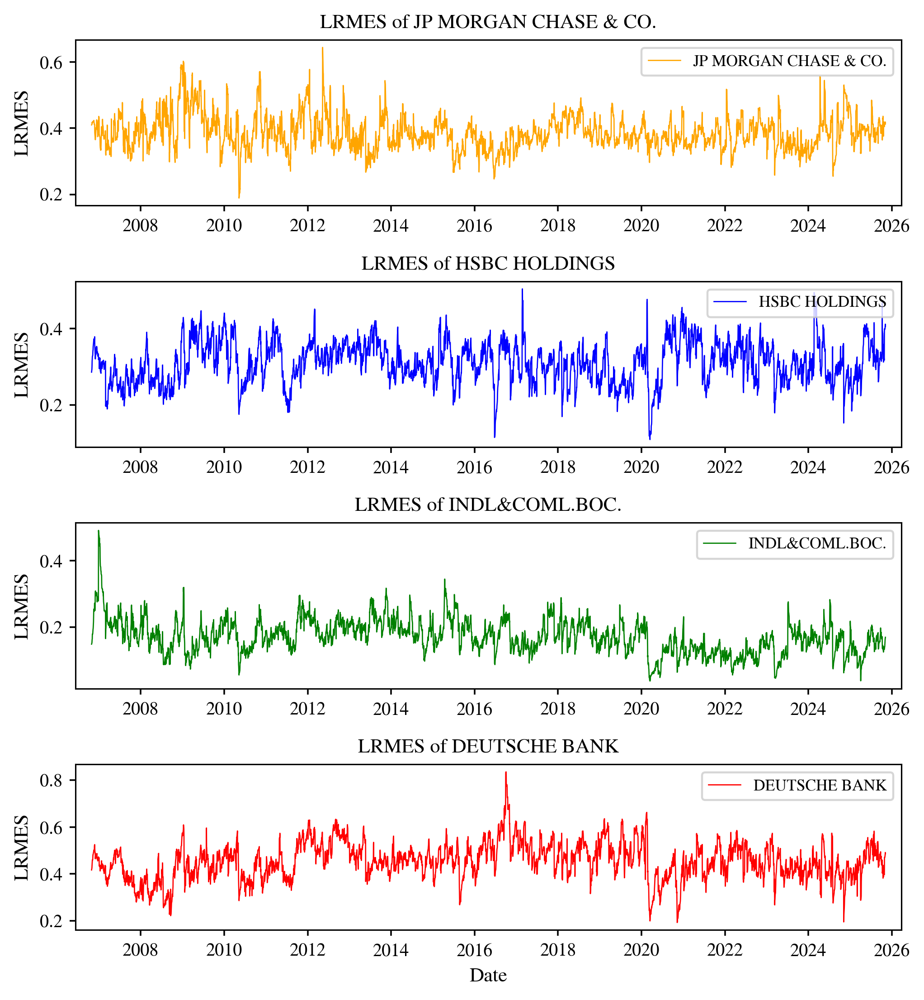

In [38]:
# Select the columns to plot approximated LRMES for selected banks
selected_banks = GSIBs_LRMES_beta.columns[columns_to_plot]

colors = ["orange", "blue", "green", "red"]

# 4 stacked panels
fig, axes = plt.subplots(
    nrows=len(selected_banks),
    ncols=1,
    figsize=(6.5, 7.0),     # consistent with beta figures
    sharex=False
)

for ax, bank, color in zip(axes, selected_banks, colors):
    ax.plot(
        GSIBs_LRMES_beta.index,
        GSIBs_LRMES_beta[bank],
        color=color,
        label=bank
    )

    ax.set_title(f"LRMES of {bank}", pad=6)
    ax.set_ylabel("LRMES")

    ax.legend(loc="upper right", frameon=True, fontsize=8)
    ax.grid(False)
    ax.margins(x=0.02)

# X-axis ticks on all panels
for ax in axes:
    ax.tick_params(axis="x", labelbottom=True)

axes[-1].set_xlabel("Date")

fig.tight_layout()
fig.savefig(FIG_DIR / "LRMES.pdf")
plt.show()


Correlate LRMES with the GPR index

In [39]:
# Calculate correlation between GPR index and LRMES for selected banks
for bank in selected_banks:
    merged_data = pd.merge(GSIBs_LRMES_beta[[bank]], gpr_data, left_index=True, right_index=True, how='inner')
    corr = merged_data[bank].corr(merged_data['GPR'])
    print(f'Correlation between GPR index and LRMES of {bank}: {corr:.4f}')

Correlation between GPR index and LRMES of JP MORGAN CHASE & CO.: -0.0443
Correlation between GPR index and LRMES of HSBC HOLDINGS: 0.0108
Correlation between GPR index and LRMES of INDL&COML.BOC.: -0.1942
Correlation between GPR index and LRMES of DEUTSCHE BANK: 0.0868


Or compute it directly from the DCC-GARCH model output (following Engle/Brownlees):

In [40]:
# Compute LRMES using DCC-GARCH conditional covariances
import numpy as np
import pandas as pd
from scipy.stats import norm

HORIZON_DAYS = 125
CRASH_SIMPLE = -0.40
CRASH_LOG    = np.log(1.0 + CRASH_SIMPLE)

market_idx = 0
BANK_COLS  = gsibs_returns.columns[1:]

# --- Keep your master data descending ---
gsibs_returns_desc = gsibs_returns.copy()

# --- Ascending view ONLY for DCC (does not change your master) ---
gsibs_returns_asc = gsibs_returns_desc.sort_index(ascending=True)

# Fit DCC on ascending data
with localconverter(ro.default_converter + pandas2ri.converter):
    ret_r_asc = ro.conversion.py2rpy(gsibs_returns_asc)

gsibs_dcc_fit_asc = rmgarch.dccfit(gsibs_dcc_spec, data=ret_r_asc)

# Get in-sample filtered conditional covariances (per day)
H_in_asc = rmgarch.rcov(gsibs_dcc_fit_asc)
with localconverter(default_converter + numpy2ri.converter):
    H_in_np = ro.conversion.rpy2py(H_in_asc)

H_in_np = np.asarray(np.squeeze(H_in_np))  # expect (N, N, T)
assert H_in_np.ndim == 3, f"Unexpected rcov shape: {H_in_np.shape}"

N, _, T = H_in_np.shape
assert N == len(gsibs_returns_asc.columns), "N mismatch with columns"
assert T == len(gsibs_returns_asc.index), "T mismatch with index length"

# Compute LRMES for each date t using Sigma_horizon ≈ H * Sigma_t
lrmes_ts = np.full((T, N-1), np.nan, dtype=float)

for t in range(T):
    Sigma = (H_in_np[:, :, t] * HORIZON_DAYS) / (100.0 ** 2)  # to decimal log-return cov

    var_m = Sigma[market_idx, market_idx]
    if not np.isfinite(var_m) or var_m <= 0:
        continue

    sd_m = np.sqrt(var_m)
    logP_crash = norm.logcdf(CRASH_LOG / sd_m)

    j = 0
    for i in range(N):
        if i == market_idx:
            continue

        var_i  = Sigma[i, i]
        cov_im = Sigma[i, market_idx]

        if (not np.isfinite(var_i)) or (not np.isfinite(cov_im)) or var_i < 0:
            lrmes_ts[t, j] = np.nan
        else:
            log_num = norm.logcdf((CRASH_LOG - cov_im) / sd_m)
            cond_E_gross = np.exp(0.5 * var_i + (log_num - logP_crash))
            lrmes_ts[t, j] = 1.0 - cond_E_gross

        j += 1

# Build ascending LRMES DF aligned to ascending dates
GSIBs_LRMES_DCC_asc = pd.DataFrame(lrmes_ts, index=gsibs_returns_asc.index, columns=BANK_COLS)

# Flip back to descending to match your entire codebase
GSIBs_LRMES_DCC = GSIBs_LRMES_DCC_asc.sort_index(ascending=False)

# Save if you want
GSIBs_LRMES_DCC.to_csv("./Outputs/Dataframes/GSIBs_LRMES_DCC_daily_desc.csv")

GSIBs_LRMES_DCC.head()


,ROYAL BANK OF CANADA,TORONTO DOMINION,UBS GROUP,BANK OF CHINA,CHINA CON.BANK,INDL&COML.BOC.,BANK OF COMMS.,DEUTSCHE BANK,BANCO SANTANDER,BNP PARIBAS,...,SUMITOMO MITSUI FINL.GP.,ING GROEP,JP MORGAN CHASE & CO.,CITIGROUP,BANK OF AMERICA,GOLDMAN SACHS GP.,BANK OF NEW YORK MELLON,MORGAN STANLEY,STATE STREET,WELLS FARGO & CO
DATE,,,,,,,,,,,,,,,,,,,,,
2025-11-06,0.265887,0.296431,0.481729,0.197969,0.223067,0.207872,0.186848,0.575428,0.577981,0.565690,...,0.431734,0.575230,0.498659,0.583098,0.586811,0.536371,0.444751,0.557008,0.556211,0.583440
2025-11-05,0.273864,0.303493,0.479319,0.196106,0.217698,0.205366,0.186782,0.581055,0.589389,0.576342,...,0.389855,0.591780,0.505379,0.593397,0.577799,0.544226,0.450788,0.559877,0.560338,0.590823
2025-11-04,0.275640,0.303015,0.441002,0.194838,0.214523,0.201736,0.182447,0.571698,0.590565,0.579578,...,0.371841,0.596058,0.499281,0.593240,0.541976,0.543930,0.444013,0.556549,0.552929,0.592857
2025-11-03,0.262163,0.277519,0.435969,0.193988,0.207938,0.195397,0.175703,0.567050,0.595002,0.582919,...,0.372244,0.600930,0.499864,0.594596,0.543720,0.541763,0.440535,0.557114,0.545651,0.594774
2025-10-31,0.251652,0.277934,0.432473,0.158814,0.179590,0.173269,0.165025,0.558139,0.602127,0.578872,...,0.374286,0.604523,0.498521,0.598367,0.546634,0.542048,0.438266,0.559230,0.537877,0.597351


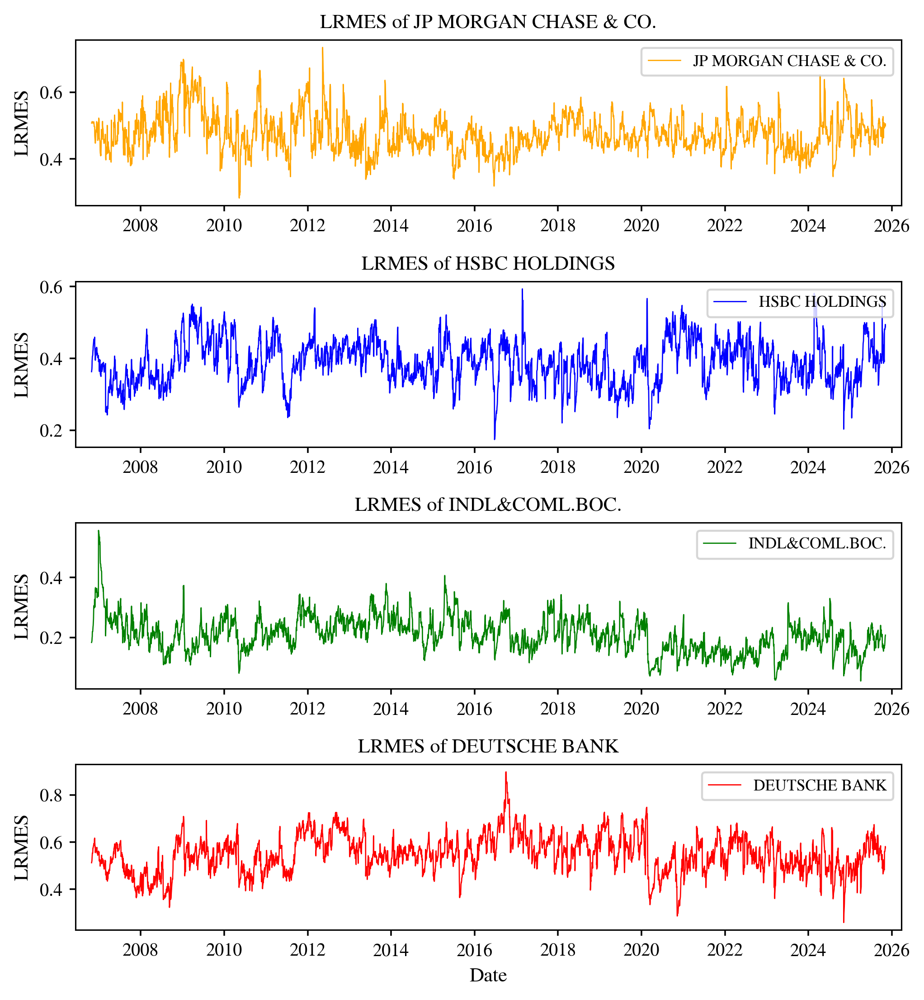

In [41]:
# Plot DCC-based LRMES selected banks
selected_banks = GSIBs_LRMES_DCC.columns[columns_to_plot]
colors = ["orange", "blue", "green", "red"]

fig, axes = plt.subplots(
    nrows=len(selected_banks),
    ncols=1,
    figsize=(6.5, 7.0),
    sharex=False
)

for ax, bank, color in zip(axes, selected_banks, colors):
    ax.plot(GSIBs_LRMES_DCC.index, GSIBs_LRMES_DCC[bank], color=color, label=bank)
    ax.set_title(f"LRMES of {bank}", pad=6)
    ax.set_ylabel("LRMES")
    ax.legend(loc="upper right", frameon=True, fontsize=8)
    ax.grid(False)
    ax.margins(x=0.02)

for ax in axes:
    ax.tick_params(axis="x", labelbottom=True)

axes[-1].set_xlabel("Date")

fig.tight_layout()
fig.savefig(FIG_DIR / "LRMES_DCC.pdf")
plt.show()

In [42]:
# Check correlation between GPR index and DCC LRMES for selected banks
for bank in selected_banks:
    merged_data = pd.merge(GSIBs_LRMES_DCC[[bank]], gpr_data, left_index=True, right_index=True, how='inner')
    corr = merged_data[bank].corr(merged_data['GPR'])
    print(f'Correlation between GPR index and DCC LRMES of {bank}: {corr:.4f}')

Correlation between GPR index and DCC LRMES of JP MORGAN CHASE & CO.: -0.0637
Correlation between GPR index and DCC LRMES of HSBC HOLDINGS: -0.0208
Correlation between GPR index and DCC LRMES of INDL&COML.BOC.: -0.2030
Correlation between GPR index and DCC LRMES of DEUTSCHE BANK: 0.0675


In [43]:
# Set the DCC LRMES as the final LRMES dataframe (or not if commented out)
GSIBs_LRMES = GSIBs_LRMES_DCC

Finally we are ready to apply the SRISK formula

In [44]:
# Set a capital ratio
k = 0.08

# Apply the SRISK formula, without max function because negative values are interesting as well for analysis with absorption capacity
GSIBs_SRISK = k * (GSIBs_liabilities + GSIBs_equity) - (1 - GSIBs_LRMES) * GSIBs_equity

# Print the first 10 rows and all columns of the G-SIBs SRISK DataFrame
print("SRISK for G-SIBs (first 10 rows and all columns):")
with pd.option_context('display.float_format', '{:,.0f}'.format):
    print(GSIBs_SRISK.iloc[:10, :])

# Save the G-SIBs SRISK DataFrame to a CSV file
GSIBs_SRISK.to_csv('./Outputs/Dataframes/GSIBs_SRISK_local.csv')

SRISK for G-SIBs (first 10 rows and all columns):
            ROYAL BANK OF CANADA  TORONTO DOMINION  UBS GROUP  BANK OF CHINA  \
DATE                                                                           
2025-11-06               -25,424            35,224     61,463      2,310,922   
2025-11-05               -23,478            36,260     60,627      2,312,631   
2025-11-04               -22,748            36,471     57,659      2,312,757   
2025-11-03               -28,319            29,793     56,999      2,313,043   
2025-10-31               -29,736            29,896     56,479      2,306,779   
2025-10-30               -29,342            30,639     56,674      2,301,225   
2025-10-29               -28,653            31,234     56,835      2,301,218   
2025-10-28               -45,166            26,972     55,070      2,299,891   
2025-10-27               -44,505            26,452     55,095      2,300,109   
2025-10-24               -40,863            28,672     56,394      2,3

Plot SRISK (still in local currency)

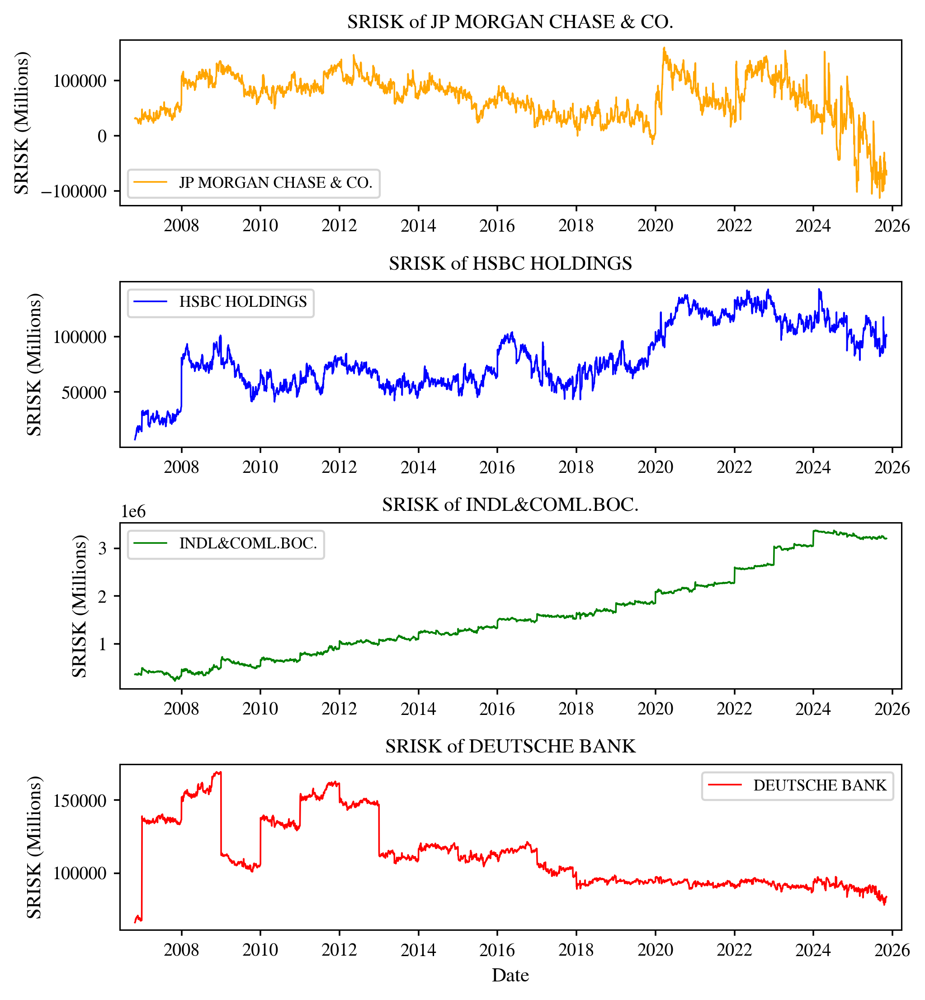

In [45]:
# Plot SRISK for selected G-SIBs in local currencies
# Select the columns to plot selected bank SRISK
selected_banks = GSIBs_SRISK.columns[columns_to_plot]

colors = ["orange", "blue", "green", "red"]

fig, axes = plt.subplots(
    nrows=len(selected_banks),
    ncols=1,
    figsize=(6.5, 7.0),
    sharex=False
)

for ax, bank, color in zip(axes, selected_banks, colors):
    ax.plot(
        GSIBs_SRISK.index,
        GSIBs_SRISK[bank],
        color=color,
        linewidth=0.8,
        label=bank
    )

    ax.set_title(f"SRISK of {bank}", pad=6)
    ax.set_ylabel("SRISK (Millions)")
    ax.margins(x=0.02)
    ax.grid(False)

    ax.legend(loc="best", frameon=True, fontsize=8)

# X-axis formatting
for ax in axes:
    ax.tick_params(axis="x", labelbottom=True)

axes[-1].set_xlabel("Date")

fig.tight_layout()
plt.show()


Converting all inputs to USD using exchange rates for better comparison

In [46]:
# Define start and end dates based on GSIBs_prices index
start_date = "2006-10-27"
end_date   = "2025-11-06"

# Define currency columns based on bank names
cad_cols = ['ROYAL BANK OF CANADA', 'TORONTO DOMINION']
chf_cols = ['UBS GROUP']
cny_cols = ['BANK OF CHINA', 'CHINA CON.BANK', 'INDL&COML.BOC.', 'BANK OF COMMS.']
jpy_cols = ['MITSUBISHI UFJ FINL.GP.', 'MIZUHO FINL.GP.', 'SUMITOMO MITSUI FINL.GP.']
eur_cols = ['DEUTSCHE BANK', 'BANCO SANTANDER', 'BNP PARIBAS', 'CREDIT AGRICOLE', 'SOCIETE GENERALE', 'ING GROEP']
gbp_cols = ['HSBC HOLDINGS', 'BARCLAYS', 'STANDARD CHARTERED']

# Extract exchange rates data via pandas_datareader
series = [
    "DEXCAUS",  # CAD per 1 USD
    "DEXUSEU",  # USD per 1 EUR
    "DEXUSUK",  # USD per 1 GBP
    "DEXSZUS",  # CHF per 1 USD
    "DEXCHUS",  # CNY per 1 USD
    "DEXJPUS",  # JPY per 1 USD
]
exchange_rates = web.DataReader(series, "fred", start_date, end_date)

# Align FX dates robustly (fill in chronological time, then restore your ordering)
idx = GSIBs_liabilities.index  # or union with assets/equity if you want: .union(GSIBs_assets.index).union(GSIBs_equity.index)

fx = (
    exchange_rates
    .sort_index()                      # ascending dates (old -> new)
    .reindex(idx.sort_values())        # align to ascending version of your index
    .ffill()                           # fill using most recent past FX rate
    .reindex(idx)                      # back to your original (descending) index order
)

# Print the first and last few rows of the exchange rates dataframe
print("Exchange Rates Data (first 5 rows):")
print(exchange_rates.head())
print("Exchange Rates Data (last 5 rows):")
print(exchange_rates.tail())

# Convert GSIBs_equity to USD
GSIBs_equity_usd = GSIBs_equity.copy()
GSIBs_equity_usd[cad_cols] = GSIBs_equity_usd[cad_cols].div(fx["DEXCAUS"], axis=0)
GSIBs_equity_usd[chf_cols] = GSIBs_equity_usd[chf_cols].div(fx["DEXSZUS"], axis=0)
GSIBs_equity_usd[cny_cols] = GSIBs_equity_usd[cny_cols].div(fx["DEXCHUS"], axis=0)
GSIBs_equity_usd[jpy_cols] = GSIBs_equity_usd[jpy_cols].div(fx["DEXJPUS"], axis=0)
GSIBs_equity_usd[eur_cols] = GSIBs_equity_usd[eur_cols].mul(fx["DEXUSEU"], axis=0)
GSIBs_equity_usd[gbp_cols] = GSIBs_equity_usd[gbp_cols].mul(fx["DEXUSUK"], axis=0)

# Convert GSIBs_liabilities to USD
GSIBs_liabilities_usd = GSIBs_liabilities.copy()
GSIBs_liabilities_usd[cad_cols] = GSIBs_liabilities_usd[cad_cols].div(fx["DEXCAUS"], axis=0)
GSIBs_liabilities_usd[chf_cols] = GSIBs_liabilities_usd[chf_cols].div(fx["DEXSZUS"], axis=0)
GSIBs_liabilities_usd[cny_cols] = GSIBs_liabilities_usd[cny_cols].div(fx["DEXCHUS"], axis=0)
GSIBs_liabilities_usd[jpy_cols] = GSIBs_liabilities_usd[jpy_cols].div(fx["DEXJPUS"], axis=0)
GSIBs_liabilities_usd[eur_cols] = GSIBs_liabilities_usd[eur_cols].mul(fx["DEXUSEU"], axis=0)
GSIBs_liabilities_usd[gbp_cols] = GSIBs_liabilities_usd[gbp_cols].mul(fx["DEXUSUK"], axis=0)

# Convert GSIBs_assets to USD
GSIBs_assets_usd = GSIBs_assets.copy()
GSIBs_assets_usd[cad_cols] = GSIBs_assets_usd[cad_cols].div(fx["DEXCAUS"], axis=0)
GSIBs_assets_usd[chf_cols] = GSIBs_assets_usd[chf_cols].div(fx["DEXSZUS"], axis=0)
GSIBs_assets_usd[cny_cols] = GSIBs_assets_usd[cny_cols].div(fx["DEXCHUS"], axis=0)
GSIBs_assets_usd[jpy_cols] = GSIBs_assets_usd[jpy_cols].div(fx["DEXJPUS"], axis=0)
GSIBs_assets_usd[eur_cols] = GSIBs_assets_usd[eur_cols].mul(fx["DEXUSEU"], axis=0)
GSIBs_assets_usd[gbp_cols] = GSIBs_assets_usd[gbp_cols].mul(fx["DEXUSUK"], axis=0)

# Print the first 10 rows and all columns of the converted dataframes
with pd.option_context('display.float_format', '{:,.0f}'.format):
    print("GSIBs_liabilities in USD (first 10 rows and all columns):")
    print(GSIBs_liabilities_usd.iloc[:10, :])
    print("GSIBs_assets in USD (first 10 rows and all columns):")
    print(GSIBs_assets_usd.iloc[:10, :])



Exchange Rates Data (first 5 rows):
            DEXCAUS  DEXUSEU  DEXUSUK  DEXSZUS  DEXCHUS  DEXJPUS
DATE                                                            
2006-10-27   1.1185   1.2725   1.8968   1.2496   7.8886   117.61
2006-10-30   1.1235   1.2717   1.9025   1.2488   7.8728   117.38
2006-10-31   1.1227   1.2773   1.9084   1.2424   7.8785   116.82
2006-11-01   1.1313   1.2771   1.9091   1.2433   7.8714   117.01
2006-11-02   1.1361   1.2780   1.9088   1.2443   7.8720   117.12
Exchange Rates Data (last 5 rows):
            DEXCAUS  DEXUSEU  DEXUSUK  DEXSZUS  DEXCHUS  DEXJPUS
DATE                                                            
2025-10-31   1.4010   1.1541   1.3141   0.8027   7.1169   154.05
2025-11-03   1.4049   1.1531   1.3150   0.8073   7.1222   154.13
2025-11-04   1.4081   1.1491   1.3044   0.8091   7.1295   153.55
2025-11-05   1.4108   1.1485   1.3051   0.8107   7.1260   154.11
2025-11-06   1.4127   1.1539   1.3107   0.8069   7.1195   152.97
GSIBs_liabilities i

# SRISK in USD

Now that we have everything in the same currency, we can actually start comparing G-SIBs and looking at nSRISK and try to find other interesting statistics.

In [47]:
# Compute SRISK in USD for three different capital ratios, with and without the max operator

k_values = [0.055, 0.08, 0.10]

# Version without max (as in the original code)
GSIBs_SRISK_no_max = {}
for k in k_values:
    GSIBs_SRISK_no_max[k] = k * (GSIBs_liabilities_usd + GSIBs_equity_usd) - (1 - GSIBs_LRMES) * GSIBs_equity_usd
    GSIBs_SRISK_no_max[k].to_csv(f'./Outputs/Dataframes/SRISK_usd_no_max_k{k:.3f}.csv')

# Version with max operator (standard SRISK)
GSIBs_SRISK_with_max = {}
for k in k_values:
    GSIBs_SRISK_with_max[k] = np.maximum(0, k * (GSIBs_liabilities_usd + GSIBs_equity_usd) - (1 - GSIBs_LRMES) * GSIBs_equity_usd)
    GSIBs_SRISK_with_max[k].to_csv(f'./Outputs/Dataframes/SRISK_usd_with_max_k{k:.3f}.csv')

Aggregate SRISK, when we do this we do like to have the max{0,...} operator

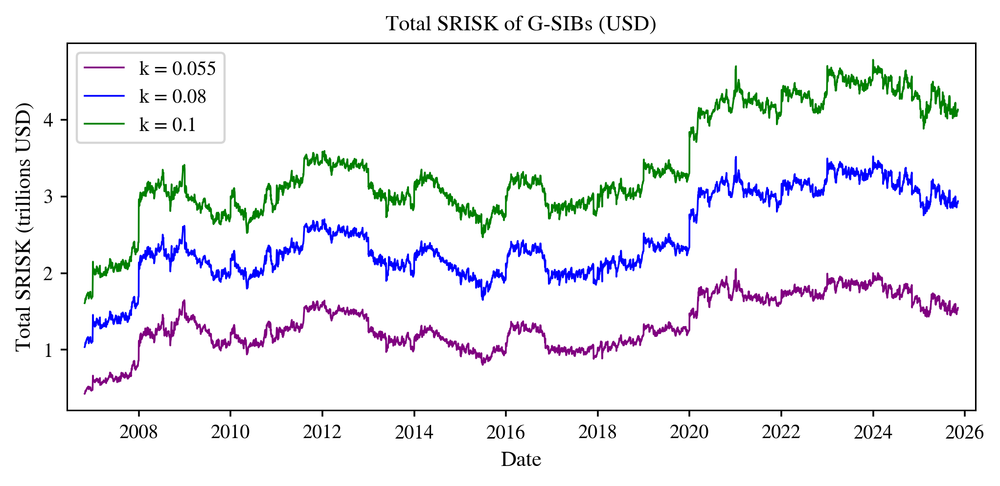

In [82]:
# Aggregate SRISK across all G-SIBs in USD
GSIBs_SRISK_total_usd = {
    k: GSIBs_SRISK_with_max[k].sum(axis=1)
    for k in k_values
}

colors = ["purple", "blue", "green"]

fig, ax = plt.subplots(figsize=FIG_FULL)

for k, color in zip(k_values, colors):
    ax.plot(
        GSIBs_SRISK_total_usd[k].index,
        GSIBs_SRISK_total_usd[k] / 1e6,  # Convert millions to trillions
        label=f"k = {k}",
        linewidth=0.8,
        color=color
    )

ax.set_title("Total SRISK of G-SIBs (USD)", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Total SRISK (trillions USD)")  # Updated label

ax.legend(loc="upper left", frameon=True, fontsize=9)
ax.grid(False)
ax.margins(x=0.02)

fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK.pdf")
plt.show()

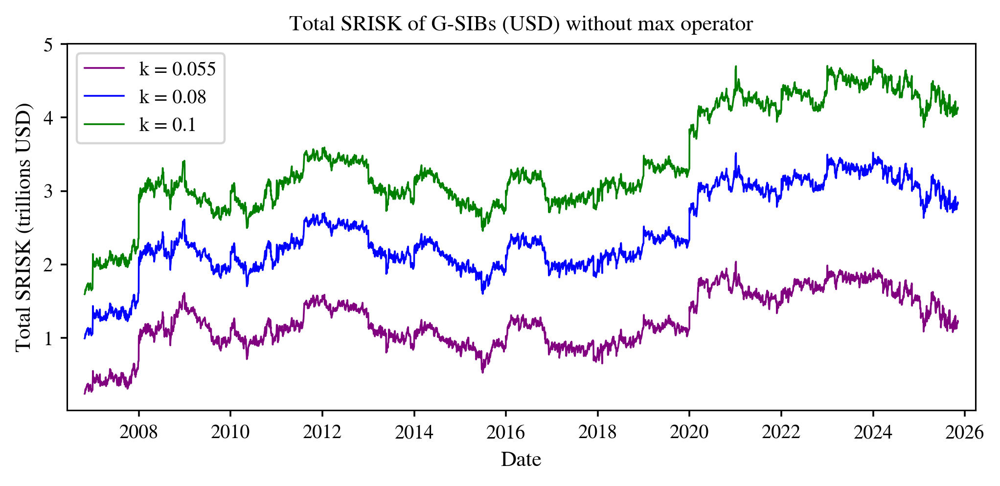

In [49]:
# Aggregate SRISK across all G-SIBs in USD without max operator
GSIBs_SRISK_total_usd_no_max = {
    k: GSIBs_SRISK_no_max[k].sum(axis=1)
    for k in k_values
}

colors = ["purple", "blue", "green"]

fig, ax = plt.subplots(figsize=FIG_FULL)

for k, color in zip(k_values, colors):
    ax.plot(
        GSIBs_SRISK_total_usd_no_max[k].index,
        GSIBs_SRISK_total_usd_no_max[k] / 1e6,  # Convert millions to trillions
        label=f"k = {k}",
        linewidth=0.8,
        color=color
    )

ax.set_title("Total SRISK of G-SIBs (USD) without max operator", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Total SRISK (trillions USD)")  # Updated label

ax.legend(loc="upper left", frameon=True, fontsize=9)
ax.grid(False)
ax.margins(x=0.02)

fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_no_max.pdf")
plt.show()

In [50]:
# Check the differences between SRISK with and without max operator
for k in k_values:
    diff = GSIBs_SRISK_with_max[k] - GSIBs_SRISK_no_max[k]
    num_nonzero = (diff != 0).sum().sum()
    print(f'Number of non-zero differences in SRISK for k={k}: {num_nonzero}')

Number of non-zero differences in SRISK for k=0.055: 26947
Number of non-zero differences in SRISK for k=0.08: 6060
Number of non-zero differences in SRISK for k=0.1: 1465


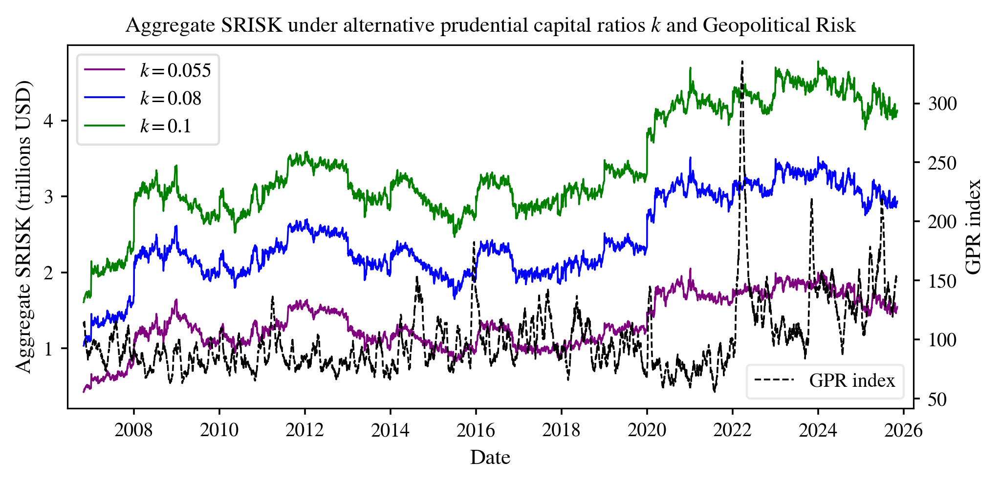

In [51]:
# Plot aggregate SRISK for different capital ratios (k) with GPR index on double axis
colors = ["purple", "blue", "green"]

fig, ax1 = plt.subplots(figsize=FIG_FULL)
ax2 = ax1.twinx()

# Left axis: aggregate SRISK
for k, color in zip(k_values, colors):
    ax1.plot(
        GSIBs_SRISK_total_usd[k].index,
        GSIBs_SRISK_total_usd[k] / 1e6,  # Convert millions to trillions
        label=fr"$k = {k}$",
        color=color,
        linewidth=0.8
    )

# Right axis: GPR index
ax2.plot(
    gpr_data.index,
    gpr_data["GPR"],
    color="black",
    linestyle="--",
    linewidth=0.8,
    label="GPR index"
)

ax1.set_title(r"Aggregate SRISK under alternative prudential capital ratios $k$ and Geopolitical Risk", pad=6)
ax1.set_xlabel("Date")
ax1.set_ylabel("Aggregate SRISK (trillions USD)")
ax2.set_ylabel("GPR index")

# Legends (separate, transparent, consistent)
leg1 = ax1.legend(loc="upper left", frameon=True, fontsize=9)
leg1.get_frame().set_alpha(0.4)
ax1.add_artist(leg1)

leg2 = ax2.legend(loc="lower right", frameon=True, fontsize=9)
leg2.get_frame().set_alpha(0.4)

ax1.grid(False)
ax1.margins(x=0.02)

fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_with_gpr.pdf")
plt.show()


In [52]:
# Check the correlations between aggregate SRISK and GPR index for each k
for k in k_values:
    merged_data = pd.merge(GSIBs_SRISK_total_usd[k].rename('Total_SRISK'), gpr_data, left_index=True, right_index=True, how='inner')
    corr = merged_data['Total_SRISK'].corr(merged_data['GPR'])
    print(f'Correlation between total SRISK (k={k}) of G-SIBs and GPR index: {corr:.4f}')
    

Correlation between total SRISK (k=0.055) of G-SIBs and GPR index: 0.2462
Correlation between total SRISK (k=0.08) of G-SIBs and GPR index: 0.3178
Correlation between total SRISK (k=0.1) of G-SIBs and GPR index: 0.3554


Our key chart will focus on one capital ratio, k = 0.08, since this is most in line with Basel. The others are for robustness and show that dynamics remain the same.

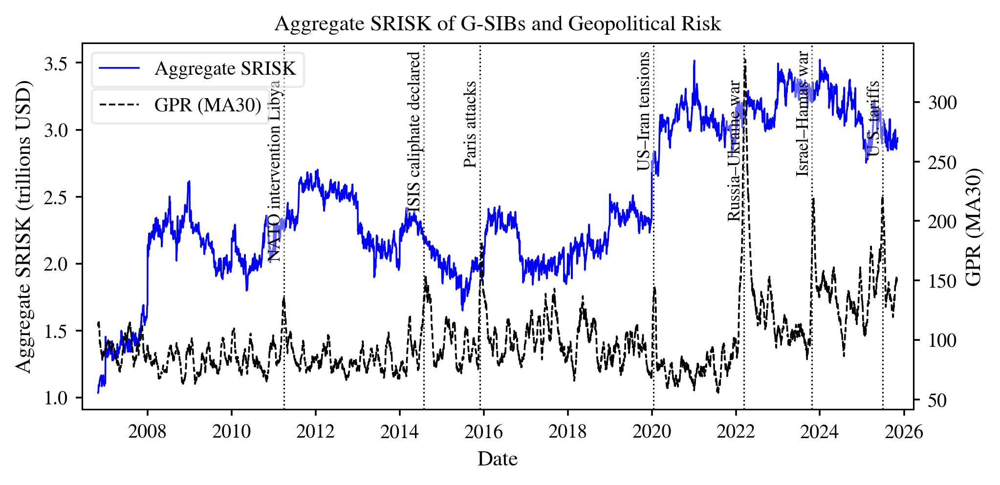

In [53]:
# Plot total SRISK and GPR index over time for k=0.08
k = 0.08
fig, ax1 = plt.subplots(figsize=FIG_FULL)
ax2 = ax1.twinx()

# Left axis: total SRISK
ax1.plot(
    GSIBs_SRISK_total_usd[k].index,
    GSIBs_SRISK_total_usd[k] / 1e6,  # Convert millions to trillions
    label="Aggregate SRISK",
    color="blue",
    linewidth=0.8
)

# Right axis: GPR index
ax2.plot(
    gpr_data.index,
    gpr_data["GPR"],
    color="black",
    linestyle="--",
    linewidth=0.8,
    label="GPR (MA30)"
)

ax1.set_title("Aggregate SRISK of G-SIBs and Geopolitical Risk", pad=6)
ax1.set_xlabel("Date")
ax1.set_ylabel("Aggregate SRISK (trillions USD)")
ax2.set_ylabel("GPR (MA30)")

# Event markers
events = [
    ("Israel–Hezbollah war", "2006-07-12"),
    ("NATO intervention Libya", "2011-03-30"),  
    ("ISIS caliphate declared", "2014-07-29"),
    ("Paris attacks", "2015-11-30"),
    ("US–Iran tensions", "2020-01-15"),
    ("Russia–Ukraine war", "2022-03-10"),
    ("Israel–Hamas war", "2023-10-25"),
    ("U.S. tariffs", "2025-07-01"),
]

xmin, xmax = GSIBs_SRISK_total_usd[k].index.min(), GSIBs_SRISK_total_usd[k].index.max()
for i, (label, date_str) in enumerate(events):
    dt = pd.Timestamp(date_str)
    if not (xmin <= dt <= xmax):
        continue
    ax1.axvline(dt, color="black", linestyle=":", linewidth=0.7)
    y_pos = 0.98 if i % 2 == 0 else 0.90
    ax1.text(
        dt,
        y_pos,
        label,
        transform=ax1.get_xaxis_transform(),
        rotation=90,
        va="top",
        ha="right",
        fontsize=8,
        bbox=dict(facecolor="white", edgecolor="none", alpha=0.4, pad=0.6),
    )

# --- Legends (ONLY change) ---
h1, l1 = ax1.get_legend_handles_labels()
h2, l2 = ax2.get_legend_handles_labels()

leg1 = ax1.legend(
    h1, l1,
    loc="upper left",
    bbox_to_anchor=(0.0, 1),
    frameon=True,
    fontsize=9
)
leg1.get_frame().set_alpha(0.4)
ax1.add_artist(leg1)

leg2 = ax1.legend(
    h2, l2,
    loc="upper left",
    bbox_to_anchor=(0.0, 0.9),
    frameon=True,
    fontsize=9
)
leg2.get_frame().set_alpha(0.4)

ax1.grid(False)
ax1.margins(x=0.02)
fig.tight_layout()
plt.show()



In [54]:
# Check correlation between total SRISK and GPR index for the different periods, so 2006-2019 and 2020-2025, for k=0.08
k = 0.08
for period, (start, end) in {
    "2006-2019": ("2006-01-01", "2019-12-31"),
    "2020-2025": ("2019-12-20", "2025-12-31")
}.items():
    # Sort to ascending order for proper slicing
    srisk_sorted = GSIBs_SRISK_total_usd[k].sort_index()
    gpr_sorted = gpr_data.sort_index()
    
    merged_data = pd.merge(
        srisk_sorted.rename('Total_SRISK').loc[start:end],
        gpr_sorted.loc[start:end],
        left_index=True,
        right_index=True,
        how='inner'
    )
    if not merged_data.empty:
        corr = merged_data['Total_SRISK'].corr(merged_data['GPR'])
        print(f'Correlation between total SRISK (k={k}) of G-SIBs and GPR index for {period}: {corr:.4f}')
    else:
        print(f'No overlapping data for {period} after slicing.')

Correlation between total SRISK (k=0.08) of G-SIBs and GPR index for 2006-2019: -0.1675
Correlation between total SRISK (k=0.08) of G-SIBs and GPR index for 2020-2025: 0.1258


## Rolling window correlation

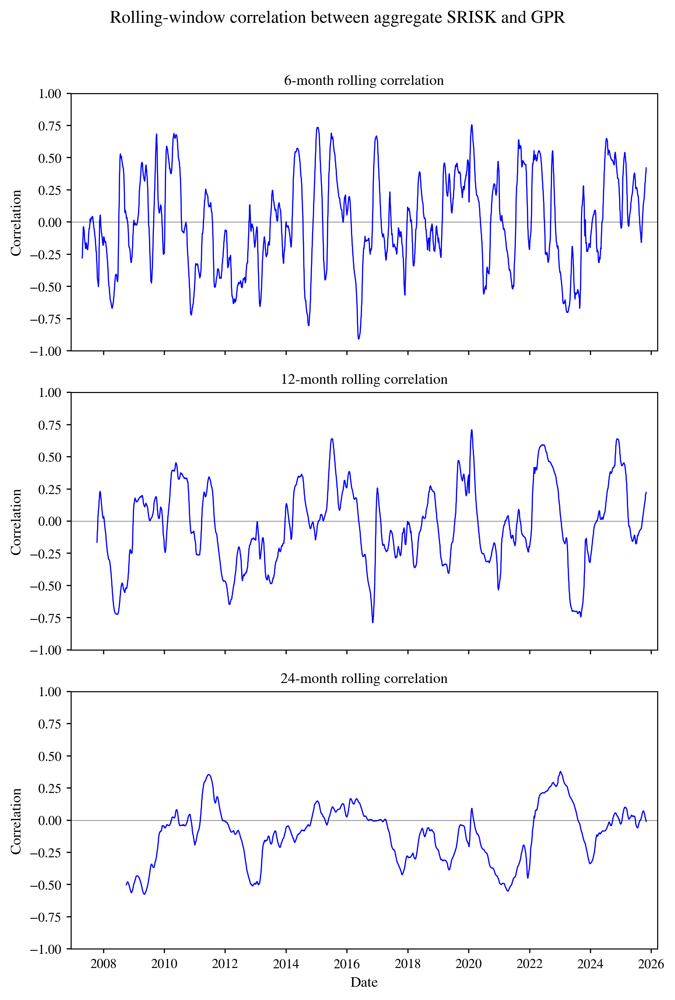

In [55]:
# Calculate rolling window correlation between total SRISK and GPR index for k=0.08 (stacked figure)
k = 0.08
window_sizes = [126, 252, 504]
srisk_sorted = GSIBs_SRISK_total_usd[k].sort_index()
gpr_sorted = gpr_data.sort_index()

merged_data = pd.merge(
    srisk_sorted.rename('Total_SRISK'),
    gpr_sorted,
    left_index=True,
    right_index=True,
    how='inner'
)

fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(6.5, 9.6), sharex=True)

window_labels = ['6-month', '12-month', '24-month']

fig.suptitle("Rolling-window correlation between aggregate SRISK and GPR", y=0.98)

for i, (window_size, label) in enumerate(zip(window_sizes, window_labels)):
    rolling_corr = merged_data['Total_SRISK'].rolling(window=window_size).corr(merged_data['GPR'])

    axes[i].plot(rolling_corr.index, rolling_corr, color="blue", linewidth=0.8)
    axes[i].axhline(0, color="black", linewidth=0.6, alpha=0.4)
    axes[i].set_ylim(-1, 1)

    axes[i].set_title(f"{label} rolling correlation", pad=6)
    axes[i].set_ylabel("Correlation")
    axes[i].grid(False)
    axes[i].margins(x=0.02)

axes[-1].set_xlabel("Date")

fig.tight_layout(rect=[0, 0, 1, 0.965])
fig.savefig(FIG_DIR / "Rolling_Correlation_SRISK_GPR_multi.pdf")
plt.show()


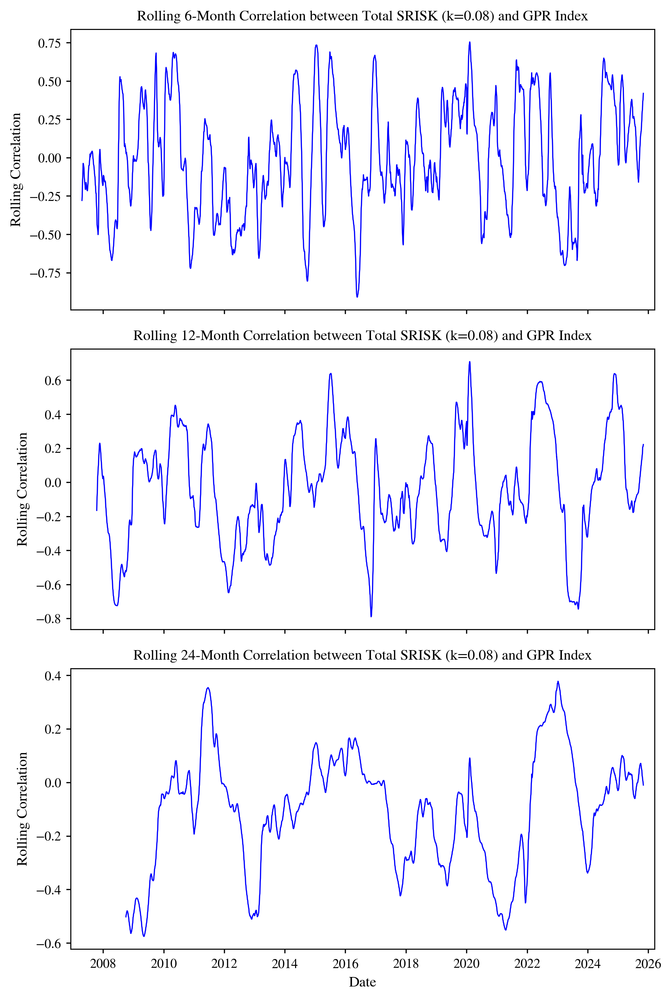

In [56]:
# Calculate the rolling window correlation between total SRISK and GPR index for k=0.08 with window sizes of 6 months, 12 months, and 24 months for comparison in a stacked figure.
k = 0.08
window_sizes = [126, 252, 504]  # 6 months, 12 months, 24 months in trading days
srisk_sorted = GSIBs_SRISK_total_usd[k].sort_index()
gpr_sorted = gpr_data.sort_index()
merged_data = pd.merge(
    srisk_sorted.rename('Total_SRISK'),
    gpr_sorted,
    left_index=True,
    right_index=True,
    how='inner'
)

# Create a figure with 3 stacked subplots
fig, axes = plt.subplots(
    nrows=3,
    ncols=1,
    figsize=(6.5, 9.6),  # Adjust height for stacked plots
    sharex=True
)

window_labels = ['6-Month', '12-Month', '24-Month']

for i, (window_size, label) in enumerate(zip(window_sizes, window_labels)):
    rolling_corr = merged_data['Total_SRISK'].rolling(window=window_size).corr(merged_data['GPR'])
    
    axes[i].plot(
        rolling_corr.index,
        rolling_corr,
        color="blue",
        linewidth=0.8
    )
    
    axes[i].set_title(f"Rolling {label} Correlation between Total SRISK (k={k}) and GPR Index", pad=6)
    axes[i].set_ylabel("Rolling Correlation")
    axes[i].grid(False)
    axes[i].margins(x=0.02)

# Set x-label on the bottom subplot
axes[-1].set_xlabel("Date")

fig.tight_layout()
fig.savefig(FIG_DIR / "Rolling_Correlation_SRISK_GPR_multi.pdf")
plt.show()

Compute a table of the SRISK in descending order for certain years

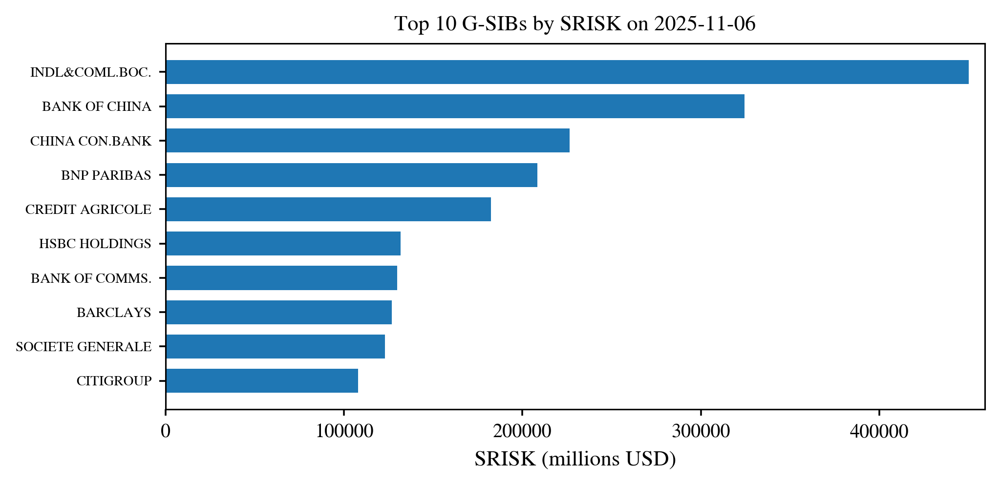

In [87]:
# Plot a horizontal bar chart of SRISK for the Top 10 G-SIBs at a specified date

k_bar = 0.08
RANK_DATE = "2025-11-06"     # <- change this
TOP_N = 10

# Optional cap for readability (data are in "millions")
# 1e6 millions = 1 trillion
cap_millions = 1e6  # set None to disable

# Your SRISK-with-max object (as in your old code)
srisk_df = GSIBs_SRISK_with_max[k_bar].copy()
srisk_df.index = pd.to_datetime(srisk_df.index)

rank_date = pd.to_datetime(RANK_DATE)

# If exact date not available (weekend/holiday), use most recent available date <= RANK_DATE
if rank_date not in srisk_df.index:
    srisk_upto = srisk_df.loc[srisk_df.index <= rank_date]
    if srisk_upto.empty:
        raise ValueError(
            f"No SRISK data on or before {rank_date.date()}. "
            f"First available date is {srisk_df.index.min().date()}."
        )
    used_date = srisk_upto.index.max()
else:
    used_date = rank_date

# Values at the chosen date
srisk_on_date = srisk_df.loc[used_date].dropna()

# Optional: cap extreme outliers
if cap_millions is not None:
    srisk_on_date = srisk_on_date[srisk_on_date < cap_millions]

# Keep Top N (largest SRISK)
srisk_top = srisk_on_date.sort_values(ascending=False).head(TOP_N)

if srisk_top.empty:
    print(f"No SRISK values to plot for {used_date.date()}.")
else:
    # For barh: sort ascending so biggest appears at the top
    srisk_plot = srisk_top.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=FIG_FULL)
    ax.barh(srisk_plot.index, srisk_plot.values, height=0.7)

    ax.set_title(f"Top {TOP_N} G-SIBs by SRISK on {used_date.date()}", pad=6)
    ax.set_xlabel("SRISK (millions USD)")
    ax.set_ylabel("")

    ax.grid(False)
    ax.margins(x=0.02)
    ax.tick_params(axis="y", labelsize=6.5)

    fig.tight_layout()
    plt.show()

Next we calculate individual nSRISK, which is defined as SRISK divided by market value of equity or assets. We do this individually per G-SIB for ranking purposes.

In [91]:
# Calculate nSRISK for G-SIBs by dividing SRISK by market value of equity
GSIBs_nSRISK = {}
for k in k_values:
    GSIBs_nSRISK[k] = GSIBs_SRISK_with_max[k].div(GSIBs_equity_usd)
    GSIBs_nSRISK[k].to_csv(f'./Outputs/Dataframes/nSRISK_usd_k{k:.3f}.csv')

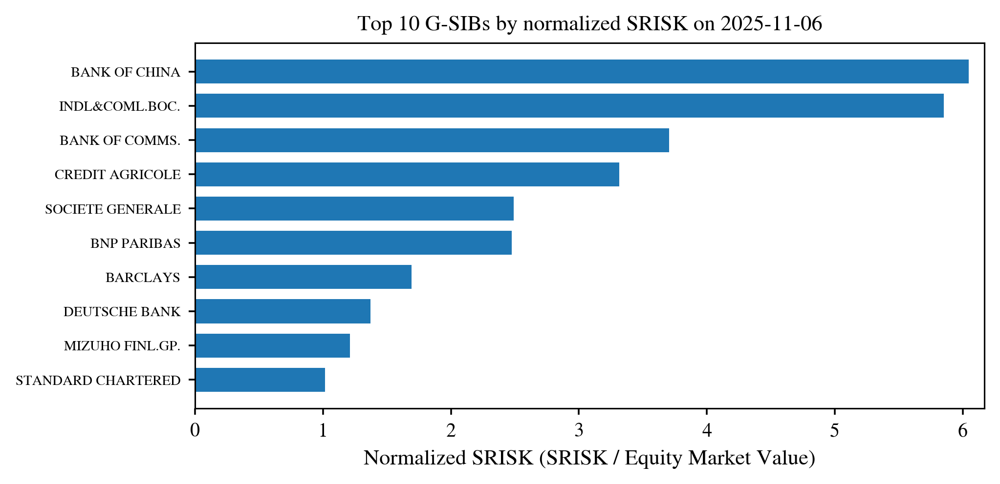

In [92]:
# Plot a horizontal bar chart of normalized SRISK (nSRISK) for the Top 10 G-SIBs at a specified date

k_bar = 0.08
RANK_DATE = "2025-11-07"     # <- change this
TOP_N = 10

# Optional cap for readability (nSRISK is a ratio)
cap_ratio = None  # e.g., 1.0 to cap extreme outliers; None = no cap

# Your nSRISK object (as in your old code)
srisk_df = GSIBs_nSRISK[k_bar].copy()
srisk_df.index = pd.to_datetime(srisk_df.index)

rank_date = pd.to_datetime(RANK_DATE)

# If exact date not available (weekend/holiday), use most recent available date <= RANK_DATE
if rank_date not in srisk_df.index:
    srisk_upto = srisk_df.loc[srisk_df.index <= rank_date]
    if srisk_upto.empty:
        raise ValueError(
            f"No nSRISK data on or before {rank_date.date()}. "
            f"First available date is {srisk_df.index.min().date()}."
        )
    used_date = srisk_upto.index.max()
else:
    used_date = rank_date

# Values at the chosen date
nsrisk_on_date = srisk_df.loc[used_date].dropna()

# Optional: cap extreme outliers
if cap_ratio is not None:
    nsrisk_on_date = nsrisk_on_date[nsrisk_on_date < cap_ratio]

# Keep Top N (largest nSRISK)
nsrisk_top = nsrisk_on_date.sort_values(ascending=False).head(TOP_N)

if nsrisk_top.empty:
    print(f"No nSRISK values to plot for {used_date.date()}.")
else:
    # For barh: sort ascending so biggest appears at the top
    nsrisk_plot = nsrisk_top.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=FIG_FULL)
    ax.barh(nsrisk_plot.index, nsrisk_plot.values, height=0.7)

    ax.set_title(f"Top {TOP_N} G-SIBs by normalized SRISK on {used_date.date()}", pad=6)
    ax.set_xlabel("Normalized SRISK (SRISK / Equity Market Value)")
    ax.set_ylabel("")

    ax.grid(False)
    ax.margins(x=0.02)
    ax.tick_params(axis="y", labelsize=6.5)

    fig.tight_layout()
    plt.show()

In [93]:
# Calculate nSRISK for G-SIBs by dividing SRISK by assets
GSIBs_nSRISK_assets = {}
for k in k_values:
    GSIBs_nSRISK_assets[k] = GSIBs_SRISK_with_max[k].div(GSIBs_assets_usd)
    GSIBs_nSRISK_assets[k].to_csv(f'./Outputs/Dataframes/nSRISK_assets_usd_k{k:.3f}.csv')

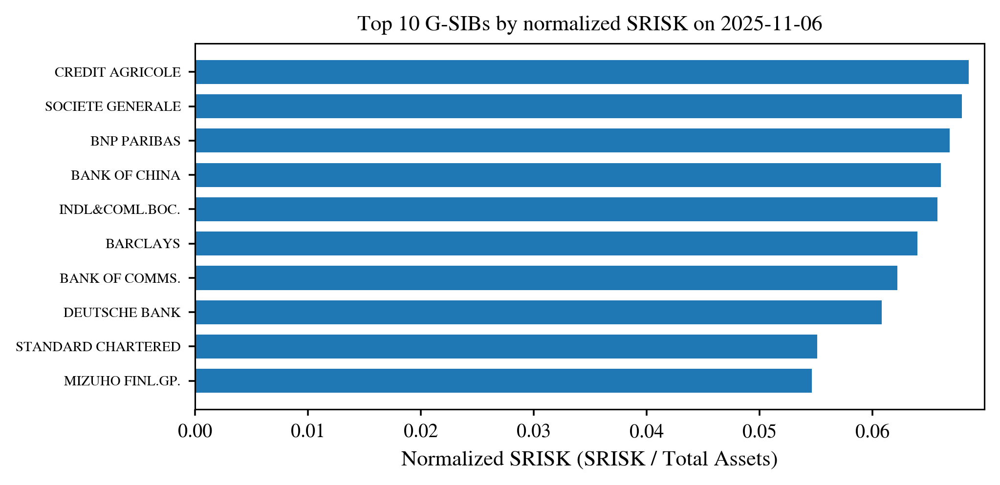

In [94]:
# Plot a horizontal bar chart of normalized SRISK (nSRISK) for the Top 10 G-SIBs at a specified date

k_bar = 0.08
RANK_DATE = "2025-11-07"     # <- change this
TOP_N = 10

# Optional cap for readability (nSRISK is a ratio)
cap_ratio = None  # e.g., 1.0 to cap extreme outliers; None = no cap

# Your nSRISK object (as in your old code)
srisk_df = GSIBs_nSRISK_assets[k_bar].copy()
srisk_df.index = pd.to_datetime(srisk_df.index)

rank_date = pd.to_datetime(RANK_DATE)

# If exact date not available (weekend/holiday), use most recent available date <= RANK_DATE
if rank_date not in srisk_df.index:
    srisk_upto = srisk_df.loc[srisk_df.index <= rank_date]
    if srisk_upto.empty:
        raise ValueError(
            f"No nSRISK data on or before {rank_date.date()}. "
            f"First available date is {srisk_df.index.min().date()}."
        )
    used_date = srisk_upto.index.max()
else:
    used_date = rank_date

# Values at the chosen date
nsrisk_on_date = srisk_df.loc[used_date].dropna()

# Optional: cap extreme outliers
if cap_ratio is not None:
    nsrisk_on_date = nsrisk_on_date[nsrisk_on_date < cap_ratio]

# Keep Top N (largest nSRISK)
nsrisk_top = nsrisk_on_date.sort_values(ascending=False).head(TOP_N)

if nsrisk_top.empty:
    print(f"No nSRISK values to plot for {used_date.date()}.")
else:
    # For barh: sort ascending so biggest appears at the top
    nsrisk_plot = nsrisk_top.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=FIG_FULL)
    ax.barh(nsrisk_plot.index, nsrisk_plot.values, height=0.7)

    ax.set_title(f"Top {TOP_N} G-SIBs by normalized SRISK on {used_date.date()}", pad=6)
    ax.set_xlabel("Normalized SRISK (SRISK / Total Assets)")
    ax.set_ylabel("")

    ax.grid(False)
    ax.margins(x=0.02)
    ax.tick_params(axis="y", labelsize=6.5)

    fig.tight_layout()
    plt.show()

Next we want to compute the system level nSRISK to see how it correlates with GPR. This is different from summing the individual nSRISK values since this would give equal weight to each G-SIB.

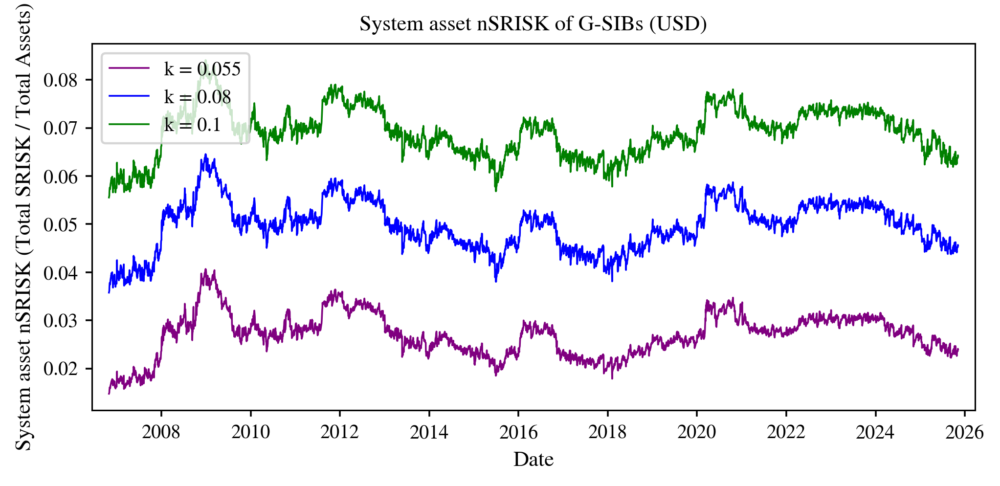

In [60]:
# --- System-level nSRISK (asset-weighted): sum(SRISK)/sum(Assets) ---
# SRISK and assets are both in millions USD, so the ratio is unitless.
# Interpretable as "capital shortfall as a fraction of total G-SIB assets".

GSIBs_system_assets_nSRISK_usd = {}

# total assets across all banks (millions USD)
total_assets_usd = GSIBs_assets_usd.sum(axis=1)

for k in k_values:
    # total SRISK across all banks (millions USD)
    total_srisk_usd = GSIBs_SRISK_with_max[k].sum(axis=1)

    # system nSRISK = total SRISK / total assets (unitless)
    GSIBs_system_assets_nSRISK_usd[k] = (total_srisk_usd / total_assets_usd).replace([np.inf, -np.inf], np.nan)

colors = ["purple", "blue", "green"]
fig, ax = plt.subplots(figsize=FIG_FULL)

for k, color in zip(k_values, colors):
    ax.plot(
        GSIBs_system_assets_nSRISK_usd[k].index,
        GSIBs_system_assets_nSRISK_usd[k],
        label=f"k = {k}",
        linewidth=0.8,
        color=color,
    )

ax.set_title("System asset nSRISK of G-SIBs (USD)", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("System asset nSRISK (Total SRISK / Total Assets)")

# Optional: make it easier to read as a percent
# ax.set_ylabel("System nSRISK (%)")
# ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))

ax.legend(loc="upper left", frameon=True, fontsize=9)
ax.grid(False)
ax.margins(x=0.02)

fig.tight_layout()
# If you don't want saving, remove the next line:
fig.savefig(FIG_DIR / "System_asset_nSRISK.pdf")
plt.show()


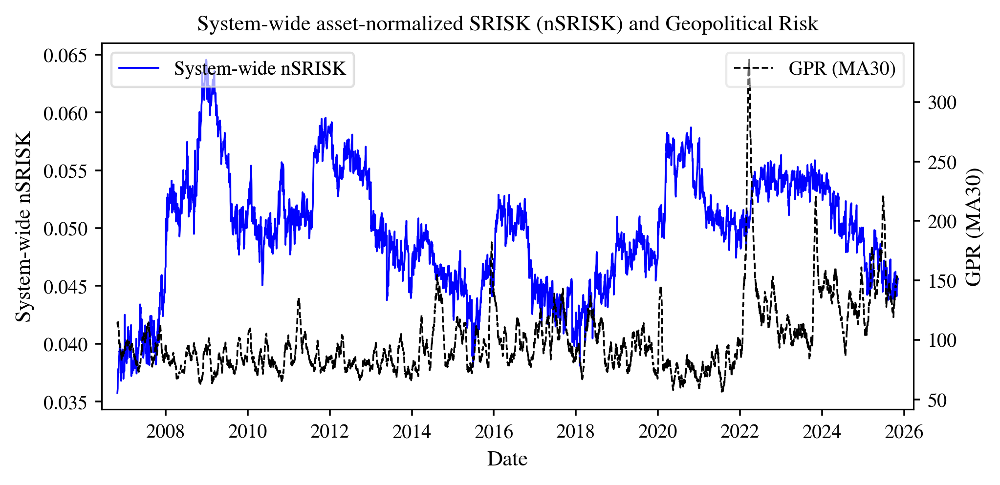

Correlation between system nSRISK (k=0.055) of G-SIBs and GPR index: -0.1173
Correlation between system nSRISK (k=0.08) of G-SIBs and GPR index: -0.1144
Correlation between system nSRISK (k=0.1) of G-SIBs and GPR index: -0.1145


In [61]:
# --- System-level nSRISK (asset-weighted) with GPR index ---
GSIBs_system_nSRISK_usd = {}
total_assets_usd = GSIBs_assets_usd.sum(axis=1)

for k in k_values:
    total_srisk_usd = GSIBs_SRISK_with_max[k].sum(axis=1)
    GSIBs_system_nSRISK_usd[k] = (total_srisk_usd / total_assets_usd).replace([np.inf, -np.inf], np.nan)

colors = ["purple", "blue", "green"]
fig, ax1 = plt.subplots(figsize=FIG_FULL)
ax2 = ax1.twinx()

# Left axis: system nSRISK (plot ONLY k=0.08 without changing your structure)
k_fixed = 0.08
ax1.plot(
    GSIBs_system_nSRISK_usd[k_fixed].index,
    GSIBs_system_nSRISK_usd[k_fixed],
    label="System-wide nSRISK",
    linewidth=0.8,
    color="blue",
)

# Right axis: GPR index
ax2.plot(
    gpr_data.index,
    gpr_data["GPR"],
    color="black",
    linestyle="--",
    linewidth=0.8,
    label="GPR (MA30)"
)

ax1.set_title("System-wide asset-normalized SRISK (nSRISK) and Geopolitical Risk", pad=6)
ax1.set_xlabel("Date")
ax1.set_ylabel("System-wide nSRISK")
ax2.set_ylabel("GPR (MA30)")

leg1 = ax1.legend(loc="upper left", frameon=True, fontsize=9)
leg1.get_frame().set_alpha(0.4)
ax1.add_artist(leg1)

leg2 = ax2.legend(loc="upper right", frameon=True, fontsize=9)
leg2.get_frame().set_alpha(0.4)

ax1.grid(False)
ax1.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "System_asset_nSRISK_with_gpr.pdf")
plt.show()


# Check the correlations between system nSRISK and GPR index for each k
for k in k_values:
    merged_data = pd.merge(GSIBs_system_nSRISK_usd[k].rename('System_nSRISK'), gpr_data, left_index=True, right_index=True, how='inner')
    corr = merged_data['System_nSRISK'].corr(merged_data['GPR'])
    print(f'Correlation between system nSRISK (k={k}) of G-SIBs and GPR index: {corr:.4f}')

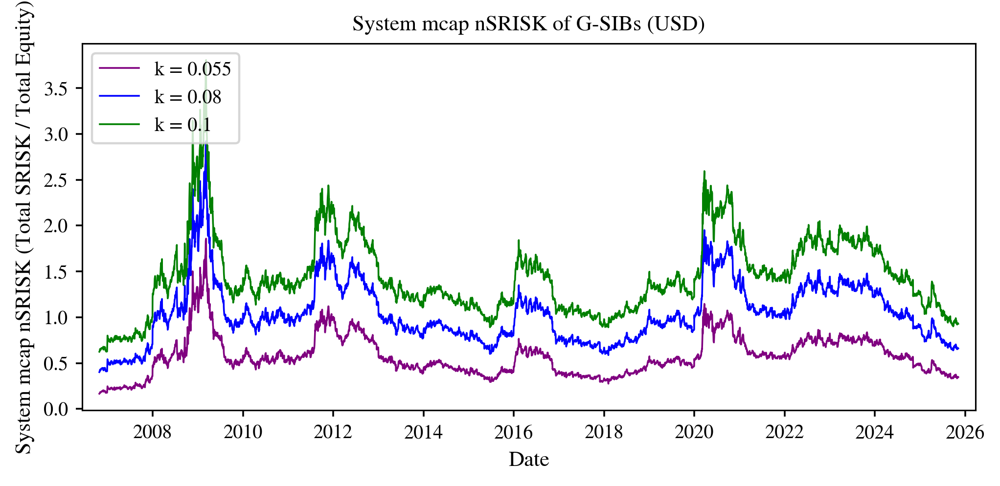

In [62]:
# --- System-level nSRISK (mcap-weighted): sum(SRISK)/sum(Equity) ---
# SRISK and equity are both in millions USD, so the ratio is unitless.
# Interpretable as "capital shortfall as a fraction of total G-SIB equity".

GSIBs_system_mcap_nSRISK_usd = {}

# total equity across all banks (millions USD)
total_equity_usd = GSIBs_equity_usd.sum(axis=1)

for k in k_values:
    # total SRISK across all banks (millions USD)
    total_srisk_usd = GSIBs_SRISK_with_max[k].sum(axis=1)

    # system nSRISK = total SRISK / total equity (unitless)
    GSIBs_system_mcap_nSRISK_usd[k] = (total_srisk_usd / total_equity_usd).replace([np.inf, -np.inf], np.nan)

colors = ["purple", "blue", "green"]
fig, ax = plt.subplots(figsize=FIG_FULL)

for k, color in zip(k_values, colors):
    ax.plot(
        GSIBs_system_mcap_nSRISK_usd[k].index,
        GSIBs_system_mcap_nSRISK_usd[k],
        label=f"k = {k}",
        linewidth=0.8,
        color=color,
    )

ax.set_title("System mcap nSRISK of G-SIBs (USD)", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("System mcap nSRISK (Total SRISK / Total Equity)")
# Optional: make it easier to read as a percent
# ax.set_ylabel("System mcap nSRISK (%)")
# ax.yaxis.set_major_formatter(mticker.PercentFormatter(xmax=1.0))

ax.legend(loc="upper left", frameon=True, fontsize=9)
ax.grid(False)
ax.margins(x=0.02)

fig.tight_layout()
# If you don't want saving, remove the next line:
fig.savefig(FIG_DIR / "System_mcap_nSRISK.pdf")
plt.show()

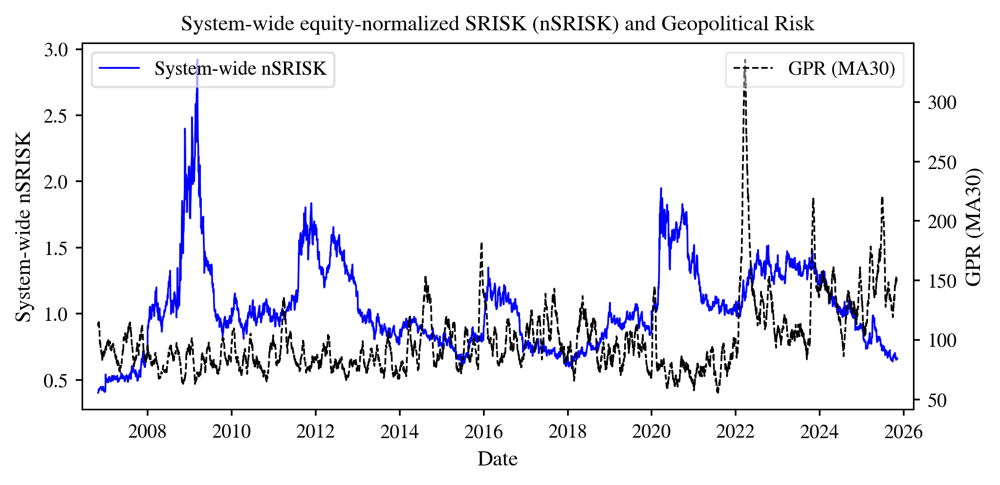

Correlation between system mcap nSRISK (k=0.055) of G-SIBs and GPR index: -0.1337
Correlation between system mcap nSRISK (k=0.08) of G-SIBs and GPR index: -0.1266
Correlation between system mcap nSRISK (k=0.1) of G-SIBs and GPR index: -0.1235


In [63]:
# --- System-level nSRISK (mcap-weighted) with GPR index ---
GSIBs_system_mcap_nSRISK_usd = {}
total_equity_usd = GSIBs_equity_usd.sum(axis=1)

for k in k_values:
    total_srisk_usd = GSIBs_SRISK_with_max[k].sum(axis=1)
    GSIBs_system_mcap_nSRISK_usd[k] = (total_srisk_usd / total_equity_usd).replace([np.inf, -np.inf], np.nan)

colors = ["purple", "blue", "green"]
fig, ax1 = plt.subplots(figsize=FIG_FULL)
ax2 = ax1.twinx()

# Left axis: system nSRISK (plot ONLY k=0.08 without changing your structure)
k_fixed = 0.08
ax1.plot(
    GSIBs_system_mcap_nSRISK_usd[k_fixed].index,
    GSIBs_system_mcap_nSRISK_usd[k_fixed],
    label="System-wide nSRISK",
    linewidth=0.8,
    color="blue",
)

# Right axis: GPR index
ax2.plot(
    gpr_data.index,
    gpr_data["GPR"],
    color="black",
    linestyle="--",
    linewidth=0.8,
    label="GPR (MA30)"
)

ax1.set_title("System-wide equity-normalized SRISK (nSRISK) and Geopolitical Risk", pad=6)
ax1.set_xlabel("Date")
ax1.set_ylabel("System-wide nSRISK")
ax2.set_ylabel("GPR (MA30)")

leg1 = ax1.legend(loc="upper left", frameon=True, fontsize=9)
leg1.get_frame().set_alpha(0.4)
ax1.add_artist(leg1)

leg2 = ax2.legend(loc="upper right", frameon=True, fontsize=9)
leg2.get_frame().set_alpha(0.4)

ax1.grid(False)
ax1.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "System_mcap_nSRISK_with_gpr.pdf")
plt.show()

# Check the correlations between system mcap nSRISK and GPR index for each k
for k in k_values:
    merged_data = pd.merge(GSIBs_system_mcap_nSRISK_usd[k].rename('System_mcap_nSRISK'), gpr_data, left_index=True, right_index=True, how='inner')
    corr = merged_data['System_mcap_nSRISK'].corr(merged_data['GPR'])
    print(f'Correlation between system mcap nSRISK (k={k}) of G-SIBs and GPR index: {corr:.4f}')

### Direction checks GPR > SRISK. Produce regression output for the results section.

Resultaat: GPR heeft geen explanatory power after accounting for persistence in SRISK.

In [64]:
# import numpy as np
# import pandas as pd

# DECIMALS = 4
# out_csv = "table_5_1.csv"

# def stars(p):
#     if p < 0.01: return "***"
#     if p < 0.05: return "**"
#     if p < 0.10: return "*"
#     return ""

# def fmt(res, var, decimals=4):
#     if var not in res.params.index:
#         return "", ""
#     coef = res.params[var]
#     se   = res.bse[var]
#     pval = res.pvalues[var]
#     return f"{coef:.{decimals}f}{stars(pval)}", f"({se:.{decimals}f})"

# def wald_pvalue(res, vars_to_test):
#     """
#     Robust Wald test using the model's covariance (HAC in your fit).
#     H0: all coefficients on vars_to_test are jointly zero.
#     Returns np.nan if none of the vars are in the model.
#     """
#     present = [v for v in vars_to_test if v in res.params.index]
#     if len(present) == 0:
#         return np.nan

#     k = len(res.params)
#     R = np.zeros((len(present), k))
#     idx = {name: i for i, name in enumerate(res.params.index)}
#     for r, v in enumerate(present):
#         R[r, idx[v]] = 1.0

#     # wald_test uses the covariance already attached to res (HAC)
#     wt = res.wald_test(R)
#     return float(wt.pvalue)

# def print_table_with_tests(rows, colnames, models, decimals=4):
#     lines = []
#     lines.append([""] + colnames)

#     # coefficients + SEs (two-line format)
#     for var, label in rows:
#         coef_row = [label]
#         se_row = [""]
#         for m in models:
#             c, s = fmt(m, var, decimals=decimals)
#             coef_row.append(c)
#             se_row.append(s)
#         lines.append(coef_row)
#         lines.append(se_row)

#     # fit stats
#     lines.append(["R2"]      + [f"{m.rsquared:.3f}" for m in models])
#     lines.append(["Adj. R2"] + [f"{m.rsquared_adj:.3f}" for m in models])
#     lines.append(["N"]       + [f"{int(m.nobs)}" for m in models])

#     # robust Wald tests (HAC-consistent)
#     # joint test for lag+lead (only meaningful for models that include both)
#     joint_vars = ["GPR_std_lag1", "GPR_std_lead1"]
#     joint_p = [wald_pvalue(m, joint_vars) for m in models]
#     lines.append(["Wald p: GPR_{t-1}=GPR_{t+1}=0"] +
#                  [("" if np.isnan(p) else f"{p:.3f}") for p in joint_p])

#     # single test lag only (all models)
#     lag_p = [wald_pvalue(m, ["GPR_std_lag1"]) for m in models]
#     lines.append(["Wald p: GPR_{t-1}=0"] +
#                  [("" if np.isnan(p) else f"{p:.3f}") for p in lag_p])

#     tab = pd.DataFrame(lines[1:], columns=lines[0])
#     print(tab.to_string(index=False))
#     return tab

# # --- Your already-estimated models ---
# models = [m1, m2, m3]

# colnames = [
#     "(1) SRISK (USD tn)",
#     "(2) SRISK (USD tn) + lag",
#     "(3) ΔSRISK (USD tn)"
# ]

# rows = [
#     ("const", "Constant"),
#     ("GPR_std_lag1", "GPR_{t-1} (std.)"),
#     ("GPR_std_lead1", "GPR_{t+1} (std., placebo)"),
#     ("SRISK_tn_lag1", "SRISK_{t-1} (USD tn)"),
# ]

# print("\nTable 5.1 — Predictive regressions: SRISK and GPR (monthly)\n")
# tab = print_table_with_tests(rows, colnames, models, decimals=DECIMALS)

# tab.to_csv(out_csv, index=False)
# print(f"\nSaved table to: {out_csv}")


In [65]:
# ADF and KPSS tests for stationarity of total SRISK and GPR index
import pandas as pd
import numpy as np
from statsmodels.tsa.stattools import adfuller, kpss

# -----------------------------
# Config
# -----------------------------
K_BASELINE = 0.08
OUT_CSV    = "appendix_stationarity_tests_k008.csv"
OUT_TEX    = "appendix_stationarity_tests_k008.tex"

# -----------------------------
# Helpers
# -----------------------------
def _fmt_p(p):
    # KPSS p-values are often bounded (0.01 / 0.10 in lookup tables)
    # If you got the "outside the range" warning, interpret as p < 0.01
    if p <= 0.01 + 1e-12:
        return "<0.01"
    if p >= 0.10 - 1e-12:
        return ">0.10"
    return f"{p:.3f}"

def _run_adf(x: pd.Series, regression: str):
    x = pd.Series(x).dropna().astype(float)
    stat, pval, usedlag, nobs, crit, _ = adfuller(x, regression=regression, autolag="AIC")
    return {
        "ADF stat": stat,
        "ADF p": pval,
        "ADF lags": usedlag,
        "N": nobs,
        "ADF cv 1%": crit.get("1%"),
        "ADF cv 5%": crit.get("5%"),
        "ADF cv 10%": crit.get("10%")
    }

def _run_kpss(x: pd.Series, regression: str):
    x = pd.Series(x).dropna().astype(float)
    stat, pval, lags, crit = kpss(x, regression=regression, nlags="auto")
    return {
        "KPSS stat": stat,
        "KPSS p": pval,
        "KPSS lags": lags,
        "KPSS cv 1%": crit.get("1%"),
        "KPSS cv 5%": crit.get("5%"),
        "KPSS cv 10%": crit.get("10%")
    }

def run_stationarity_suite(srisk: pd.Series, gpr: pd.Series) -> pd.DataFrame:
    """
    Returns a tidy appendix table with ADF + KPSS for:
      - SRISK level, ΔSRISK
      - GPR level,   ΔGPR
    under:
      - constant ("c")
      - constant+trend ("ct")
    """
    # Align indices (daily trading-day intersection)
    idx = srisk.dropna().index.intersection(gpr.dropna().index)
    srisk = srisk.loc[idx]
    gpr   = gpr.loc[idx]

    series_dict = {
        "SRISK (level)": srisk,
        "ΔSRISK": srisk.diff(),
        "GPR (level)": gpr,
        "ΔGPR": gpr.diff(),
    }

    specs = [
        ("Const", "c"),         # ADF: constant; KPSS: level-stationary
        ("Const+Trend", "ct"),  # ADF: constant+trend; KPSS: trend-stationary
    ]

    rows = []
    for spec_label, reg in specs:
        for sname, x in series_dict.items():
            adf_res  = _run_adf(x, regression=reg)
            kpss_res = _run_kpss(x, regression=reg)

            rows.append({
                "Series": sname,
                "Spec": spec_label,
                "ADF stat": adf_res["ADF stat"],
                "ADF p": adf_res["ADF p"],
                "ADF lags": adf_res["ADF lags"],
                "KPSS stat": kpss_res["KPSS stat"],
                "KPSS p": kpss_res["KPSS p"],
                "KPSS lags": kpss_res["KPSS lags"],
                "N": adf_res["N"],
            })

    df = pd.DataFrame(rows)

    # Pretty formatting for appendix
    pretty = df.copy()
    pretty["ADF stat"]  = pretty["ADF stat"].map(lambda v: f"{v:.3f}")
    pretty["ADF p"]     = pretty["ADF p"].map(lambda v: f"{v:.3f}")
    pretty["KPSS stat"] = pretty["KPSS stat"].map(lambda v: f"{v:.3f}")
    pretty["KPSS p"]    = pretty["KPSS p"].map(_fmt_p)
    pretty["ADF lags"]  = pretty["ADF lags"].astype(int).astype(str)
    pretty["KPSS lags"] = pretty["KPSS lags"].astype(int).astype(str)
    pretty["N"]         = pretty["N"].astype(int).astype(str)

    # Order like an appendix table
    pretty["Series"] = pd.Categorical(
        pretty["Series"],
        categories=["SRISK (level)", "ΔSRISK", "GPR (level)", "ΔGPR"],
        ordered=True
    )
    pretty["Spec"] = pd.Categorical(
        pretty["Spec"],
        categories=["Const", "Const+Trend"],
        ordered=True
    )
    pretty = pretty.sort_values(["Series", "Spec"]).reset_index(drop=True)

    return pretty

# -----------------------------
# Run (baseline k = 0.08)
# -----------------------------
# Assumes these objects exist in your workspace:
#   GSIBs_SRISK_total_usd : dict-like with keys 0.08
#   gpr_data["GPR"]       : monthly (or already prepared) GPR series
srisk_series = GSIBs_SRISK_total_usd[K_BASELINE].dropna()
gpr_series   = gpr_data["GPR"].dropna()

appendix_tab = run_stationarity_suite(srisk_series, gpr_series)

# Save outputs
appendix_tab.to_csv(OUT_CSV, index=False)

latex = appendix_tab.to_latex(
    index=False,
    escape=False,
    column_format="l l r r r r r r r".replace("r", "c"),  # centered columns
    caption="ADF and KPSS stationarity tests for aggregate SRISK and GPR (monthly, baseline $k=0.08$).",
    label="tab:stationarity_tests",
)

# Add a short note (edit as needed)
note = (
    "% Notes: ADF null is a unit root; KPSS null is stationarity (around a constant or trend).\n"
    "% KPSS p-values are based on lookup tables and may be reported as <0.01 when the statistic exceeds the table range.\n"
)

with open(OUT_TEX, "w", encoding="utf-8") as f:
    f.write(note)
    f.write(latex)

print(appendix_tab)
print(f"\nSaved CSV  to: {OUT_CSV}")
print(f"Saved LaTeX to: {OUT_TEX}")


C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\2068624493.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  stat, pval, lags, crit = kpss(x, regression=regression, nlags="auto")
C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\2068624493.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  stat, pval, lags, crit = kpss(x, regression=regression, nlags="auto")
C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\2068624493.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  stat, pval, lags, crit = kpss(x, regression=regression, nlags="auto")
C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\2068624493.py:40: InterpolationWarnin

          Series         Spec ADF stat  ADF p ADF lags KPSS stat KPSS p  \
0  SRISK (level)        Const   -0.908  0.785        5     7.309  <0.01   
1  SRISK (level)  Const+Trend   -2.504  0.326        5     1.044  <0.01   
2         ΔSRISK        Const  -32.177  0.000        5     0.119  >0.10   
3         ΔSRISK  Const+Trend  -32.188  0.000        5     0.074  >0.10   
4    GPR (level)        Const   -6.013  0.000       31     3.139  <0.01   
5    GPR (level)  Const+Trend   -7.060  0.000       32     0.369  <0.01   
6           ΔGPR        Const  -12.565  0.000       32     0.016  >0.10   
7           ΔGPR  Const+Trend  -12.567  0.000       32     0.006  >0.10   

  KPSS lags     N  
0        42  4955  
1        42  4955  
2        29  4954  
3        30  4954  
4        42  4929  
5        42  4928  
6        35  4927  
7        35  4927  

Saved CSV  to: appendix_stationarity_tests_k008.csv
Saved LaTeX to: appendix_stationarity_tests_k008.tex


C:\Users\Asus\AppData\Local\Temp\ipykernel_8348\2068624493.py:40: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  stat, pval, lags, crit = kpss(x, regression=regression, nlags="auto")


## Regional grouping

We group the G-SIBs across three regions: North-America, Europe, China & Japan

In [66]:
# Categorize banks by region for further analysis
# Option 1: Four regions
# banks_by_region = {
#     "North America": [
#         "JP MORGAN CHASE & CO.",
#         "CITIGROUP",
#         "BANK OF AMERICA",
#         "GOLDMAN SACHS GP.",
#         "MORGAN STANLEY",
#         "WELLS FARGO & CO",
#         "BANK OF NEW YORK MELLON",
#         "STATE STREET",
#         "ROYAL BANK OF CANADA",
#         "TORONTO DOMINION",
#     ],
#     "Europe": [
#         "DEUTSCHE BANK",
#         "UBS GROUP",
#         "CREDIT AGRICOLE",
#         "BNP PARIBAS",
#         "SOCIETE GENERALE",
#         "BANCO SANTANDER",
#         "ING GROEP",
#         "BARCLAYS",
#         "HSBC HOLDINGS",
#         "STANDARD CHARTERED",
#     ],
#     "China": [
#         "BANK OF CHINA",
#         "CHINA CON.BANK",
#         "INDL&COML.BOC.",
#         "BANK OF COMMS.",
#     ],
#     "Japan": [
#         "MITSUBISHI UFJ FINL.GP.",
#         "MIZUHO FINL.GP.",
#         "SUMITOMO MITSUI FINL.GP.",
#     ],
# }

# Option 2: Three regions (Asia combines China and Japan)
banks_by_region = {
    "North America": [
        "JP MORGAN CHASE & CO.",
        "CITIGROUP",
        "BANK OF AMERICA",
        "GOLDMAN SACHS GP.",
        "MORGAN STANLEY",
        "WELLS FARGO & CO",
        "BANK OF NEW YORK MELLON",
        "STATE STREET",
        "ROYAL BANK OF CANADA",
        "TORONTO DOMINION",
    ],
    "Europe": [
        "DEUTSCHE BANK",
        "UBS GROUP",
        "CREDIT AGRICOLE",
        "BNP PARIBAS",
        "SOCIETE GENERALE",
        "BANCO SANTANDER",
        "ING GROEP",
        "BARCLAYS",
        "HSBC HOLDINGS",
        "STANDARD CHARTERED",
    ],
    "Asia": [
        "BANK OF CHINA",
        "CHINA CON.BANK",
        "INDL&COML.BOC.",
        "BANK OF COMMS.",
        "MITSUBISHI UFJ FINL.GP.",
        "MIZUHO FINL.GP.",
        "SUMITOMO MITSUI FINL.GP.",
    ],
}


First we aggregate SRISK per region and try to look for patterns

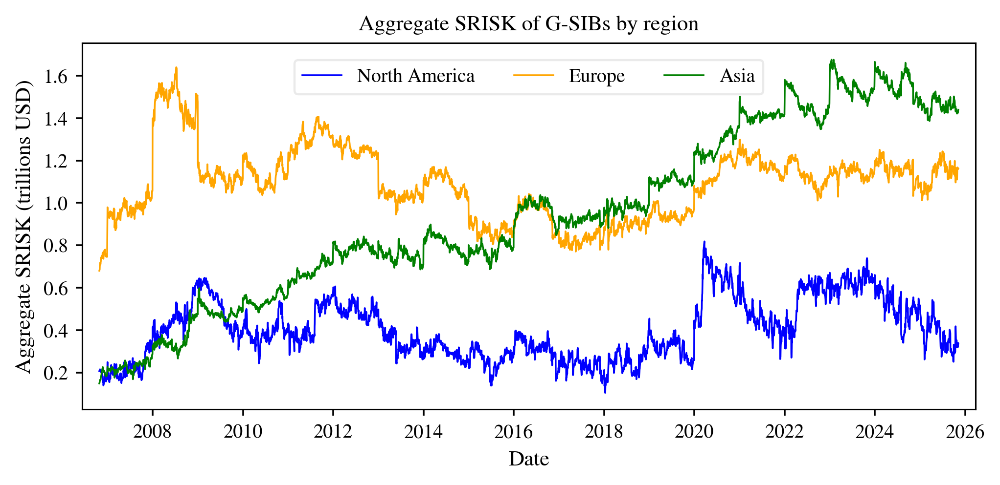

In [67]:
# Aggregate SRISK per region in USD for k=0.08
k_region = 0.08
GSIBs_SRISK_region_usd = {}
for region, banks in banks_by_region.items():
    GSIBs_SRISK_region_usd[region] = GSIBs_SRISK_with_max[k_region][banks].sum(axis=1)

# Plot aggregate SRISK per region in USD over time
colors = ["blue", "orange", "green", "red"]
fig, ax = plt.subplots(figsize=FIG_FULL)

for (region, srisk_series), color in zip(GSIBs_SRISK_region_usd.items(), colors[:len(GSIBs_SRISK_region_usd)]):
    ax.plot(
        srisk_series.index,
        srisk_series / 1e6,  # Convert millions to trillions
        label=region,
        linewidth=0.8,
        color=color
    )

ax.set_title(f"Aggregate SRISK of G-SIBs by region", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Aggregate SRISK (trillions USD)")

# Fixed, consistent legend placement (won’t move around across figures/exports)
leg = ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 0.98),
    frameon=True,
    fontsize=9,
    ncol=len(GSIBs_SRISK_region_usd)  # keeps it in one neat row when 3 regions
)
leg.get_frame().set_alpha(0.4)

ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_by_region.pdf")
plt.show()


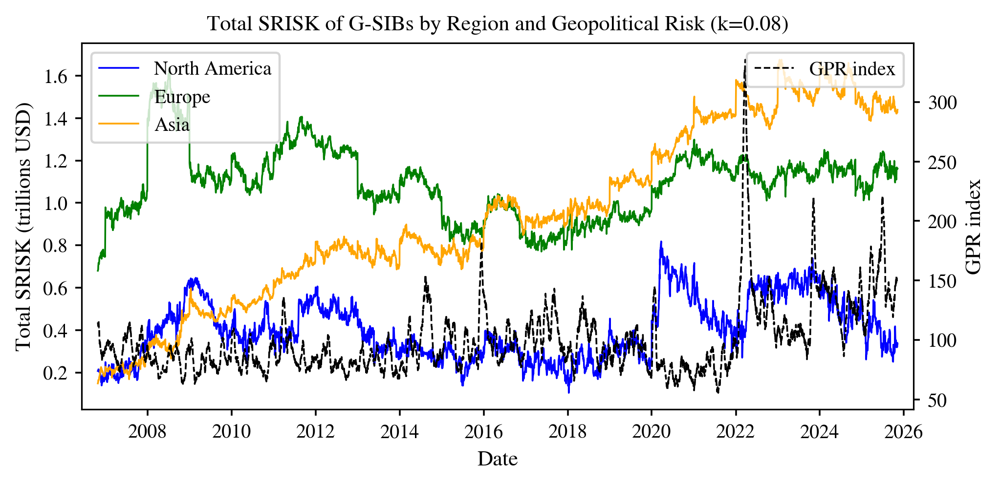

In [68]:
# Also plot it with the GPR index on a double axis
colors = ["blue", "green", "orange", "black"]
fig, ax1 = plt.subplots(figsize=FIG_FULL)
ax2 = ax1.twinx()
for (region, srisk_series), color in zip(GSIBs_SRISK_region_usd.items(), colors[:-1]):
    ax1.plot(
        srisk_series.index,
        srisk_series / 1e6,  # Convert millions to trillions
        label=region,
        linewidth=0.8,
        color=color
    )
# Right axis: GPR index
ax2.plot(
    gpr_data.index,
    gpr_data["GPR"],
    color="black",
    linestyle="--",
    linewidth=0.8,
    label="GPR index"
)  
ax1.set_title(f"Total SRISK of G-SIBs by Region and Geopolitical Risk (k={k_region})", pad=6)
ax1.set_xlabel("Date")
ax1.set_ylabel("Total SRISK (trillions USD)")
ax2.set_ylabel("GPR index")
# Legends (kept separate for clarity)
ax1.legend(loc="upper left", frameon=True, fontsize=9)
ax2.legend(loc="upper right", frameon=True, fontsize=9)
ax1.grid(False)
ax1.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_by_region_with_gpr.pdf")
plt.show()


Then we look at the actual region decomposition. The SRISK share (stacked 100%)

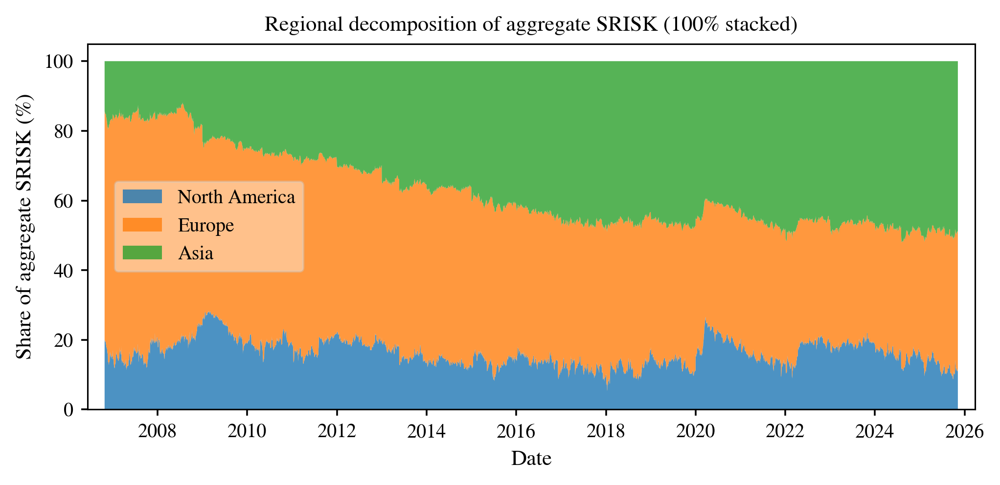

In [69]:
# Make a 100% stacked area chart to see the relative contributions of each region to total SRISK for k=0.08
k_region = 0.08
fig, ax = plt.subplots(figsize=FIG_FULL)

region_srisk_df = pd.DataFrame(GSIBs_SRISK_region_usd)
region_srisk_df.index = pd.to_datetime(region_srisk_df.index)
region_srisk_df = region_srisk_df.sort_index()

region_srisk_pct = region_srisk_df.div(region_srisk_df.sum(axis=1), axis=0)

ax.stackplot(
    region_srisk_pct.index,
    [region_srisk_pct[region] * 100 for region in region_srisk_pct.columns],
    labels=region_srisk_pct.columns,
    alpha=0.8
)

ax.set_title("Regional decomposition of aggregate SRISK (100% stacked)", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Share of aggregate SRISK (%)")

leg = ax.legend(loc="center left", bbox_to_anchor=(0.02, 0.5), frameon=True, fontsize=9)
leg.get_frame().set_alpha(0.4)

ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_by_region_stacked_pct.pdf")
plt.show()


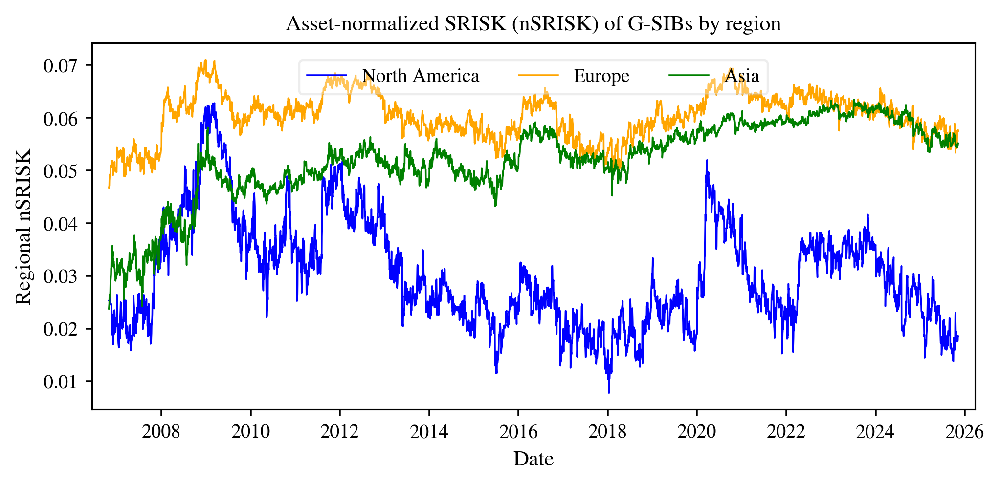

In [70]:
# Regional asset-normalized SRISK (nSRISK) for k=0.08
k_region = 0.08

GSIBs_nSRISK_region = {}
for region, banks in banks_by_region.items():
    srisk_region = GSIBs_SRISK_with_max[k_region][banks].sum(axis=1)
    assets_region = GSIBs_assets_usd[banks].sum(axis=1)
    GSIBs_nSRISK_region[region] = (srisk_region / assets_region).replace([np.inf, -np.inf], np.nan)

# --- Plot styling consistent with other regional figures ---
region_order = ["North America", "Europe", "Asia"]
region_colors = {
    "North America": "blue",
    "Europe": "orange",
    "Asia": "green",
}

fig, ax = plt.subplots(figsize=FIG_FULL)

for region in region_order:
    nsrisk_series = GSIBs_nSRISK_region[region]
    ax.plot(
        nsrisk_series.index,
        nsrisk_series,
        label=region,
        linewidth=0.8,
        color=region_colors[region],
    )

ax.set_title(f"Asset-normalized SRISK (nSRISK) of G-SIBs by region", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Regional nSRISK")

leg = ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 0.98),
    frameon=True,
    fontsize=9,
    ncol=3
)
leg.get_frame().set_alpha(0.35)

ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()

fig.savefig(FIG_DIR / "nSRISK_by_region.pdf")
# Optional: also save png for quicker LaTeX compilation previews
# fig.savefig(FIG_DIR / "nSRISK_by_region.png", dpi=300)

plt.show()

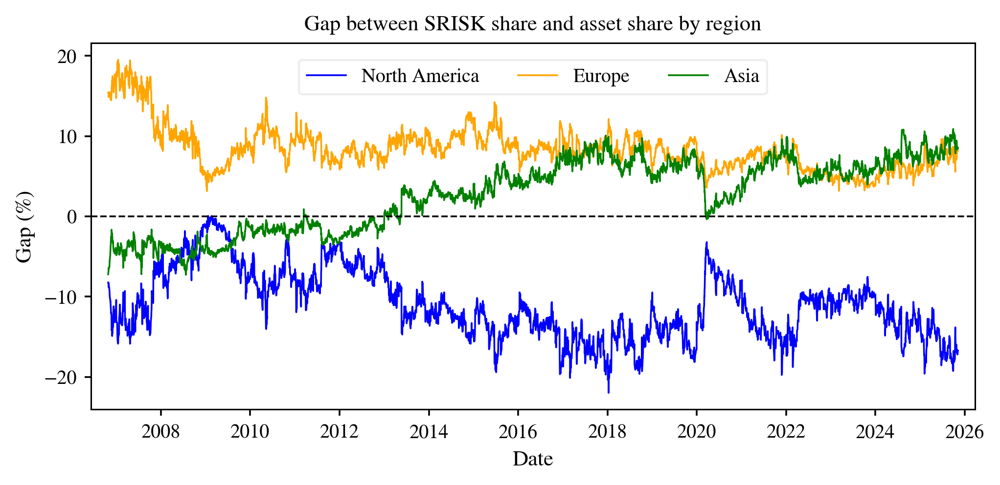

In [71]:
# Create a gap plot between SRISK share and asset share by region for k=0.08
k_region = 0.08

fig, ax = plt.subplots(figsize=FIG_FULL)

# SRISK by region (levels)
region_srisk_df = pd.DataFrame({
    region: GSIBs_SRISK_with_max[k_region][banks].sum(axis=1)
    for region, banks in banks_by_region.items()
})
region_srisk_df.index = pd.to_datetime(region_srisk_df.index)

# Assets by region (levels)
region_assets_df = pd.DataFrame({
    region: GSIBs_assets_usd[banks].sum(axis=1)
    for region, banks in banks_by_region.items()
})
region_assets_df.index = pd.to_datetime(region_assets_df.index)

# Convert to shares
region_srisk_pct  = region_srisk_df.div(region_srisk_df.sum(axis=1), axis=0)
region_assets_pct = region_assets_df.div(region_assets_df.sum(axis=1), axis=0)

# Gap in percentage points
gap_df = (region_srisk_pct - region_assets_pct) * 100

# Keep consistent ordering + colors
region_order = ["North America", "Europe", "Asia"]
region_colors = {"North America": "blue", "Europe": "orange", "Asia": "green"}

for region in region_order:
    ax.plot(gap_df.index, gap_df[region], label=region, linewidth=0.8, color=region_colors[region])

ax.axhline(0, color="black", linestyle="--", linewidth=0.8)
ax.set_title(f"Gap between SRISK share and asset share by region", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Gap (%)")

leg = ax.legend(
    loc="upper center",
    bbox_to_anchor=(0.5, 0.98),
    frameon=True,
    fontsize=9,
    ncol=3
)
leg.get_frame().set_alpha(0.35)

ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "SRISK_asset_share_gap_by_region.pdf")
plt.show()


## Concentration

It would also be interesting to look at the top 5 and top 10 banks (in SRISK volume) compared to the rest of the G-SIBs

In [72]:
# Decide which 10 G-SIBs have the highest SRISK as of the most recent date for k=0.08
k_recent = 0.08
most_recent_date = GSIBs_SRISK_with_max[k_recent].index.max()
srisk_recent = GSIBs_SRISK_with_max[k_recent].loc[most_recent_date]
top_10_banks = srisk_recent.nlargest(10).index.tolist()
print(f"Top 10 G-SIBs by SRISK on {most_recent_date.date()} (k=0.08):")
for bank in top_10_banks:
    print(f"- {bank}")

# Also decide which 5 G-SIBs have the highest SRISK as of the most recent date
k_recent = 0.08
most_recent_date = GSIBs_SRISK_with_max[k_recent].index.max()
srisk_recent = GSIBs_SRISK_with_max[k_recent].loc[most_recent_date]
top_5_banks = srisk_recent.nlargest(5).index.tolist()
print(f"Top 5 G-SIBs by SRISK on {most_recent_date.date()} (k=0.08):")
for bank in top_5_banks:
    print(f"- {bank}")

Top 10 G-SIBs by SRISK on 2025-11-06 (k=0.08):
- INDL&COML.BOC.
- BANK OF CHINA
- CHINA CON.BANK
- BNP PARIBAS
- CREDIT AGRICOLE
- HSBC HOLDINGS
- BANK OF COMMS.
- BARCLAYS
- SOCIETE GENERALE
- CITIGROUP
Top 5 G-SIBs by SRISK on 2025-11-06 (k=0.08):
- INDL&COML.BOC.
- BANK OF CHINA
- CHINA CON.BANK
- BNP PARIBAS
- CREDIT AGRICOLE


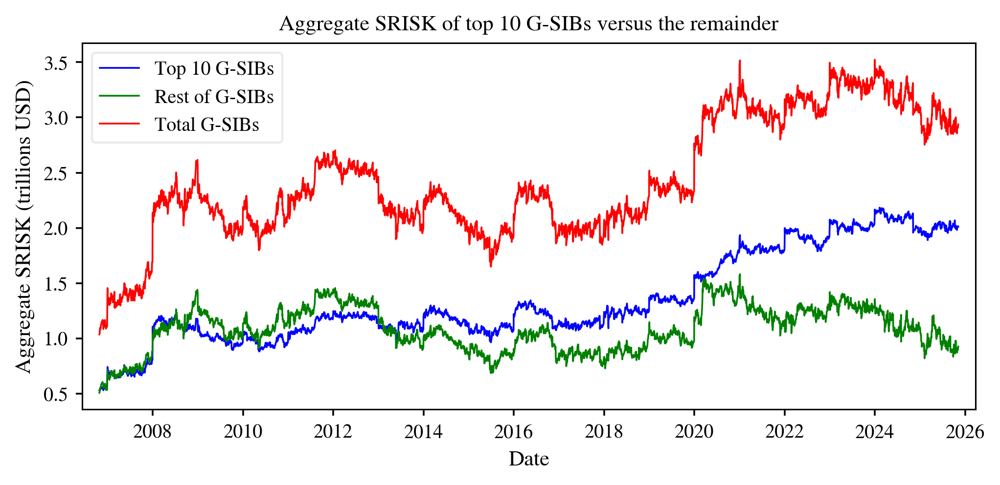

In [73]:
# Make a line plot of the top 10 banks' vs rest of the banks' vs total SRISK over time for k=0.08
k_stacked = 0.08
fig, ax = plt.subplots(figsize=FIG_FULL)

top10_srisk_sum = GSIBs_SRISK_with_max[k_stacked][top_10_banks].sum(axis=1)
all_srisk_sum = GSIBs_SRISK_with_max[k_stacked].sum(axis=1)
rest_srisk_sum = all_srisk_sum - top10_srisk_sum

ax.plot(top10_srisk_sum.index, top10_srisk_sum / 1e6, label='Top 10 G-SIBs', linewidth=0.8, color='blue')
ax.plot(rest_srisk_sum.index,  rest_srisk_sum  / 1e6, label='Rest of G-SIBs', linewidth=0.8, color='green')
ax.plot(all_srisk_sum.index,   all_srisk_sum   / 1e6, label='Total G-SIBs',   linewidth=0.8, color='red')

ax.set_title("Aggregate SRISK of top 10 G-SIBs versus the remainder", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Aggregate SRISK (trillions USD)")

leg = ax.legend(loc="upper left", frameon=True, fontsize=9)
leg.get_frame().set_alpha(0.4)

ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_top10_vs_rest_vs_total.pdf")
plt.show()


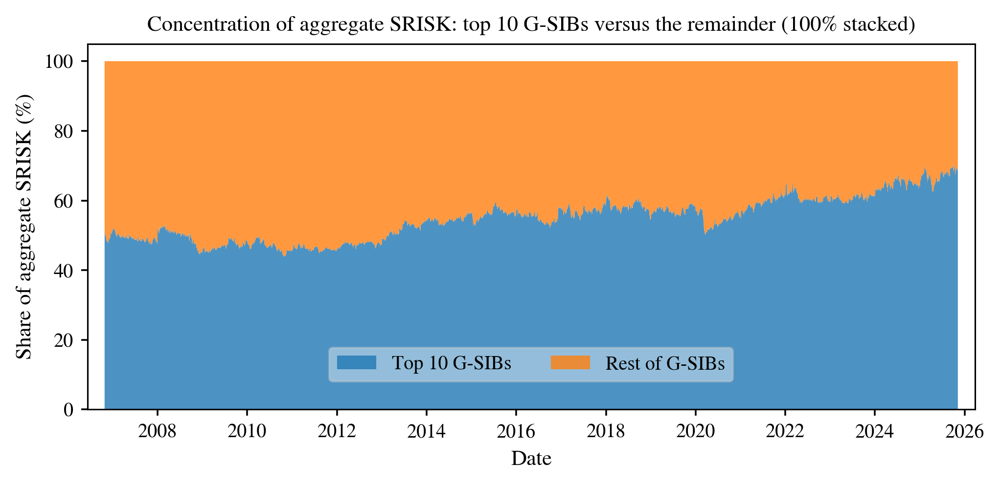

In [74]:
# Make a stacked area chart of the top 10 banks' vs rest of the banks' SRISK over time for k=0.08 (as percentages)
k_stacked = 0.08
fig, ax = plt.subplots(figsize=FIG_FULL)

top10_srisk_sum = GSIBs_SRISK_with_max[k_stacked][top_10_banks].sum(axis=1)
all_srisk_sum = GSIBs_SRISK_with_max[k_stacked].sum(axis=1)
rest_srisk_sum = all_srisk_sum - top10_srisk_sum

top10_srisk_pct = (top10_srisk_sum / all_srisk_sum) * 100
rest_srisk_pct = (rest_srisk_sum / all_srisk_sum) * 100

ax.stackplot(
    top10_srisk_sum.index,
    [top10_srisk_pct, rest_srisk_pct],
    labels=['Top 10 G-SIBs', 'Rest of G-SIBs'],
    alpha=0.8
)

ax.set_title("Concentration of aggregate SRISK: top 10 G-SIBs versus the remainder (100% stacked)", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Share of aggregate SRISK (%)")

leg = ax.legend(loc="lower center", bbox_to_anchor=(0.5, 0.05), frameon=True, fontsize=9, ncol=2)
leg.get_frame().set_alpha(0.4)

ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_top10_vs_rest_stacked_pct.pdf")
plt.show()



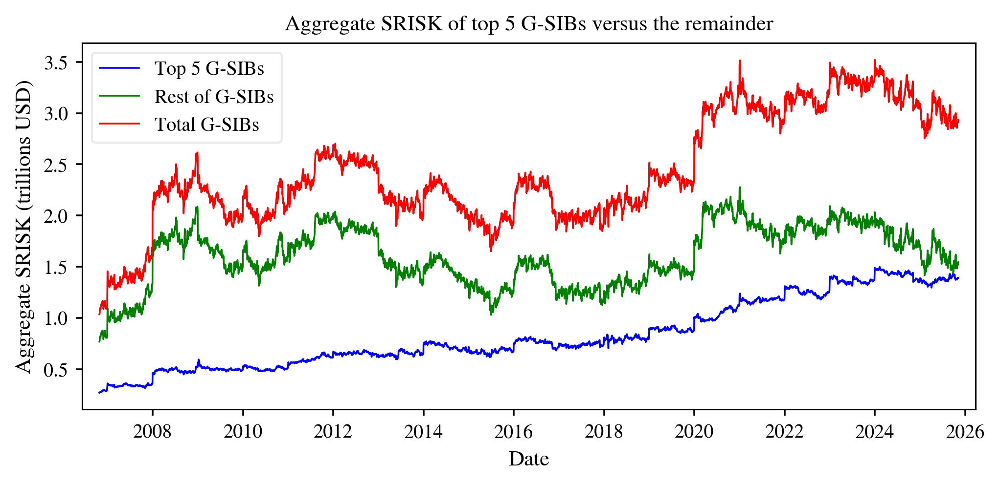

In [75]:
# Make a line plot of the top 5 banks' vs rest of the banks' vs total SRISK over time for k=0.08
k_stacked = 0.08
fig, ax = plt.subplots(figsize=FIG_FULL)

top5_srisk_sum = GSIBs_SRISK_with_max[k_stacked][top_5_banks].sum(axis=1)
all_srisk_sum = GSIBs_SRISK_with_max[k_stacked].sum(axis=1)
rest_srisk_sum = all_srisk_sum - top5_srisk_sum

ax.plot(top5_srisk_sum.index, top5_srisk_sum / 1e6, label='Top 5 G-SIBs',  linewidth=0.8, color='blue')
ax.plot(rest_srisk_sum.index, rest_srisk_sum / 1e6, label='Rest of G-SIBs', linewidth=0.8, color='green')
ax.plot(all_srisk_sum.index,  all_srisk_sum  / 1e6, label='Total G-SIBs',   linewidth=0.8, color='red')

ax.set_title("Aggregate SRISK of top 5 G-SIBs versus the remainder", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Aggregate SRISK (trillions USD)")

leg = ax.legend(loc="upper left", frameon=True, fontsize=9)
leg.get_frame().set_alpha(0.4)

ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_top5_vs_rest_vs_total.pdf")
plt.show()

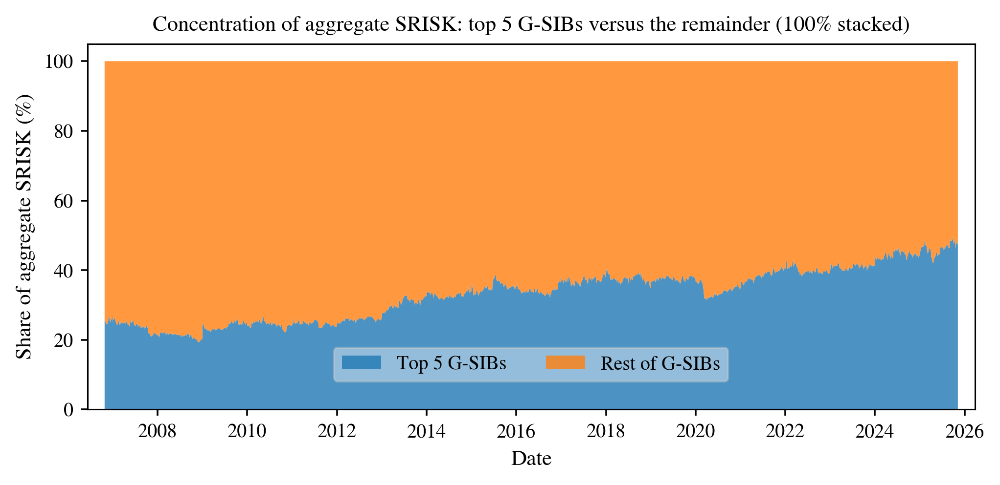

In [76]:
# Make a stacked area chart of the top 5 banks' vs rest of the banks' SRISK over time for k=0.08 (as percentages)
k_stacked = 0.08
fig, ax = plt.subplots(figsize=FIG_FULL)

top5_srisk_sum = GSIBs_SRISK_with_max[k_stacked][top_5_banks].sum(axis=1)
all_srisk_sum = GSIBs_SRISK_with_max[k_stacked].sum(axis=1)
rest_srisk_sum = all_srisk_sum - top5_srisk_sum

top5_srisk_pct = (top5_srisk_sum / all_srisk_sum) * 100
rest_srisk_pct = (rest_srisk_sum / all_srisk_sum) * 100

ax.stackplot(
    top5_srisk_sum.index,
    [top5_srisk_pct, rest_srisk_pct],
    labels=['Top 5 G-SIBs', 'Rest of G-SIBs'],
    alpha=0.8
)

ax.set_title("Concentration of aggregate SRISK: top 5 G-SIBs versus the remainder (100% stacked)", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Share of aggregate SRISK (%)")

leg = ax.legend(loc="lower center", bbox_to_anchor=(0.5, 0.05), frameon=True, fontsize=9, ncol=2)
leg.get_frame().set_alpha(0.4)

ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_top5_vs_rest_stacked_pct.pdf")
plt.show()

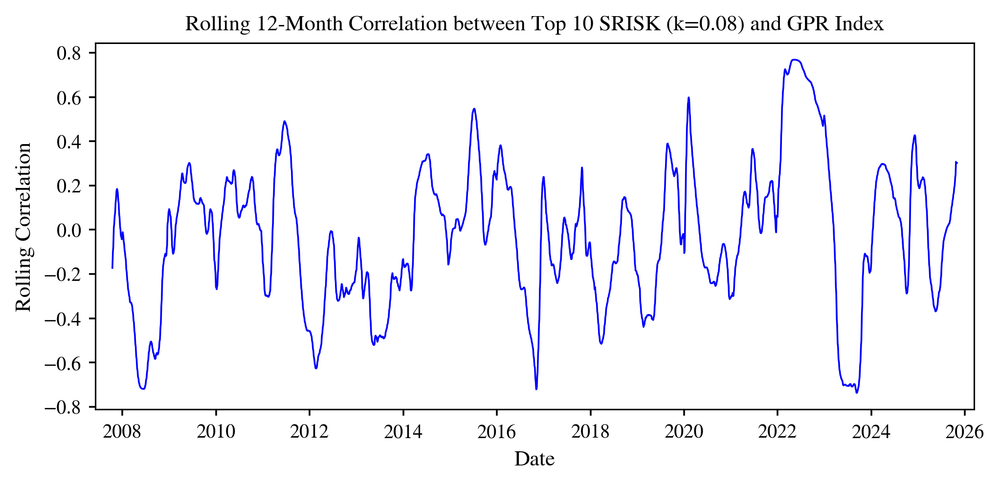

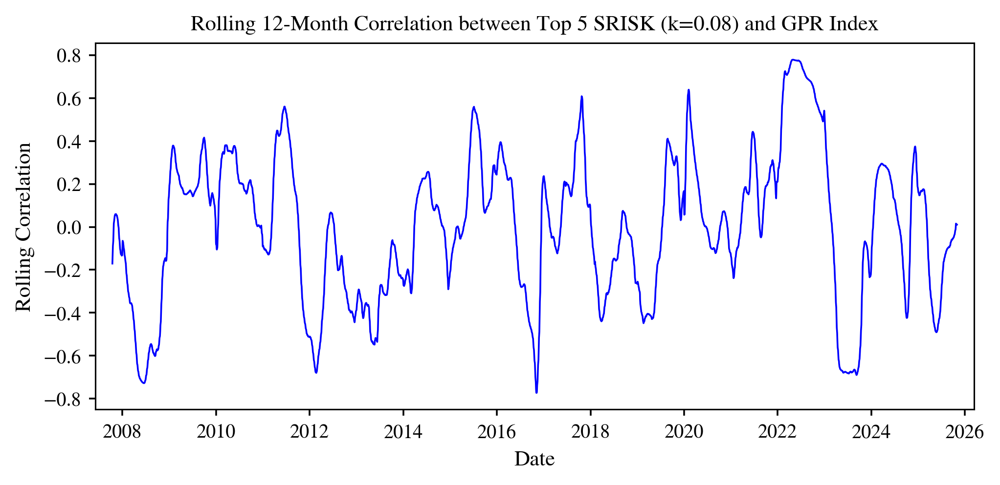

In [77]:
# Do a rolling window correlation between aggregate top 10 and top 5 SRISK and GPR index for k=0.08
k = 0.08
window_size = 252  # in trading days (approximately 12 months)
for top_n, banks in [("Top 10", top_10_banks), ("Top 5", top_5_banks)]:
    srisk_sorted = GSIBs_SRISK_with_max[k][banks].sum(axis=1).sort_index()
    gpr_sorted = gpr_data.sort_index()
    merged_data = pd.merge(
        srisk_sorted.rename('Total_SRISK'),
        gpr_sorted,
        left_index=True,
        right_index=True,
        how='inner'
    )
    rolling_corr = merged_data['Total_SRISK'].rolling(window=window_size).corr(merged_data['GPR'])
    # Plot the rolling correlation
    fig, ax = plt.subplots(figsize=FIG_FULL)
    ax.plot(
        rolling_corr.index,
        rolling_corr,
        color="blue",
        linewidth=0.8
    )
    ax.set_title(f"Rolling 12-Month Correlation between {top_n} SRISK (k={k}) and GPR Index", pad=6)
    ax.set_xlabel("Date")
    ax.set_ylabel("Rolling Correlation")
    ax.grid(False)
    ax.margins(x=0.02)
    fig.tight_layout()
    fig.savefig(FIG_DIR / f"Rolling_Correlation_{top_n}_SRISK_GPR.pdf")
    plt.show()

### Top banks per region

If we take it a step further, we can even look at the top 3 banks per region and compare them to the rest of the region

In [95]:
# Decide which 3 G-SIBs per region have the highest SRISK on a specified date (k=0.08)
k_top_region = 0.08
RANK_DATE = "2025-11-07"   # <- change this

srisk_df = GSIBs_SRISK_with_max[k_top_region].copy()
srisk_df.index = pd.to_datetime(srisk_df.index)

rank_date = pd.to_datetime(RANK_DATE)

# If exact date not available (weekend/holiday), use most recent available date <= RANK_DATE
if rank_date not in srisk_df.index:
    srisk_upto = srisk_df.loc[srisk_df.index <= rank_date]
    if srisk_upto.empty:
        raise ValueError(
            f"No SRISK data on or before {rank_date.date()}. "
            f"First available date is {srisk_df.index.min().date()}."
        )
    used_date = srisk_upto.index.max()
else:
    used_date = rank_date

top_banks_by_region = {}

for region, banks in banks_by_region.items():
    # Keep only banks that actually exist in the dataframe
    banks_present = [b for b in banks if b in srisk_df.columns]
    if len(banks_present) == 0:
        print(f"Skipping {region}: none of the listed banks are in the SRISK dataframe.")
        continue

    # SRISK values on the chosen date for this region
    srisk_region_on_date = srisk_df.loc[used_date, banks_present].dropna()

    if srisk_region_on_date.empty:
        print(f"Skipping {region}: no SRISK values available on {used_date.date()}.")
        continue

    top_3_banks = srisk_region_on_date.nlargest(3).index.tolist()
    top_banks_by_region[region] = top_3_banks

    print(f"Top 3 G-SIBs in {region} by SRISK on {used_date.date()} (k={k_top_region}):")
    for bank in top_3_banks:
        print(f"- {bank}")
    print()

Top 3 G-SIBs in North America by SRISK on 2025-11-06 (k=0.08):
- CITIGROUP
- BANK OF AMERICA
- WELLS FARGO & CO

Top 3 G-SIBs in Europe by SRISK on 2025-11-06 (k=0.08):
- BNP PARIBAS
- CREDIT AGRICOLE
- HSBC HOLDINGS

Top 3 G-SIBs in Asia by SRISK on 2025-11-06 (k=0.08):
- INDL&COML.BOC.
- BANK OF CHINA
- CHINA CON.BANK



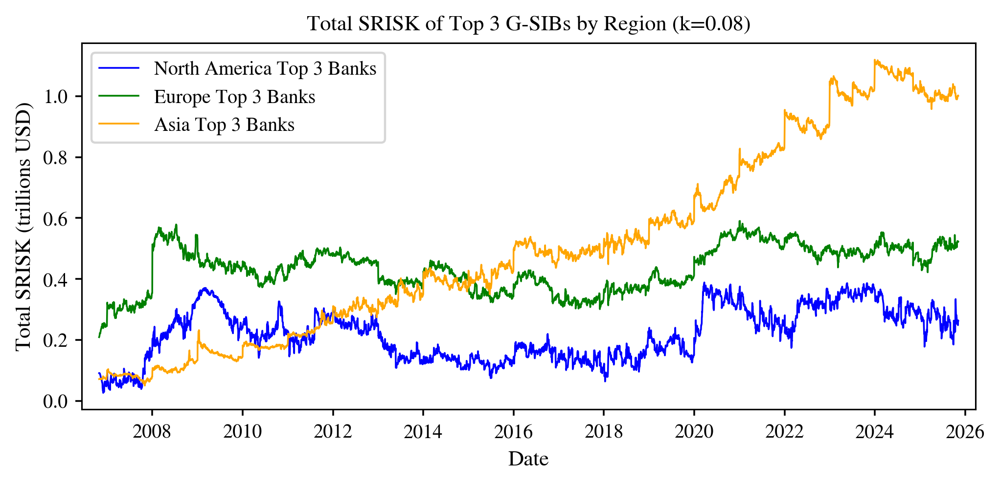

In [96]:
# Plot the aggregate SRISK of each region's top 3 banks over time for k=0.08
k_region_top = 0.08
GSIBs_SRISK_region_top3_usd = {}
for region, banks in top_banks_by_region.items():
    GSIBs_SRISK_region_top3_usd[region] = GSIBs_SRISK_with_max[k_region_top][banks].sum(axis=1)
# Plot aggregate SRISK of each region's top 3 banks over time
colors = ["blue", "green", "orange"]
fig, ax = plt.subplots(figsize=FIG_FULL)
for (region, srisk_series), color in zip(GSIBs_SRISK_region_top3_usd.items(), colors):
    ax.plot(
        srisk_series.index,
        srisk_series / 1e6,  # Convert millions to trillions
        label=f"{region} Top 3 Banks",
        linewidth=0.8,
        color=color
    )
ax.set_title(f"Total SRISK of Top 3 G-SIBs by Region (k={k_region_top})", pad=6)
ax.set_xlabel("Date")
ax.set_ylabel("Total SRISK (trillions USD)")
ax.legend(loc="best", frameon=True, fontsize=9)
ax.grid(False)
ax.margins(x=0.02)
fig.tight_layout()
fig.savefig(FIG_DIR / "Agg_SRISK_top3_by_region.pdf")
plt.show()

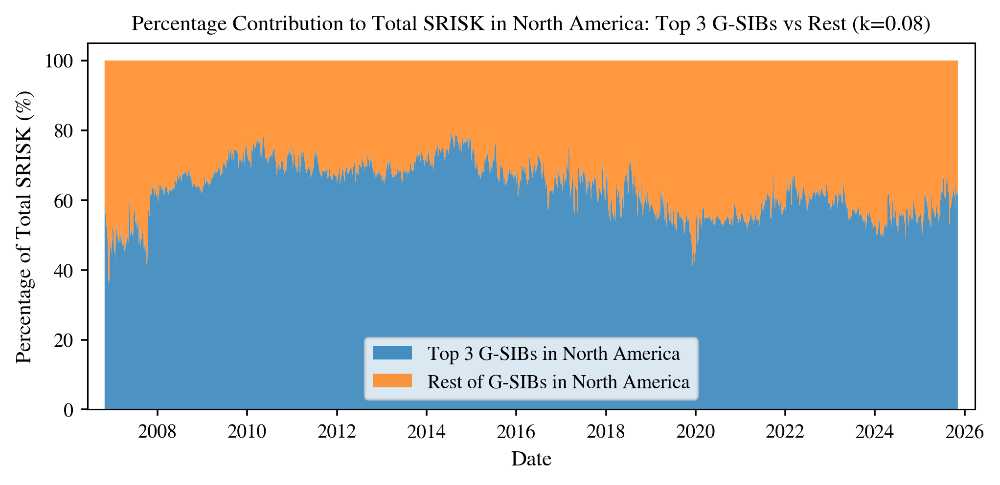

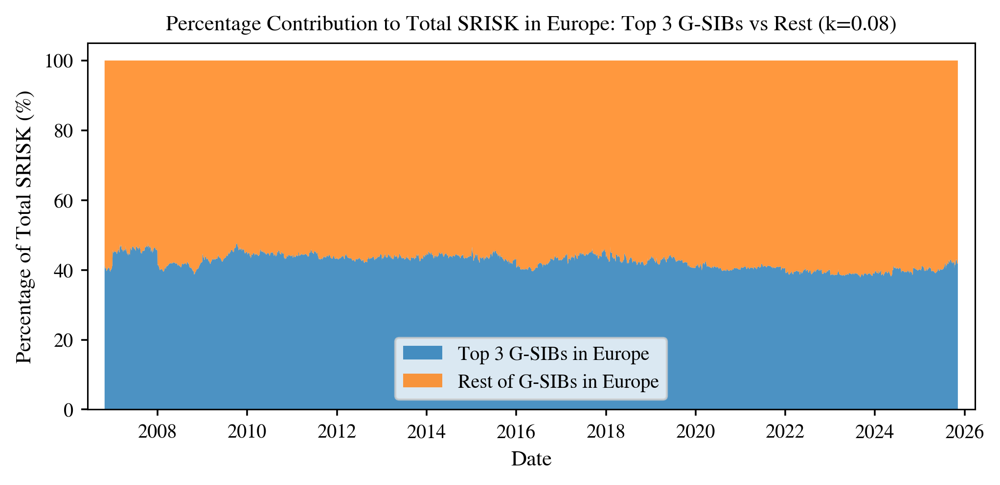

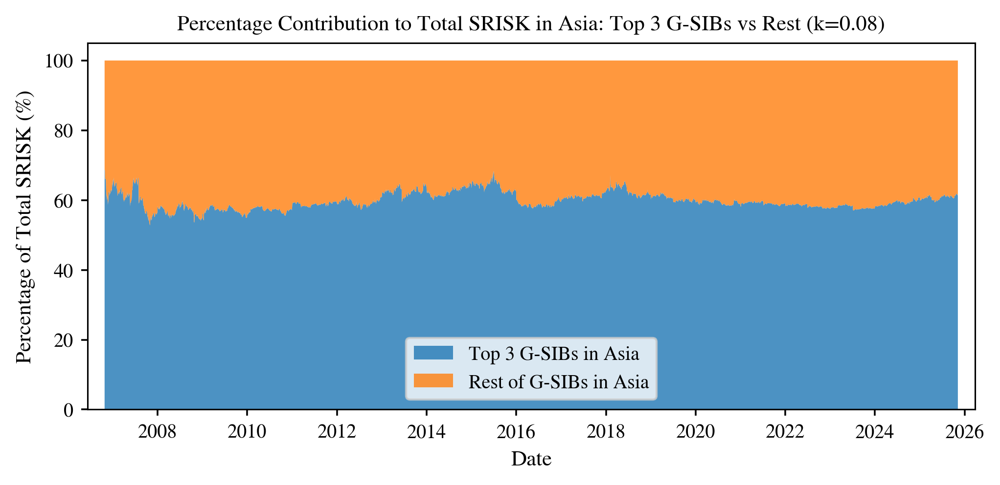

In [80]:
# Make a stacked percentage area chart per region showing the top 3 banks' vs rest of the banks' SRISK over time for k=0.08
k_stacked_region = 0.08
for region, banks in banks_by_region.items():
    top_3_banks = top_banks_by_region[region]
    
    fig, ax = plt.subplots(figsize=FIG_FULL)
    
    # Sum SRISK for top 3 banks in the region
    top3_srisk_sum = GSIBs_SRISK_with_max[k_stacked_region][top_3_banks].sum(axis=1)
    
    # Sum SRISK for the rest of the banks in the region
    region_srisk_sum = GSIBs_SRISK_with_max[k_stacked_region][banks].sum(axis=1)
    rest_srisk_sum = region_srisk_sum - top3_srisk_sum
    
    # Prepare data for stackplot (convert to percentages)
    top3_srisk_pct = (top3_srisk_sum / region_srisk_sum) * 100
    rest_srisk_pct = (rest_srisk_sum / region_srisk_sum) * 100
    
    ax.stackplot(
        top3_srisk_sum.index,
        [top3_srisk_pct, rest_srisk_pct],
        labels=[f'Top 3 G-SIBs in {region}', f'Rest of G-SIBs in {region}'],
        alpha=0.8
    )
    
    ax.set_title(f"Percentage Contribution to Total SRISK in {region}: Top 3 G-SIBs vs Rest (k={k_stacked_region})", pad=6)
    ax.set_xlabel("Date")
    ax.set_ylabel("Percentage of Total SRISK (%)")
    ax.legend(loc="best", frameon=True, fontsize=9)
    ax.grid(False)
    ax.margins(x=0.02)
    fig.tight_layout()
    fig.savefig(FIG_DIR / f"Agg_SRISK_top3_vs_rest_stacked_pct_{region.replace(' ', '_')}.pdf")
    plt.show()

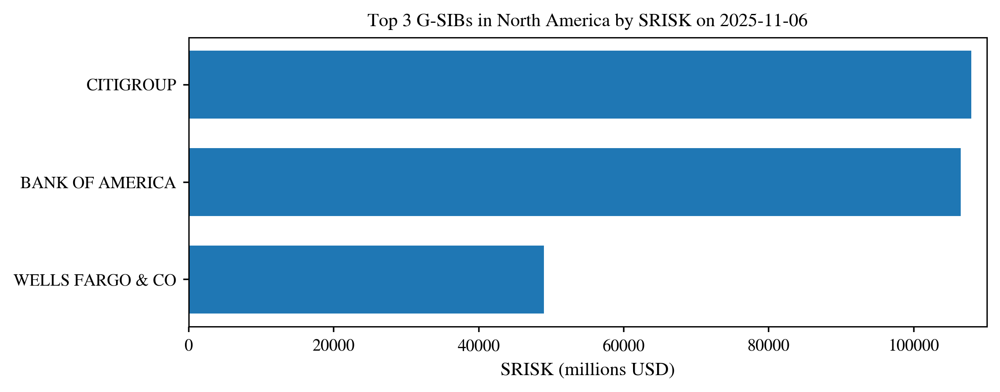

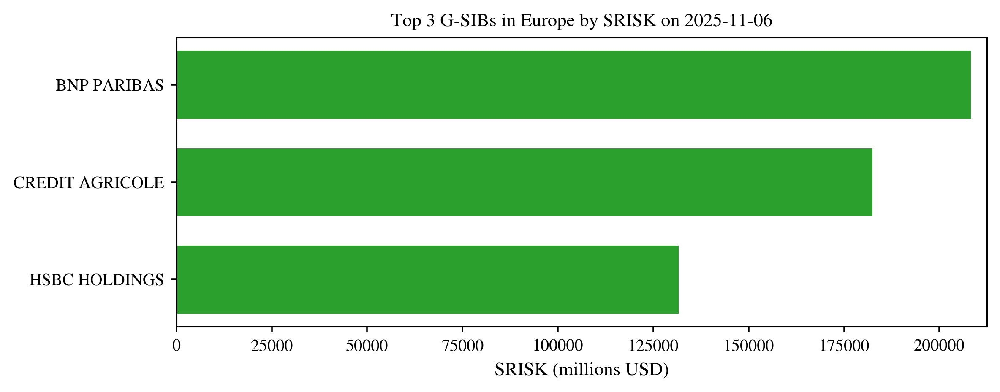

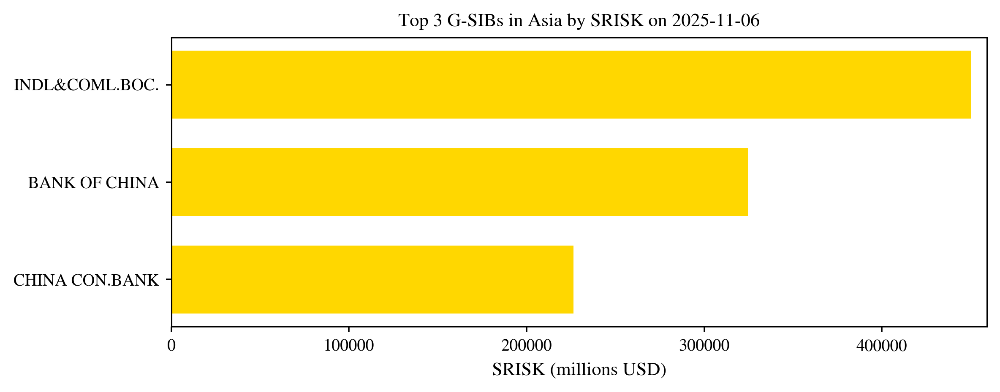

In [102]:
# Horizontal bar charts: Top 3 G-SIBs per region on a specified date (k=0.08)
# Colors: Europe=green, North America=blue, Asia=yellow

k_top_region = 0.08
RANK_DATE = "2025-11-06"   # <- change this

# Optional cap for readability (SRISK is in "millions")
# 1e6 millions = 1 trillion
cap_millions = None  # e.g., 1e6; set None to disable

# Region colors (as requested)
region_colors = {
    "Europe": "tab:green",
    "North America": "tab:blue",
    "Asia": "gold",          # "yellow" but more visible
}

srisk_df = GSIBs_SRISK_with_max[k_top_region].copy()
srisk_df.index = pd.to_datetime(srisk_df.index)

rank_date = pd.to_datetime(RANK_DATE)

# If exact date not available (weekend/holiday), use most recent available date <= RANK_DATE
if rank_date not in srisk_df.index:
    srisk_upto = srisk_df.loc[srisk_df.index <= rank_date]
    if srisk_upto.empty:
        raise ValueError(
            f"No SRISK data on or before {rank_date.date()}. "
            f"First available date is {srisk_df.index.min().date()}."
        )
    used_date = srisk_upto.index.max()
else:
    used_date = rank_date

# Compute Top-3 per region at that date
top_banks_by_region = {}

for region, banks in banks_by_region.items():
    banks_present = [b for b in banks if b in srisk_df.columns]
    if len(banks_present) == 0:
        print(f"Skipping {region}: none of the listed banks are in the SRISK dataframe.")
        continue

    srisk_region_on_date = srisk_df.loc[used_date, banks_present].dropna()

    if cap_millions is not None:
        srisk_region_on_date = srisk_region_on_date[srisk_region_on_date < cap_millions]

    if srisk_region_on_date.empty:
        print(f"Skipping {region}: no SRISK values available on {used_date.date()}.")
        continue

    top_3 = srisk_region_on_date.nlargest(3)
    top_banks_by_region[region] = top_3.index.tolist()

# Plot: one chart per region
for region, top_banks in top_banks_by_region.items():
    vals = srisk_df.loc[used_date, top_banks].dropna()

    if vals.empty:
        continue

    # sort ascending so largest appears at top in barh
    vals_plot = vals.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=(7.5, 3.0))
    ax.barh(vals_plot.index, vals_plot.values, height=0.7, color=region_colors.get(region, "tab:gray"))

    ax.set_title(f"Top 3 G-SIBs in {region} by SRISK on {used_date.date()}", pad=6)
    ax.set_xlabel("SRISK (millions USD)")
    ax.set_ylabel("")

    ax.grid(False)
    ax.margins(x=0.02)
    ax.tick_params(axis="y", labelsize=9)

    fig.tight_layout()
    plt.show()

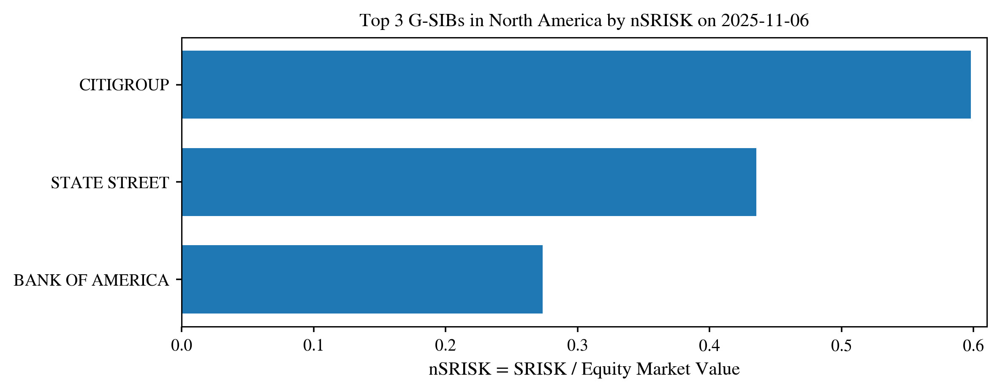

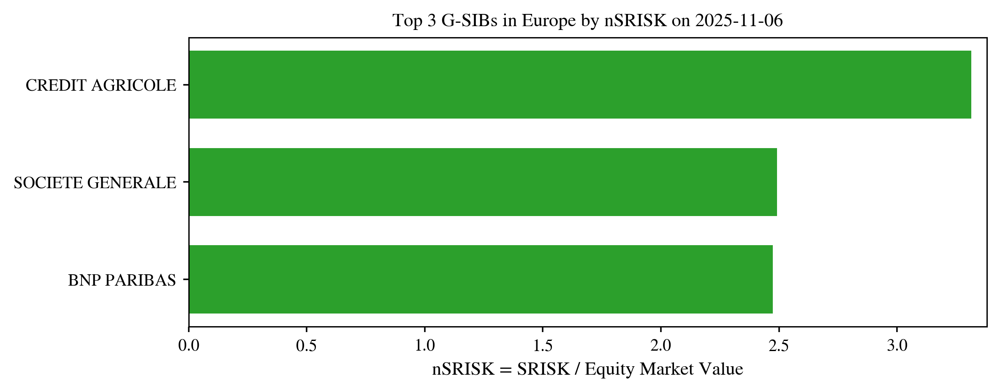

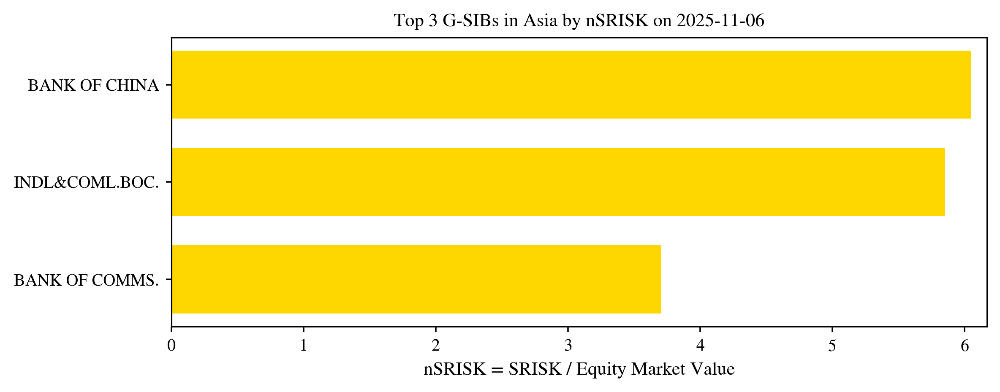

In [101]:
# Top 3 G-SIBs per region by normalized SRISK (SRISK / Equity market value) on a specified date

k_top_region = 0.08
RANK_DATE = "2025-11-06"   # <- change this

# Optional cap for readability (ratio)
cap_ratio = None  # e.g., 1.0; set None to disable

region_colors = {
    "Europe": "tab:green",
    "North America": "tab:blue",
    "Asia": "gold",  # yellow but more visible
}

df = GSIBs_nSRISK[k_top_region].copy()
df.index = pd.to_datetime(df.index)

rank_date = pd.to_datetime(RANK_DATE)

# nearest prior date if missing
if rank_date not in df.index:
    df_upto = df.loc[df.index <= rank_date]
    if df_upto.empty:
        raise ValueError(
            f"No nSRISK(EV) data on or before {rank_date.date()}. "
            f"First available date is {df.index.min().date()}."
        )
    used_date = df_upto.index.max()
else:
    used_date = rank_date

top_banks_by_region = {}

# Compute Top-3 per region at that date using normalized values
for region, banks in banks_by_region.items():
    banks_present = [b for b in banks if b in df.columns]
    if not banks_present:
        print(f"Skipping {region}: none of the listed banks are in GSIBs_nSRISK.")
        continue

    vals_region = df.loc[used_date, banks_present].dropna()

    if cap_ratio is not None:
        vals_region = vals_region[vals_region < cap_ratio]

    if vals_region.empty:
        print(f"Skipping {region}: no values on {used_date.date()}.")
        continue

    top_3 = vals_region.nlargest(3)
    top_banks_by_region[region] = top_3.index.tolist()

# Plot: one chart per region
for region, top_banks in top_banks_by_region.items():
    vals = df.loc[used_date, top_banks].dropna()
    if vals.empty:
        continue

    vals_plot = vals.sort_values(ascending=True)  # biggest appears at top in barh

    fig, ax = plt.subplots(figsize=(7.5, 3.0))
    ax.barh(vals_plot.index, vals_plot.values, height=0.7,
            color=region_colors.get(region, "tab:gray"))

    ax.set_title(f"Top 3 G-SIBs in {region} by nSRISK on {used_date.date()}", pad=6)
    ax.set_xlabel("nSRISK = SRISK / Equity Market Value")
    ax.set_ylabel("")
    ax.grid(False)
    ax.margins(x=0.02)
    ax.tick_params(axis="y", labelsize=9)

    fig.tight_layout()
    plt.show()

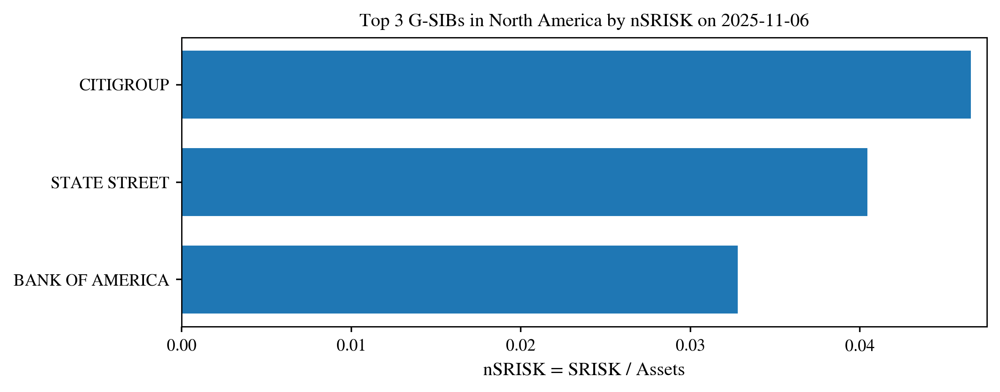

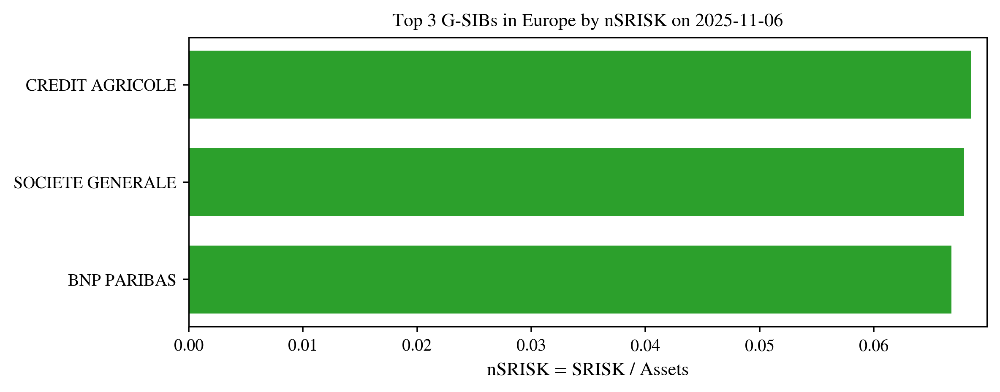

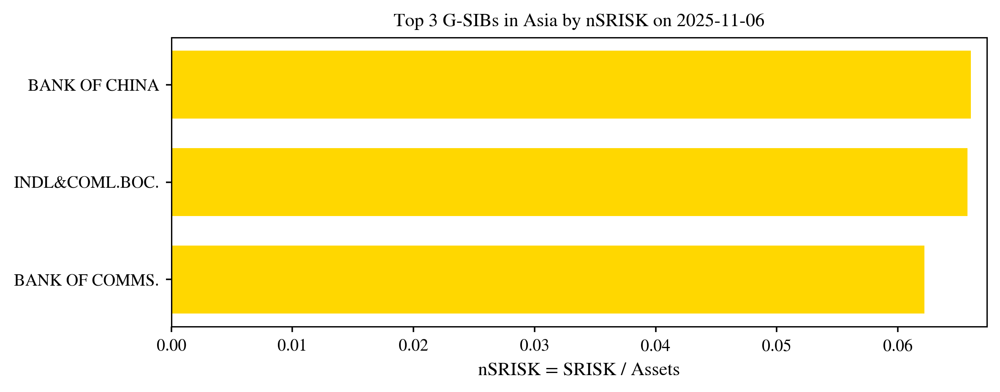

In [104]:
# Top 3 G-SIBs per region by normalized SRISK (SRISK / Assets) on a specified date

k_top_region = 0.08
RANK_DATE = "2025-11-06"   # <- change this

# Optional cap for readability (ratio)
cap_ratio = None  # e.g., 0.2; set None to disable

region_colors = {
    "Europe": "tab:green",
    "North America": "tab:blue",
    "Asia": "gold",  # yellow but more visible
}

df = GSIBs_nSRISK_assets[k_top_region].copy()
df.index = pd.to_datetime(df.index)

rank_date = pd.to_datetime(RANK_DATE)

# nearest prior date if missing
if rank_date not in df.index:
    df_upto = df.loc[df.index <= rank_date]
    if df_upto.empty:
        raise ValueError(
            f"No nSRISK(Assets) data on or before {rank_date.date()}. "
            f"First available date is {df.index.min().date()}."
        )
    used_date = df_upto.index.max()
else:
    used_date = rank_date

top_banks_by_region = {}

# Compute Top-3 per region at that date using normalized values
for region, banks in banks_by_region.items():
    banks_present = [b for b in banks if b in df.columns]
    if not banks_present:
        print(f"Skipping {region}: none of the listed banks are in GSIBs_nSRISK_assets.")
        continue

    vals_region = df.loc[used_date, banks_present].dropna()

    if cap_ratio is not None:
        vals_region = vals_region[vals_region < cap_ratio]

    if vals_region.empty:
        print(f"Skipping {region}: no values on {used_date.date()}.")
        continue

    top_3 = vals_region.nlargest(3)
    top_banks_by_region[region] = top_3.index.tolist()

# Plot: one chart per region
for region, top_banks in top_banks_by_region.items():
    vals = df.loc[used_date, top_banks].dropna()
    if vals.empty:
        continue

    vals_plot = vals.sort_values(ascending=True)

    fig, ax = plt.subplots(figsize=(7.5, 3.0))
    ax.barh(vals_plot.index, vals_plot.values, height=0.7,
            color=region_colors.get(region, "tab:gray"))

    ax.set_title(f"Top 3 G-SIBs in {region} by nSRISK on {used_date.date()}", pad=6)
    ax.set_xlabel("nSRISK = SRISK / Assets")
    ax.set_ylabel("")
    ax.grid(False)
    ax.margins(x=0.02)
    ax.tick_params(axis="y", labelsize=9)

    fig.tight_layout()
    plt.show()